#**Importing Libraries, Datasets and Function Object**

In [1]:
#Standard libraries
import numpy as np
import pandas as pd
import warnings
from warnings import filterwarnings
filterwarnings('ignore')
import datetime
import calendar

In [2]:
#Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [3]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import *
from sklearn.preprocessing import StandardScaler

In [4]:
from sklearn.preprocessing import LabelEncoder

In [403]:
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import ttest_ind
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
import itertools
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [6]:
df = pd.read_csv('/content/Walmart DataSet.csv')

In [7]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


#**EDA**

In [8]:
#Checking if date column is in object format or datetime format
df.dtypes

,0
Store,int64
Date,object
Weekly_Sales,float64
Holiday_Flag,int64
Temperature,float64
Fuel_Price,float64
CPI,float64
Unemployment,float64


In [9]:
# Date column is in object so converting into datetime
df['Date'] = pd.to_datetime(df['Date'], format = '%d-%m-%Y')

In [10]:
df['Date'].head()

,Date
0,2010-02-05
1,2010-02-12
2,2010-02-19
3,2010-02-26
4,2010-03-05


In [11]:
#Extracting details for seasonal checks and for grouping
df['Day'] = df.Date.dt.day
df['Month'] = df.Date.dt.month
df['Year'] = df.Date.dt.year

In [12]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Day,Month,Year
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,5,2,2010
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,12,2,2010
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,19,2,2010
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,26,2,2010
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,5,3,2010


In [13]:
#changing the months value from numbers to word
df['Month']= df['Month'].apply(lambda x: calendar.month_abbr[x])

In [14]:
df['Month'].head(1)

,Month
0,Feb


In [15]:
# adding 'Week' column to df for further analysis
df['Week'] =df.Date.dt.isocalendar().week

In [16]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Day,Month,Year,Week
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,5,Feb,2010,5
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,12,Feb,2010,6
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,19,Feb,2010,7
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,26,Feb,2010,8
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,5,Mar,2010,9


In [17]:
#checking null values
df.isnull().sum()

,0
Store,0
Date,0
Weekly_Sales,0
Holiday_Flag,0
Temperature,0
Fuel_Price,0
CPI,0
Unemployment,0
Day,0
Month,0


In [18]:
df.duplicated().sum()

0



---No missing values so we can check other details



In [19]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Store,6435.0,23.0,1.0,12.0,23.0,34.0,45.0,12.988182
Date,6435,2011-06-17 00:00:00,2010-02-05 00:00:00,2010-10-08 00:00:00,2011-06-17 00:00:00,2012-02-24 00:00:00,2012-10-26 00:00:00,NaN
Weekly_Sales,6435.0,1046964.877562,209986.25,553350.105,960746.04,1420158.66,3818686.45,564366.622054
Holiday_Flag,6435.0,0.06993,0.0,0.0,0.0,0.0,1.0,0.255049
Temperature,6435.0,60.663782,-2.06,47.46,62.67,74.94,100.14,18.444933
Fuel_Price,6435.0,3.358607,2.472,2.933,3.445,3.735,4.468,0.45902
CPI,6435.0,171.578394,126.064,131.735,182.616521,212.743293,227.232807,39.356712
Unemployment,6435.0,7.999151,3.879,6.891,7.874,8.622,14.313,1.875885
Day,6435.0,15.678322,1.0,8.0,16.0,23.0,31.0,8.75578
Year,6435.0,2010.965035,2010.0,2010.0,2011.0,2012.0,2012.0,0.797019


*For store column std is 12.988 indicating some variation, but the values are fairly close to mean*

*In Weekly_Sales The 25% quartile is around $553,350, and  the 75% is at $1,420,158, suggesting that 50% of the sales lie between these values.*

*For Holiday_Flag 0.255, reflecting the rare occurrence of holidays in the dataset.*

*Temperature column The interquartile range (47.46°F to 74.94°F) suggests that most temperatures fall in a moderate range*

*0.459, indicating some price volatility during this period for Fuel_Price.*

*Std of 39.36, showing notable inflation or economic changes over time in Customer Price Index*

*The 50% unemployment rate lies between 6.891% and 8.622% and Std of 1.88, reflecting moderate variation in unemployment rates.*

In [20]:
df.dtypes

,0
Store,int64
Date,datetime64[ns]
Weekly_Sales,float64
Holiday_Flag,int64
Temperature,float64
Fuel_Price,float64
CPI,float64
Unemployment,float64
Day,int32
Month,object


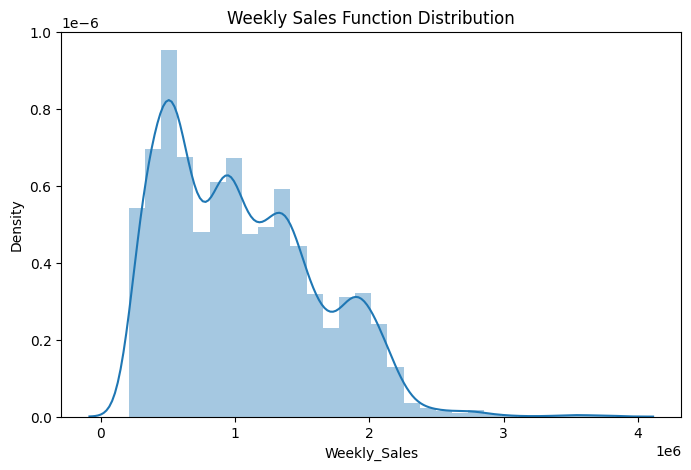

In [21]:
plt.figure(figsize=(8,5))
sns.distplot(df['Weekly_Sales'],bins=30)
plt.title('Weekly Sales Function Distribution')
plt.show()

In [22]:
df_weeks = df.groupby('Week').sum(numeric_only=True)
fig = px.line(df_weeks,x=df_weeks.index, y='Weekly_Sales',labels={'Weekly_Sales':'Weekly Sales','x':'Weeks'}
              ,title= 'Sales over Weeks')
fig.show()

*The mid-year period is relatively stable with fluctuating sales, followed by a sharp decline towards the end of the year and a significant year-end boost likely due to holiday shopping events.*

In [23]:
df.Year.unique()

array([2010, 2011, 2012], dtype=int32)

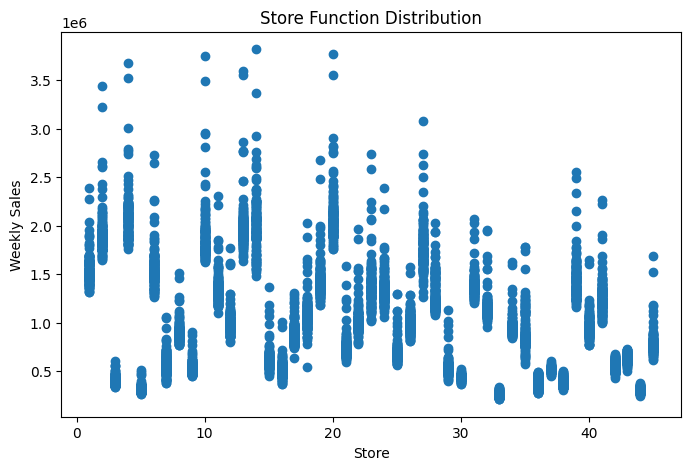

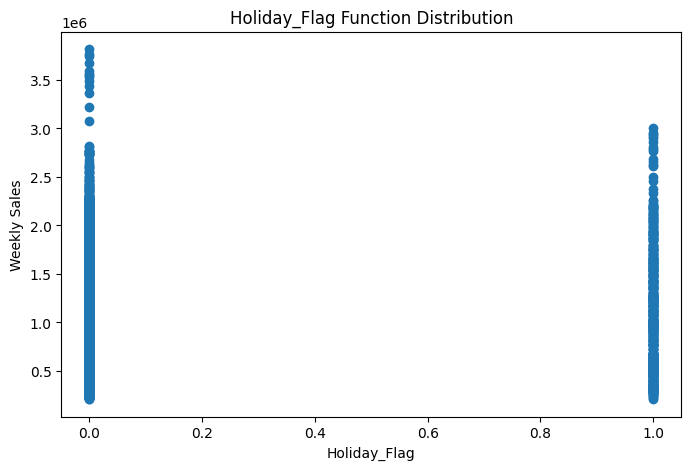

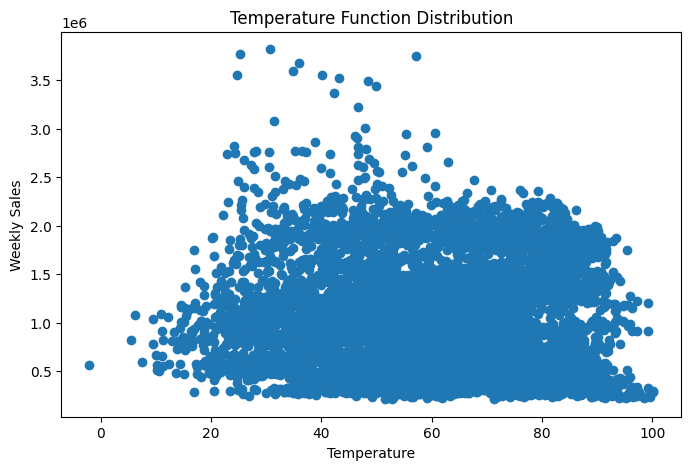

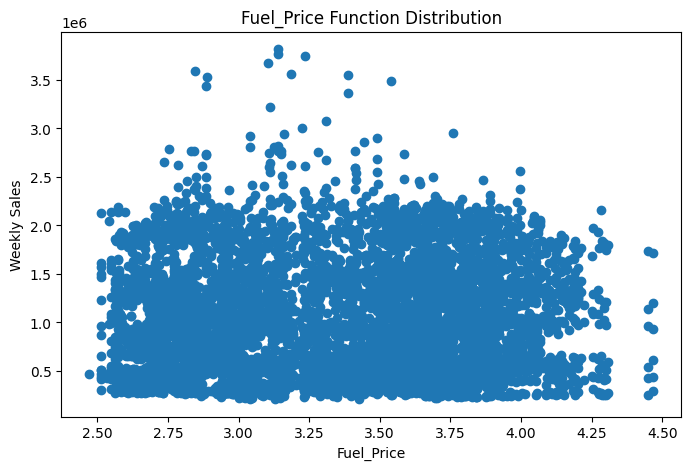

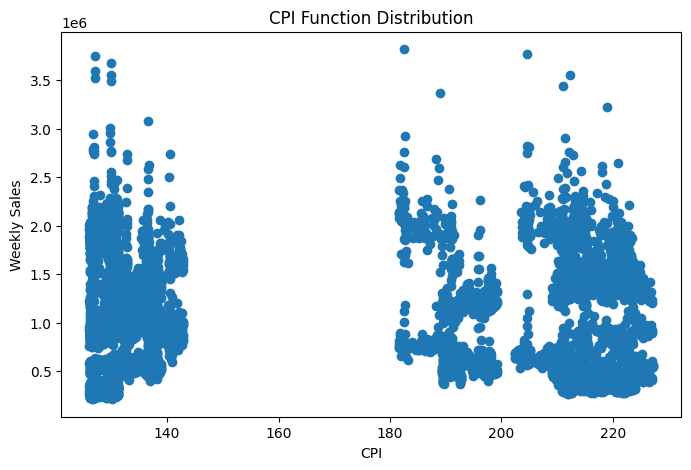

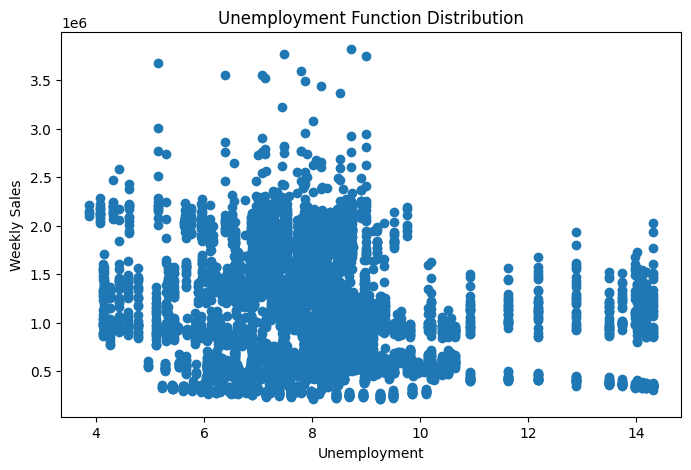

In [24]:
x=['Store','Holiday_Flag','Temperature','Fuel_Price', 'CPI', 'Unemployment']
for i in x:
  plt.figure(figsize=(8,5))
  plt.scatter(df[i],df['Weekly_Sales'])
  plt.xlabel(i)
  plt.ylabel('Weekly Sales')
  plt.title(f'{i} Function Distribution')
  plt.show()


In [25]:
#Visualizing Weekly Sales year wise
Weekly_Sales_2010 = df[df.Year==2010]['Weekly_Sales'].groupby(df.Week).mean()
Weekly_Sales_2011 = df[df.Year==2011]['Weekly_Sales'].groupby(df.Week).mean()
Weekly_Sales_2012 = df[df.Year==2012]['Weekly_Sales'].groupby(df.Week).mean()

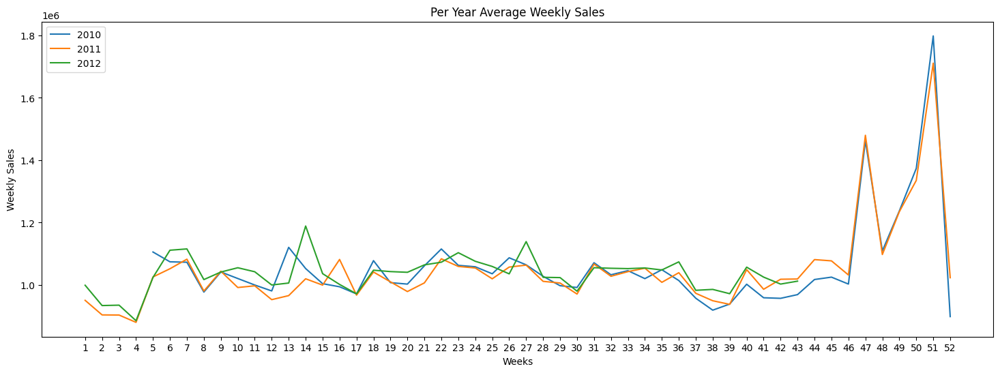

In [26]:
plt.figure(figsize=(18,6))
sns.lineplot(x=Weekly_Sales_2010.index,y=Weekly_Sales_2010.values,label='2010')
sns.lineplot(x=Weekly_Sales_2011.index,y=Weekly_Sales_2011.values,label='2011')
sns.lineplot(x=Weekly_Sales_2012.index,y=Weekly_Sales_2012.values,label='2012')
plt.xticks(np.arange(1,53,1))
plt.title('Per Year Average Weekly Sales')
plt.xlabel('Weeks')
plt.ylabel('Weekly Sales')
plt.show()

*The chart suggests that 2012 might have had the most significant peaks, especially towards the end of the year, indicating potential promotional activities or changes in consumer behavior leading to increased sales.*

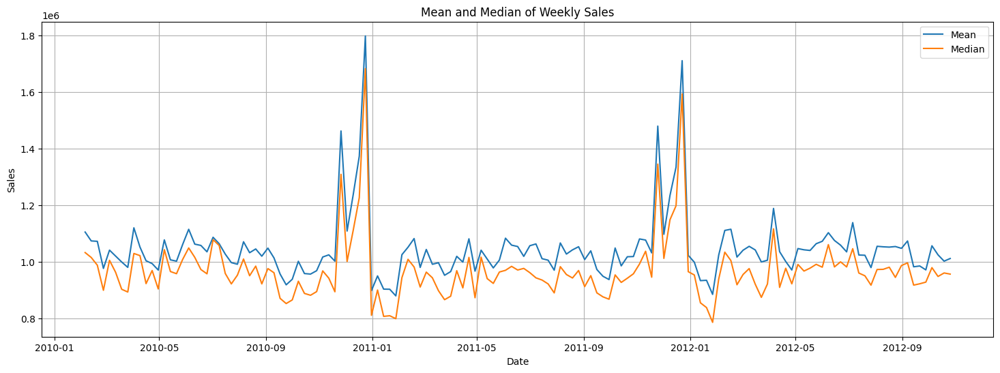

In [27]:
Weekly_Sales_Mean= df['Weekly_Sales'].groupby(df['Date']).mean()
Weekly_Sales_Median= df['Weekly_Sales'].groupby(df['Date']).median()
plt.figure(figsize=(18,6))
sns.lineplot(x=Weekly_Sales_Mean.index,y=Weekly_Sales_Mean.values,label='Mean')
sns.lineplot(x=Weekly_Sales_Median.index,y=Weekly_Sales_Median.values,label='Median')
plt.grid()
plt.title('Mean and Median of Weekly Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()


*sales distribution's central tendency and the impact of outliers on the overall average.*

*mean or median trends upward over time, it indicates general growth in weekly sales, suggesting successful business strategies or increased consumer demand*

#**Analysis of Other Features with Weekly Sales**

<Axes: xlabel='Holiday_Flag', ylabel='Weekly_Sales'>

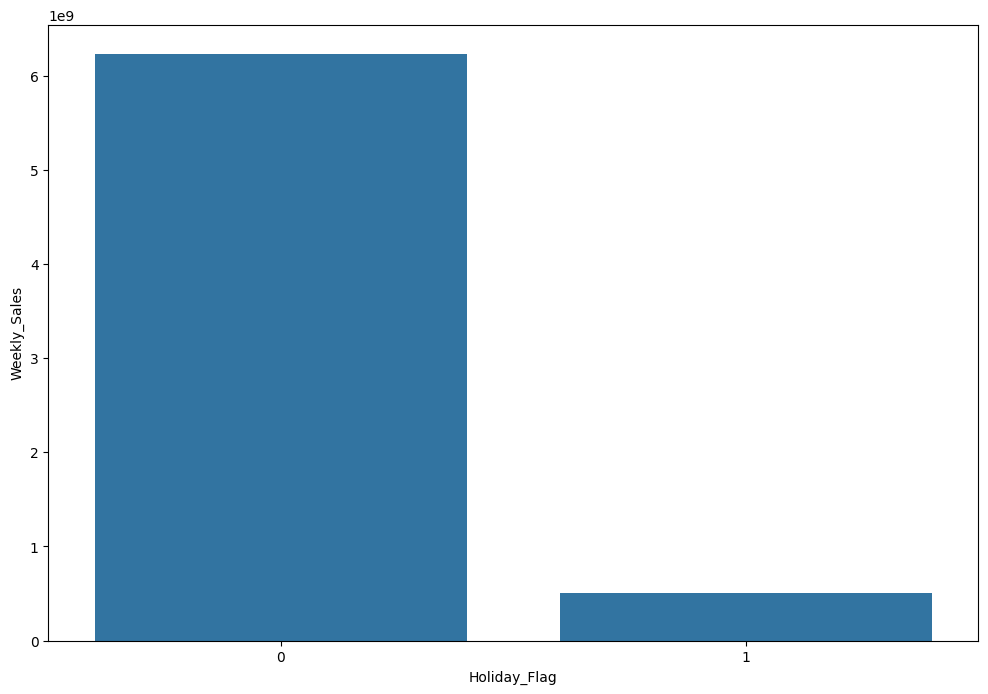

In [28]:
# impact of holidays on weekly sales
df_HolidaySales = df.groupby('Holiday_Flag')['Weekly_Sales'].sum().reset_index()
plt.figure(figsize = (12,8))
sns.barplot(x='Holiday_Flag',y='Weekly_Sales',data=df_HolidaySales)

---The Sales are High In Normal Days, it is Quite common because of that holidays are always low compared to working days


In [29]:
px.histogram(df,x='Temperature',y='Weekly_Sales',color='Holiday_Flag',marginal='box',opacity=0.7)



---Holidays significantly boost weekly sales especially within a moderate temperature(50-70) and strong correlation between sales increases and holiday seasons.


---Sales went down in Very High and Low temp that is 0-25 & 76-100












In [30]:
px.histogram(df,x='Fuel_Price',y='Weekly_Sales',color='Holiday_Flag',marginal='box',opacity=0.7)



---Fuel prices do affect weekly sales. Sales tend to decrease when fuel prices rise above $3.5 per gallon



In [31]:
px.histogram(df,x='CPI',y='Weekly_Sales',color='Holiday_Flag',marginal='box')



---Economic conditions (CPI) have an impact on weekly sales, with sales being stronger when CPI/Inflation is lower. Additionally, holiday weeks, while contributing to sales, don't drastically shift the sales pattern compared to non-holiday weeks.



---Intial time of inflation the sale were drop signficantly after while when inflation is high the people may scared for future prices and bought more grocery for future needs also eventually when the inflation went peaks the sales are went down





In [32]:
px.histogram(df,x='Unemployment',y='Weekly_Sales',color='Holiday_Flag',marginal='box',opacity=0.7)



---When the Unemployment rate is between the 6 to 9.5 the stores are performing well But whenever the Unemployment rate is increasing the sales went down



**Fuel_Price V/s Sales**

In [33]:
df['Fuel_Price'].min()

2.472

In [34]:
df['Fuel_Price'].max()

4.468

<Axes: xlabel='Fuel_Price_Cat', ylabel='Weekly_Sales'>

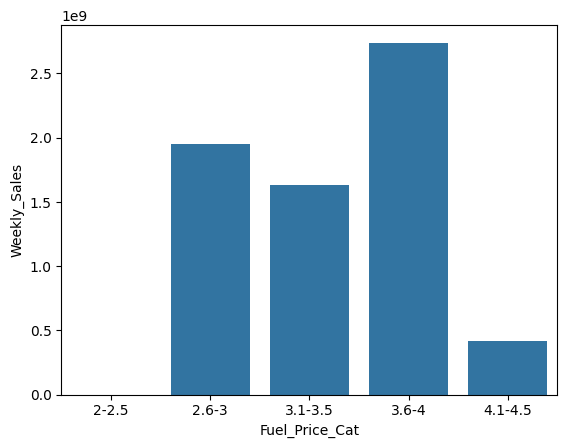

In [35]:
bins = [2,2.5,3,3.5,4,4.5] # Creating bins and labels to categorize the fuel prices
labels = ['2-2.5','2.6-3','3.1-3.5','3.6-4','4.1-4.5']
df['Fuel_Price_Cat']= pd.cut(df['Fuel_Price'],bins=bins,labels=labels)
df['Fuel_Price_Cat'].value_counts()
df_Fuel_Price_Sales = df.groupby('Fuel_Price_Cat')['Weekly_Sales'].sum().reset_index()
sns.barplot(x='Fuel_Price_Cat',y='Weekly_Sales',data=df_Fuel_Price_Sales)



---When the fuel prices are modereate the performance of stores are also moderatly high

---But the fuel Price went above the modereate level that is 3.5, and the sales are also went very High.

---May be the Inflation and fear of increasing prices people are bought more grocery to metigate with inflationand when fuel price went even high the purchase power of people went down. may be the inflation and increasing in goods price



In [36]:
Weekly_Sales_Store = df.Weekly_Sales.groupby(df.Store).mean()
fig=px.bar(Weekly_Sales_Store,Weekly_Sales_Store.index,Weekly_Sales_Store.values)
fig.update_layout(title_text='Average Weekly Sales per Store',xaxis_title='Store',yaxis_title='Weekly Sales'
,width=900,height=400)
fig.update_xaxes(tickvals=Weekly_Sales_Store.index)
fig.show()

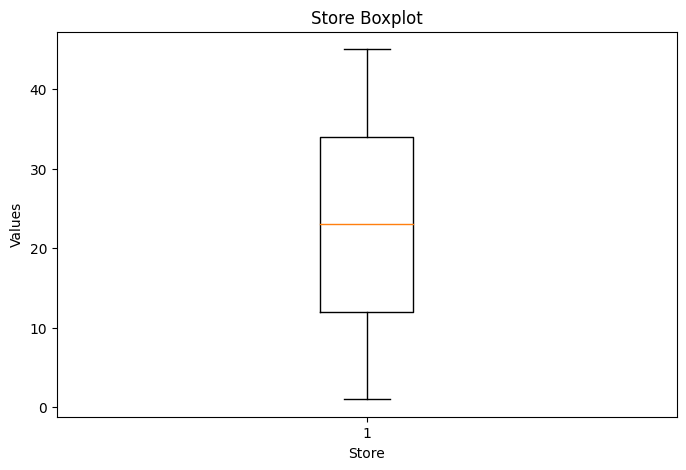

Skipping Date - not numeric


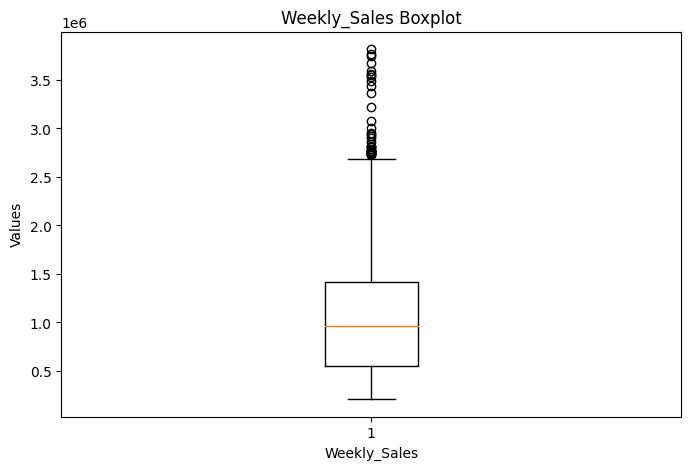

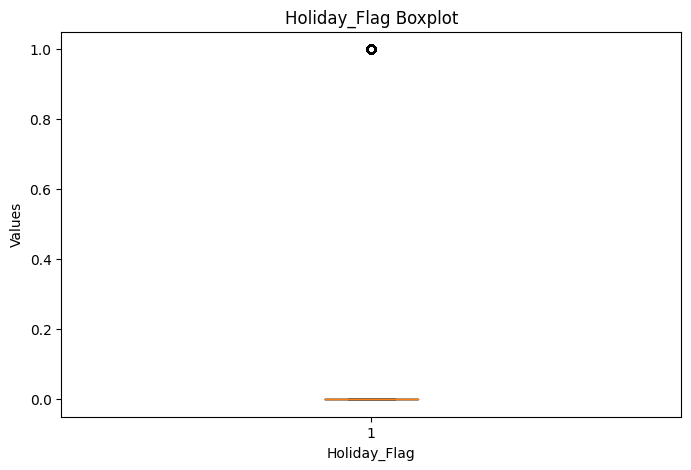

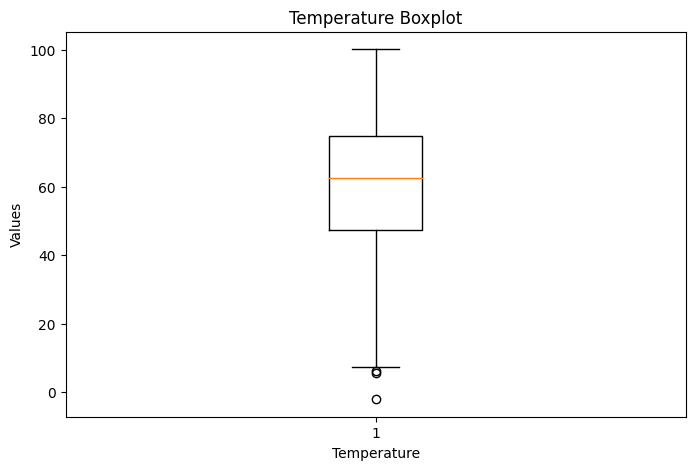

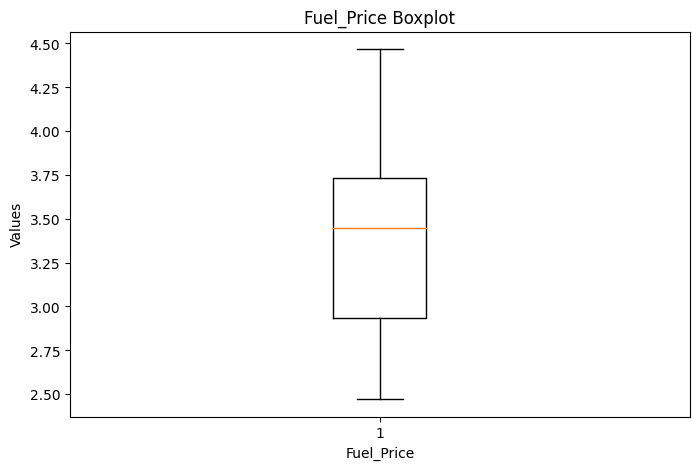

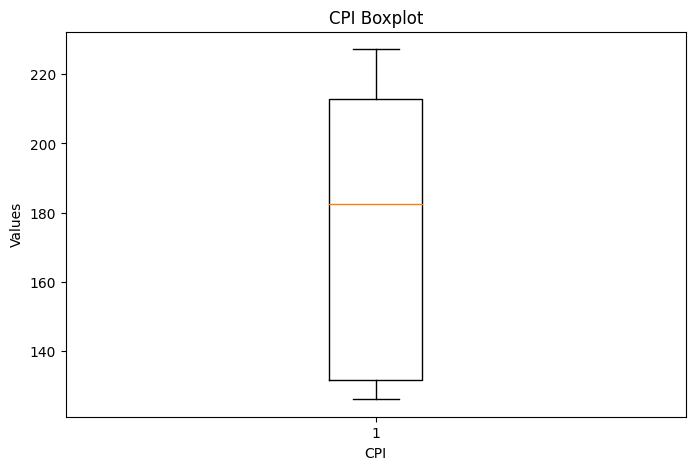

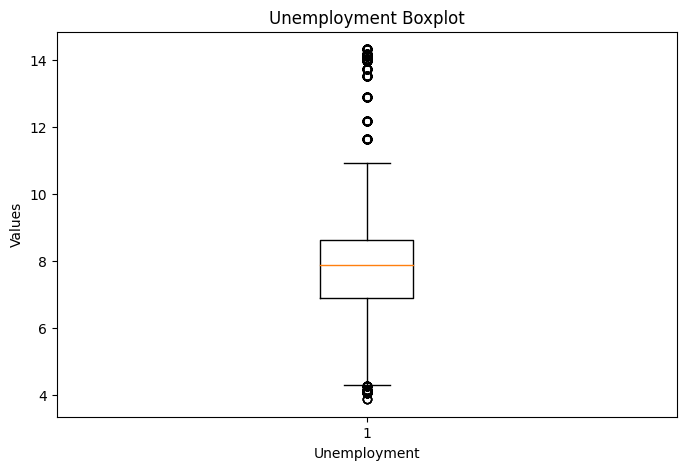

Skipping Day - not numeric
Skipping Month - not numeric
Skipping Year - not numeric
Skipping Week - not numeric
Skipping Fuel_Price_Cat - not numeric


In [37]:
x = df.columns
for i in x:
    # Check if the column is numeric
    if df[i].dtype in ['int64', 'float64']:
        plt.figure(figsize=(8, 5))
        plt.boxplot(df[i])
        plt.title(f'{i} Boxplot')
        plt.xlabel(i)
        plt.ylabel('Values')
        plt.show()
    else:
        print(f'Skipping {i} - not numeric')




> Columns Weekly_Sales, Unemployment have significant Outliers, while Temperature column has less outlier



In [38]:
df1=df.copy()

In [39]:
num_columns=['CPI', 'Fuel_Price', 'Store', 'Temperature', 'Unemployment','Weekly_Sales']

In [40]:
def remove_outliers(df1,col):
    q1=df1[col].quantile(0.25)
    q3=df1[col].quantile(0.75)
    IQR=q3-q1
    Lower_Band = q1-1.5*IQR
    Upper_Band = q3+1.5*IQR
    df1[col]=np.clip(df1[col],Lower_Band,Upper_Band)
    return df1

def treat_outliers(df1,col_list):
    for col in col_list:
        df1=remove_outliers(df1,col)
    return df1

In [41]:
df1=treat_outliers(df1,num_columns)

In [42]:
print('Before Clipping Outliers:',df.shape[0])
print('After Clipping Outliers:',df1.shape[0])

Before Clipping Outliers: 6435
After Clipping Outliers: 6435


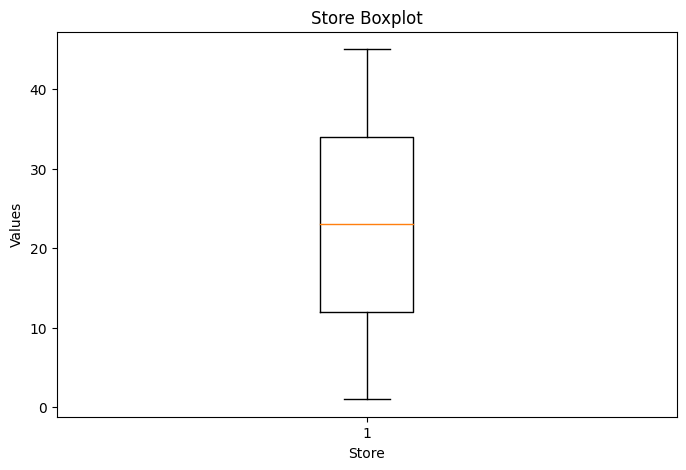

Skipping Date - not numeric


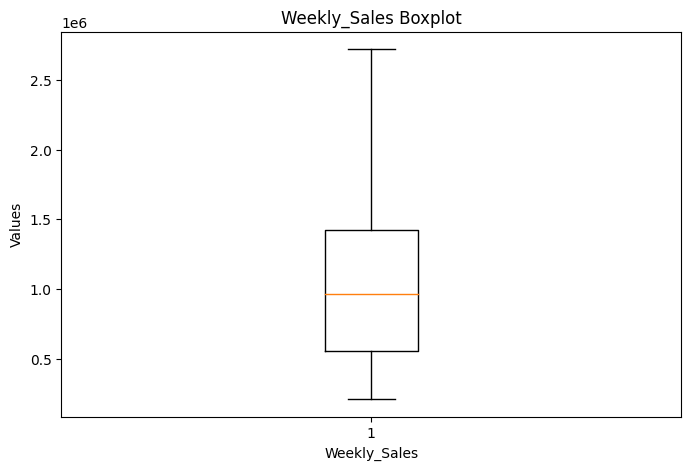

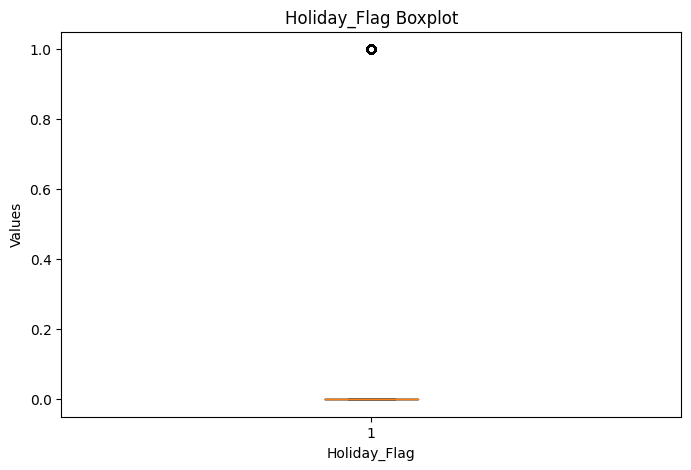

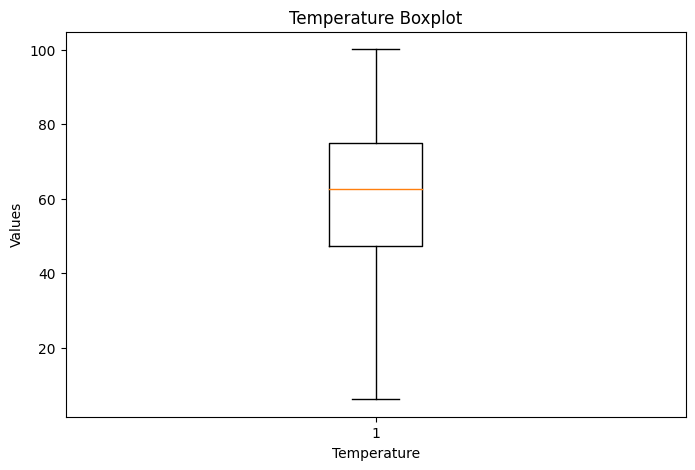

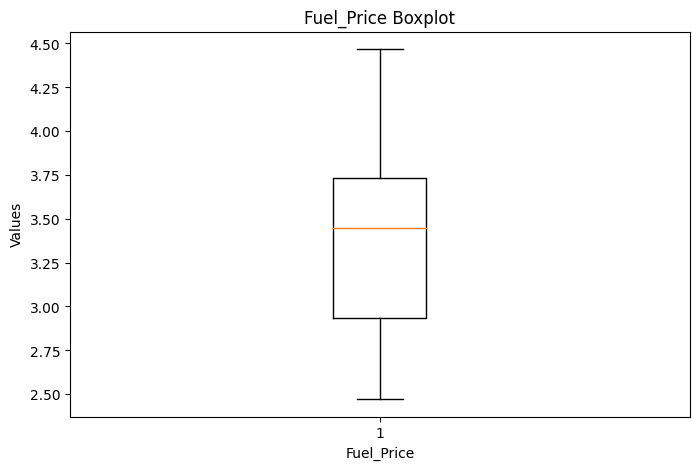

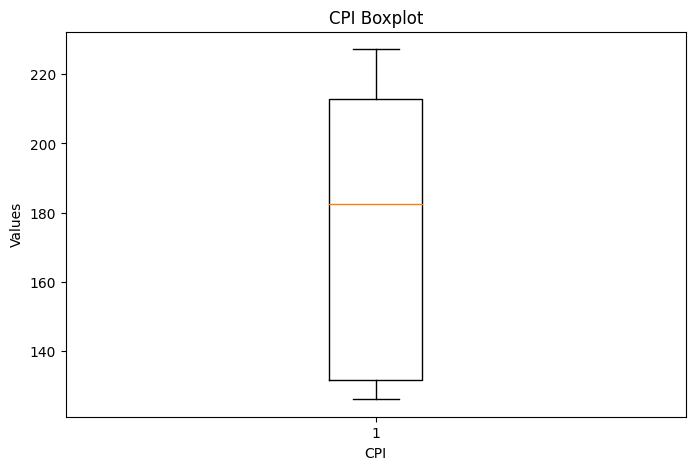

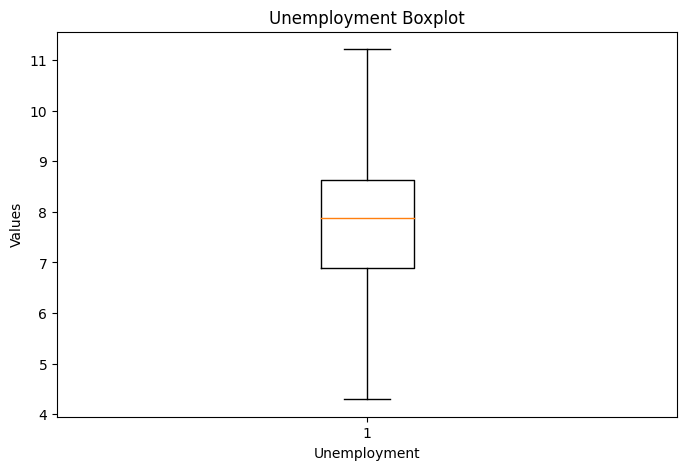

Skipping Day - not numeric
Skipping Month - not numeric
Skipping Year - not numeric
Skipping Week - not numeric
Skipping Fuel_Price_Cat - not numeric


In [43]:
x = df1.columns
for i in x:
    # Check if the column is numeric
    if df1[i].dtype in ['int64', 'float64']:
        plt.figure(figsize=(8, 5))
        plt.boxplot(df1[i])
        plt.title(f'{i} Boxplot')
        plt.xlabel(i)
        plt.ylabel('Values')
        plt.show()
    else:
        print(f'Skipping {i} - not numeric')

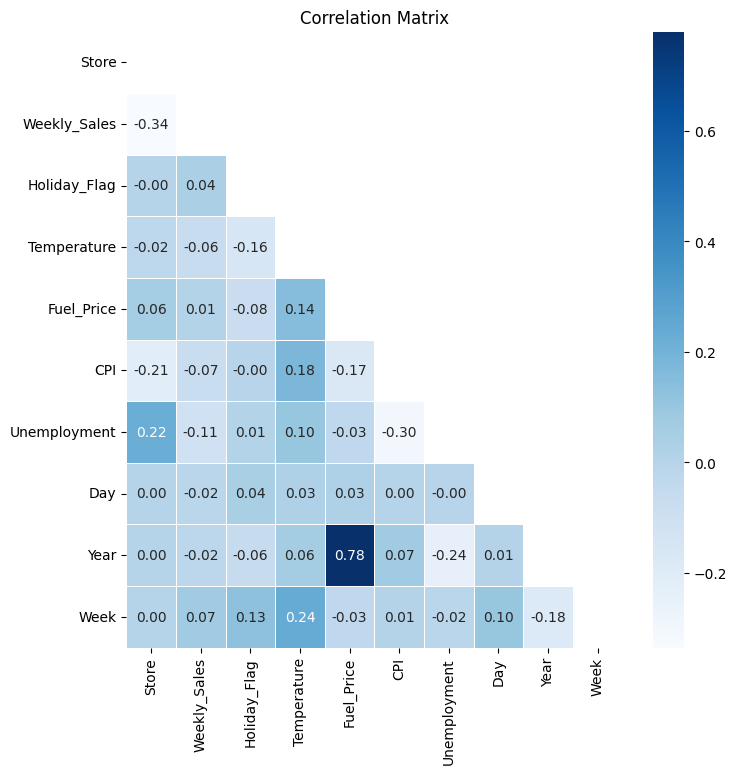

In [44]:
corr=df.corr(numeric_only=True)
masking=np.triu(np.ones_like(corr))
plt.subplots(figsize=(8,8))
sns.heatmap(corr,mask=masking,cmap='Blues',linewidths=.5,annot=True,fmt='.2f')
plt.title('Correlation Matrix')
plt.show()



> Fuel Price and Year are positively related

> Consumer Price Index (CPI) and unemployment rate have an inverse relationship

> Weekly Sales have very weak relationships with most of the variables, with Store showing the most notable correlation







:EDA has been done , outlier analysis made removal of 8% of data , and there is no missing values

# 1. You are provided with the weekly sales data for their various outlets. Use statisticalanalysis, EDA, outlier analysis, and handle the missing values to come up with variousinsights that can give them a clear perspective on the following:


*    **a. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?**




In [45]:
#Calculating correlations
df1_weekly_unemployment = df1['Weekly_Sales'].corr(df1['Unemployment'])
print(f'Correlation between weekly sales and unemployment: {df1_weekly_unemployment}')

Correlation between weekly sales and unemployment: -0.10866245552246898




> Weak negative correlation between weekly sales and unemployment, it is not strong enough to conclude that unemployment significantly affects sales. Further statistical analyses could provide a more comprehensive understanding of the relationship between these two variables.

In [46]:
min_unemployment=df1['Unemployment'].min()
min_unemployment

4.2945

In [47]:
max_unemployment=df1['Unemployment'].max()
max_unemployment

11.218499999999999

In [48]:
bin_width = (max_unemployment - min_unemployment) / 4
bins = [
    min_unemployment,
    min_unemployment + bin_width,
    min_unemployment + 2 * bin_width,
    min_unemployment + 3 * bin_width,
    max_unemployment]
labels=['4-6','6.1-8','8.1-10','10.1-12']
df1['Unemployment_Level'] = pd.cut(df1['Unemployment'], bins=bins, labels=labels, include_lowest=True)
print(df1[['Unemployment', 'Unemployment_Level']].head())

   Unemployment Unemployment_Level
0         8.106             8.1-10
1         8.106             8.1-10
2         8.106             8.1-10
3         8.106             8.1-10
4         8.106             8.1-10


In [49]:
df1['Unemployment_Level'].value_counts()

,count
Unemployment_Level,
8.1-10,2700
6.1-8,2269
10.1-12,844
4-6,622


In [50]:
df_UnEmp_Sales = df1.groupby('Unemployment_Level')['Weekly_Sales'].sum().reset_index()

<Axes: xlabel='Unemployment_Level', ylabel='Weekly_Sales'>

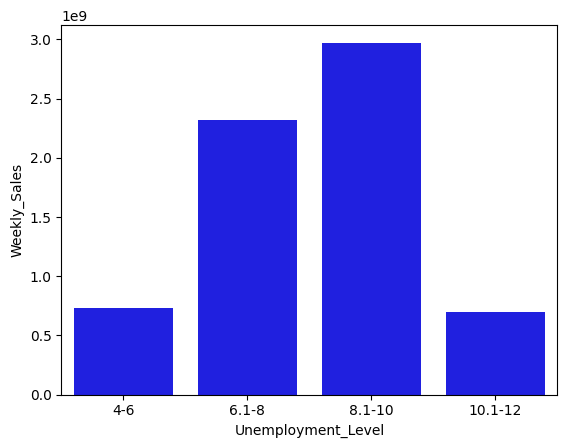

In [51]:
sns.barplot(x='Unemployment_Level',y='Weekly_Sales',data=df_UnEmp_Sales,color='blue')

In [52]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Store               6435 non-null   int64         
 1   Date                6435 non-null   datetime64[ns]
 2   Weekly_Sales        6435 non-null   float64       
 3   Holiday_Flag        6435 non-null   int64         
 4   Temperature         6435 non-null   float64       
 5   Fuel_Price          6435 non-null   float64       
 6   CPI                 6435 non-null   float64       
 7   Unemployment        6435 non-null   float64       
 8   Day                 6435 non-null   int32         
 9   Month               6435 non-null   object        
 10  Year                6435 non-null   int32         
 11  Week                6435 non-null   UInt32        
 12  Fuel_Price_Cat      6435 non-null   category      
 13  Unemployment_Level  6435 non-null   category    



> When the Unemployment rate is between the 6.1 to 10 the stores are performing well But whenever the Unemployment rate is increasing the sales went down


> we can see that where the Unemployment Rate is too low and too high the sales are affected compared to moderate Unemployment Rate.
So we need to find out the store which are suffering the most in this Unemployment rate category.





In [53]:
label_encoder=LabelEncoder()

In [54]:
df1['Unemployment_Level']=label_encoder.fit_transform(df1['Unemployment_Level'])

In [55]:
df1['Unemployment_Level'].value_counts()

,count
Unemployment_Level,
3,2700
2,2269
0,844
1,622


In [56]:
filtered_df = df1[df1['Unemployment_Level'].isin([1, 0])]



> The resulting filtered_df will only contain entries from stores that fall within the low to medium unemployment categories, allowing for focused analysis on how these specific unemployment levels may correlate with weekly sales.



In [57]:
filtered_df['Unemployment_Level'].value_counts()

,count
Unemployment_Level,
0,844
1,622


In [58]:
sales_unemp_store= filtered_df.groupby('Store')['Weekly_Sales'].sum().reset_index()

In [59]:
sales_unemp_store

,Store,Weekly_Sales
0,4,1.782381e+08
1,5,1.416884e+07
2,6,4.684711e+07
3,8,3.923392e+07
4,9,2.397403e+07
5,10,4.073076e+07
6,12,1.442872e+08
7,13,6.152466e+07
8,16,2.016068e+06
9,17,1.623276e+07


In [60]:
# Since We have 19 stores that are suffering. but i took only 5 stores which suffering more than others stores which are in those 17 stores
print('Most Suffered Stores with Unemployment Rate is listed Below : ')
sales_unemp_store.sort_values(by='Weekly_Sales',ascending=True).head()

Most Suffered Stores with Unemployment Rate is listed Below : 


,Store,Weekly_Sales
8,16,2016067.98
13,33,9422032.38
17,42,11181342.59
1,5,14168838.13
19,44,14187373.72


**b. If the weekly sales show a seasonal trend, when and what could be the reason?**

In [61]:
df1_sales=df1.groupby('Date')['Weekly_Sales'].sum().reset_index()

In [62]:
df1_sales.set_index('Date',inplace=True)

In [63]:
Sales_decomposition = seasonal_decompose(df1_sales['Weekly_Sales'],period=13)

Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

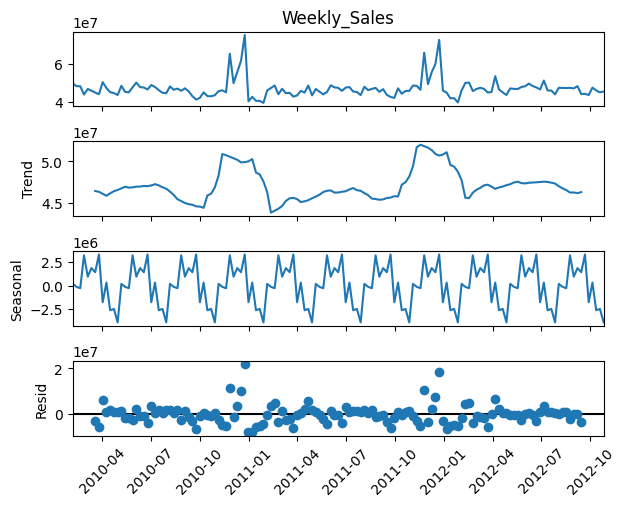

In [64]:
print(Sales_decomposition.plot())
plt.xticks(rotation=45)



---As we can see in the trend component there is seasonal spikes from 2010-10th month upto 2011-01, then after again in 2011-10th month to 2012-01 there is a seacond seasonal spike, but in 2012 year there is no that much spike its winter season, and the Temperature may impact the sales



In [65]:
df2_sales=df1.groupby('Date')['Temperature'].sum().reset_index()

In [66]:
df2_sales.set_index('Date',inplace=True)

In [67]:
Temperature_decomposition = seasonal_decompose(df2_sales['Temperature'],period=13)

Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

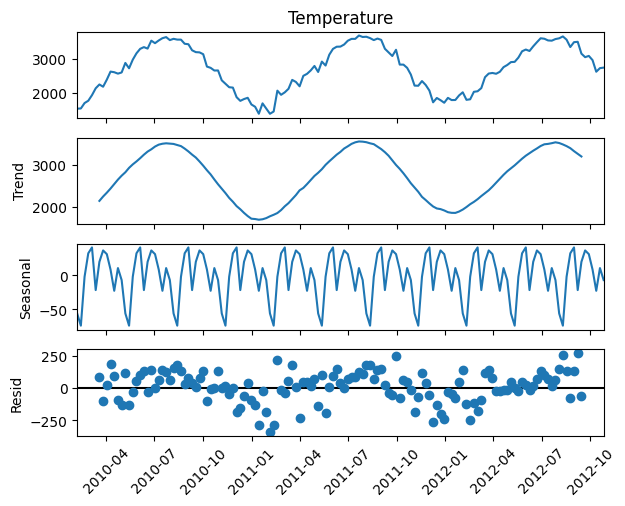

In [68]:
print(Temperature_decomposition.plot())
plt.xticks(rotation=45)



---Regarding the Temperature data, a seasonal downward trend is observed starting from October 2010 until January 2011. Subsequently, there's a gradual increase. However, from October 2011, temperatures start to decline again.

---For Weekly Sales Data, there is a noticeable increase in sales starting from October 2010, followed by a seasonal upward trend until January 2011. Afterward, the sales stabilize, eventually transitioning to a downward trend. This pattern is repeated from October 2011 to January 2012.

---There appears to be an inverse relationship between Temperature and Weekly Sales. When temperatures decrease, weekly sales tend to rise, and vice versa. This inverse correlation is evident from October 2011 to January 2012, as well as from October 2011 to January 2012.



**c. Does temperature affect the weekly sales in any manner?**

In [69]:
df1temp_sales = df1.groupby(['Date','Temperature'])['Weekly_Sales'].sum().reset_index()

In [70]:
df1temp_sales

,Date,Temperature,Weekly_Sales
0,2010-02-05,9.55,1034119.21
1,2010-02-05,10.53,496725.44
2,2010-02-05,14.48,1001943.80
3,2010-02-05,15.25,1364721.58
4,2010-02-05,19.79,477409.30
...,...,...,...
4972,2012-10-26,72.90,1569502.00
4973,2012-10-26,73.70,253731.13
4974,2012-10-26,74.26,1200729.45
4975,2012-10-26,74.39,807227.84


In [71]:
df1tempsales_correlation =df1temp_sales[['Temperature','Weekly_Sales']].corr()

<Axes: >

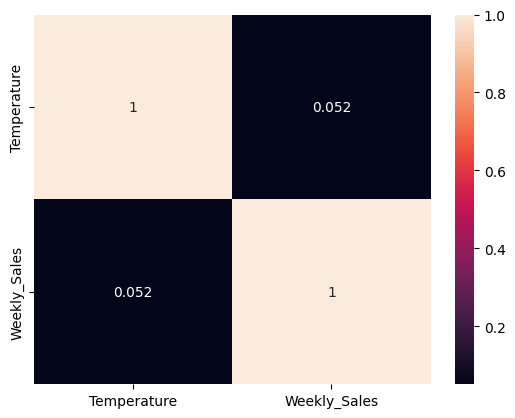

In [72]:
sns.heatmap(df1tempsales_correlation,annot=True)



---From Temperature_decomposition.plot and Sales_decomposition.plot, Temperature and weekly sales are negativily correlated

---From above correlatin heatmap plot it is evident that Yes there is a Nagative correlation and the Temperature is affecting the Weekly Sales



**d. How is the Consumer Price index affecting the weekly sales of various stores?**

In [73]:
df1CPISales = df1.groupby(['Date','CPI'])['Weekly_Sales'].sum().reset_index()

In [74]:
df1CPISales_correlation =df1CPISales[['CPI','Weekly_Sales']].corr()

<Axes: >

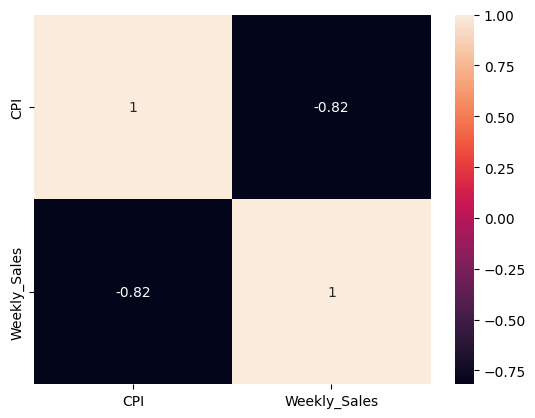

In [75]:
sns.heatmap(df1CPISales_correlation,annot=True)



---Negative correlation between the CPI and weekly sales and the CPI is affecting the Weekly Sales



**e. Top performing stores according to the historical data.**

In [76]:
df1_store_sales = df1.groupby('Store')['Weekly_Sales'].sum().reset_index()

In [77]:
Top_10_Sale_Store=df1_store_sales.sort_values(by='Weekly_Sales',ascending=False).head(10)

In [78]:
Top_10_Sale_Store

,Store,Weekly_Sales
19,20,2.990663e+08
3,4,2.973575e+08
13,14,2.870091e+08
12,13,2.845247e+08
1,2,2.741628e+08
9,10,2.692807e+08
26,27,2.534795e+08
5,6,2.237489e+08
0,1,2.224028e+08
38,39,2.074455e+08


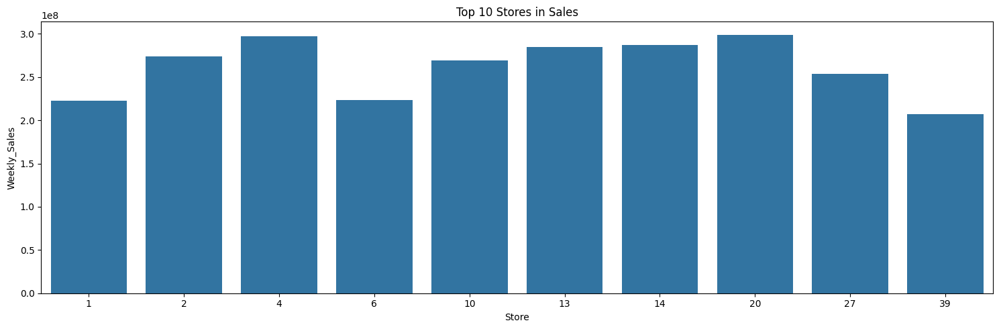

In [79]:
plt.figure(figsize=(15,5))
sns.barplot(x='Store',y='Weekly_Sales',data=Top_10_Sale_Store)
plt.title('Top 10 Stores in Sales')
plt.xlabel('Store')
plt.ylabel('Weekly_Sales')
plt.tight_layout()
plt.show()




---The Stores 20 is having the highest sales and 4,14 are having second and third highest sales



**f. The worst performing store, and how significant is the difference between the
highest and lowest performing stores.**

In [80]:
Bottom_10_Sale_Store=df1_store_sales.sort_values(by='Weekly_Sales',ascending=False).tail(10)

In [81]:
Bottom_10_Sale_Store

,Store,Weekly_Sales
28,29,77141554.31
15,16,74252425.40
36,37,74202740.32
29,30,62716885.12
2,3,57586735.07
37,38,55159626.42
35,36,53412214.97
4,5,45475688.90
43,44,43293087.84
32,33,37160221.96


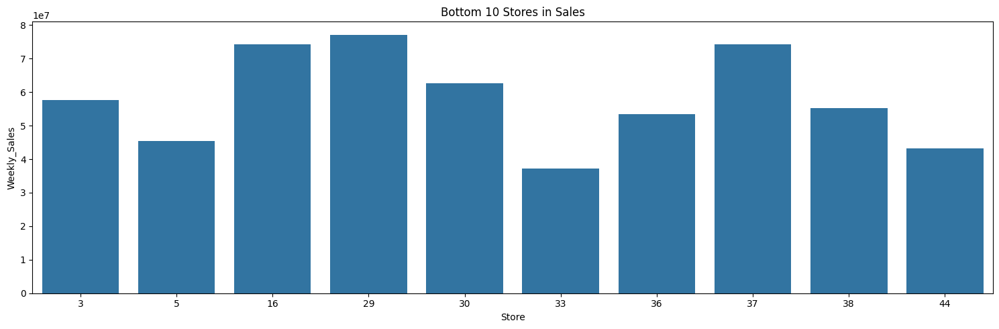

In [82]:
plt.figure(figsize=(15,5))
sns.barplot(x='Store',y='Weekly_Sales',data=Bottom_10_Sale_Store)
plt.title('Bottom 10 Stores in Sales')
plt.xlabel('Store')
plt.ylabel('Weekly_Sales')
plt.tight_layout()
plt.show()

---The Stores 33 is having the worst/lowest sales and 44,5 are having second and third lowest sales



> Finding the significance diffrence


*   **using Independent Two-Sample T-Test to check dignificance diffrence**





In [83]:
top_sales=Top_10_Sale_Store['Weekly_Sales']
bottom_sales=Bottom_10_Sale_Store['Weekly_Sales']
t_stat, p_val= ttest_ind(top_sales,bottom_sales)
if p_val < 0.05:
    print("There is a significant difference between top-performing and worst-performing stores.")
    print(f"P-value: {p_val}")
else:
    print("There is no significant difference between top-performing and worst-performing stores.")
    print(f"P-value: {p_val}")


There is a significant difference between top-performing and worst-performing stores.
P-value: 7.079291347377579e-13


In [84]:
Mean_diffrence=top_sales.mean()-bottom_sales.mean()
print(f'Mean diffrence between top-performing and worst-performing stores: {Mean_diffrence}')

Mean diffrence between top-performing and worst-performing stores: 203807667.66124994


# 2. Use predictive modeling techniques to forecast the sales for each store for the next 12 weeks.

In [85]:
###Considering Date and Sales Column for modeling
df1_Sales=df1.groupby('Date')['Weekly_Sales'].sum().reset_index()

In [86]:
df1_Sales.set_index('Date',inplace=True)

In [87]:
df1_Sales

,Weekly_Sales
Date,
2010-02-05,49750740.50
2010-02-12,48336677.63
2010-02-19,48276993.78
2010-02-26,43968571.13
2010-03-05,46871470.30
...,...
2012-09-28,43734899.40
2012-10-05,47566639.31
2012-10-12,46128514.25


In [88]:
adf=adfuller(df1_Sales['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


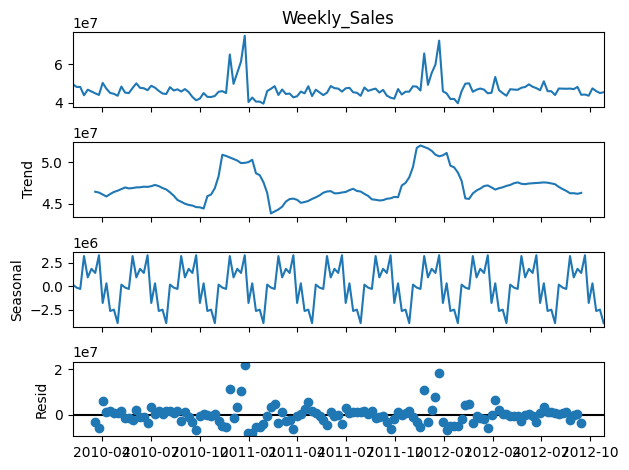

In [89]:
decomposition=seasonal_decompose(df1_Sales['Weekly_Sales'],period=13)
print(decomposition.plot())

In [90]:
mean_df1_Sales=df1_Sales.rolling(window=10).mean()
std_df1_Sales=df1_Sales.rolling(window=10).std()

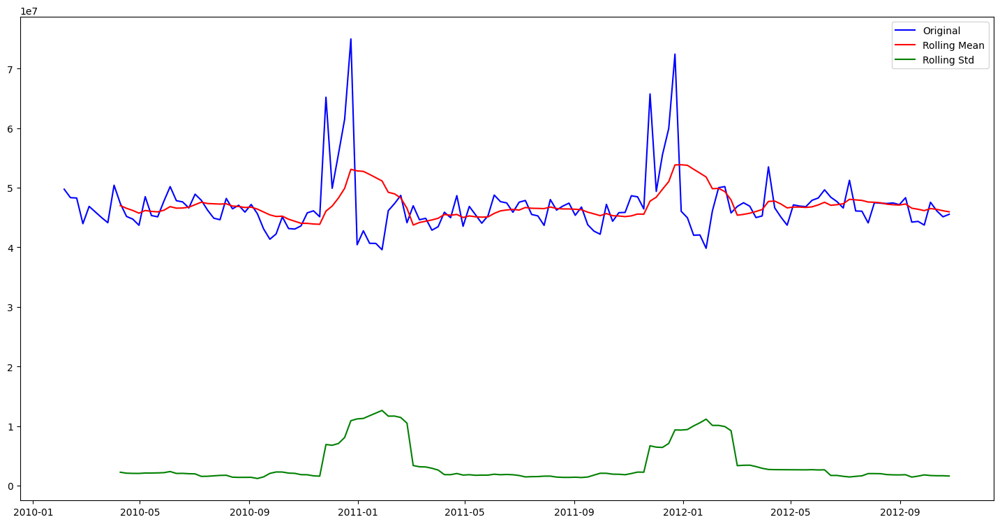

In [91]:
plt.figure(figsize=(18,9))
plt.plot(df1_Sales['Weekly_Sales'],label='Original',color='blue')
plt.plot(mean_df1_Sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(std_df1_Sales['Weekly_Sales'],label='Rolling Std',color='green')
plt.legend()
plt.show()



---Mean and Weekly Sales are kind off close but mean is not capturing the seasonal spikes



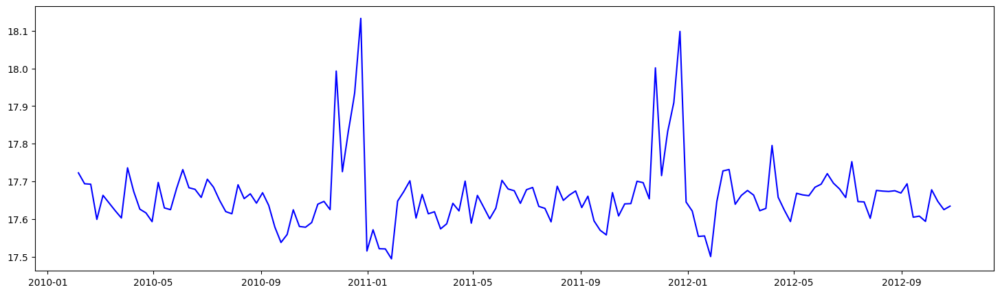

In [92]:
df_log=np.log(df1_Sales)
plt.figure(figsize=(18,5))
plt.plot(df_log['Weekly_Sales'],label='Original',color='blue')

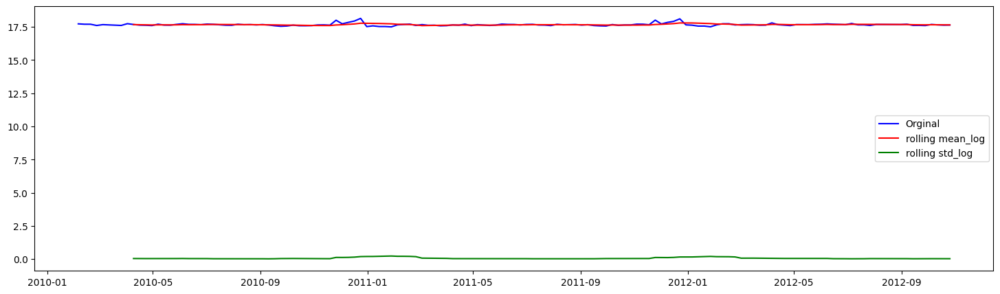

In [93]:
mean_log = df_log.rolling(window = 10).mean()
std_log = df_log.rolling(window = 10).std()
plt.figure(figsize=(18,5))
plt.plot(df_log,color= 'blue',label = 'Orginal')
plt.plot(mean_log, color = 'red', label = 'rolling mean_log')
plt.plot(std_log, color = 'green', label = 'rolling std_log')
plt.legend()
plt.show()



```
#subtracting the log data and mean log data, can help in stabilizing the variance of the data, which is a common requirement for many time series modeling techniques.
```



In [94]:
df_new = df_log - mean_log
df_new.head(15)

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
2010-03-12,NaN
2010-03-19,NaN
2010-03-26,NaN
2010-04-02,NaN


In [95]:
df_new.dropna(inplace=True)

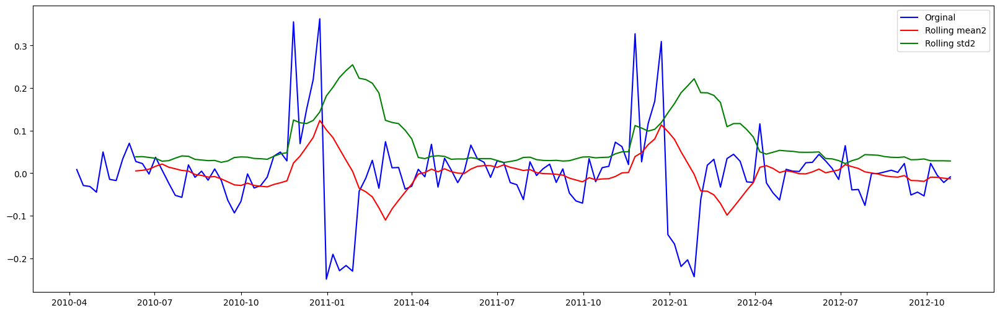

In [96]:
mean_df_new=df_new.rolling(window=10).mean()
std_df_new=df_new.rolling(window=10).std()
plt.figure(figsize=(20,6))
plt.plot(df_new,color= 'blue',label = 'Orginal')
plt.plot(mean_df_new, color = 'red', label = 'Rolling mean2')
plt.plot(std_df_new, color = 'green', label = 'Rolling std2')
plt.legend()
plt.show()

In [97]:
adf=adfuller(df_new['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


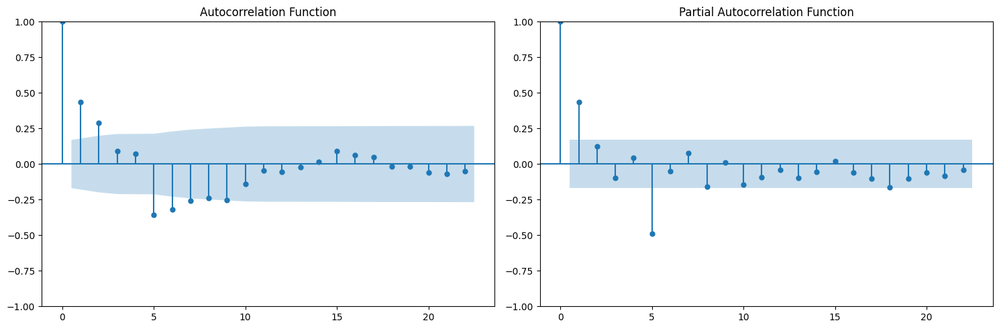

In [98]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
plot_acf(df_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(df_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()



> Conclusion: Based on the  plots: p = 2 (from PACF) and q = 1 (from ACF)




In [99]:
#ARIMA MODEL
model = ARIMA(df_new, order=(2, 1, 1))
arima_result = model.fit()
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



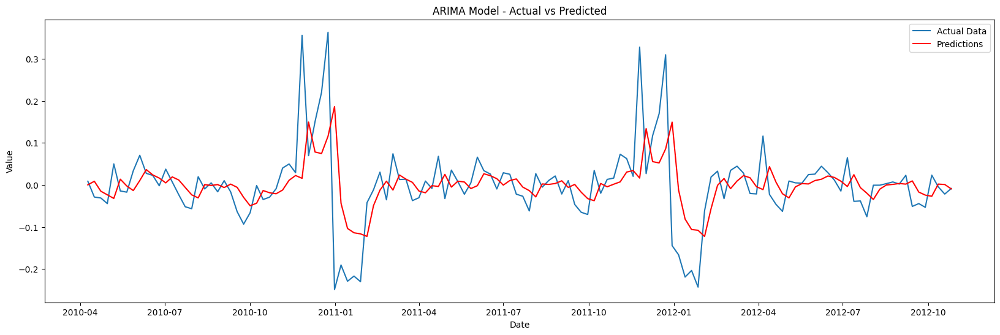

In [100]:
plt.figure(figsize=(20,6))
plt.plot(df_new, label='Actual Data')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [101]:
from sklearn.metrics import mean_squared_error
mse=mean_squared_error(df_new,predictions)
print(f'Mean Squared_Error{mse}')

Mean Squared_Error0.007217445838801556


In [102]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error{rmse}')


Root Mean Squared_Error0.08495555213640575


# **Store Wise Prediction**
## Store1 Sales forecasting

In [103]:
Store1=df1[df1['Store']==1].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [104]:
Store1.set_index('Date',inplace=True)

In [105]:
adf=adfuller(Store1['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

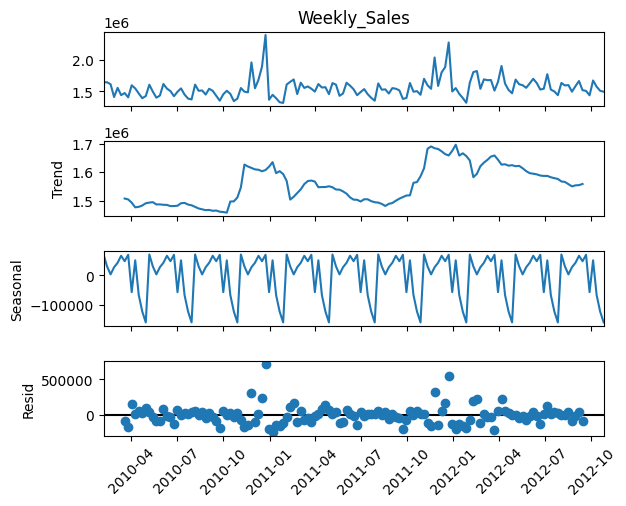

In [106]:
Decomposition=seasonal_decompose(Store1['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [107]:
meanstore1sales=Store1.rolling(window=10).mean()
stdstore1sales=Store1.rolling(window=10).std()

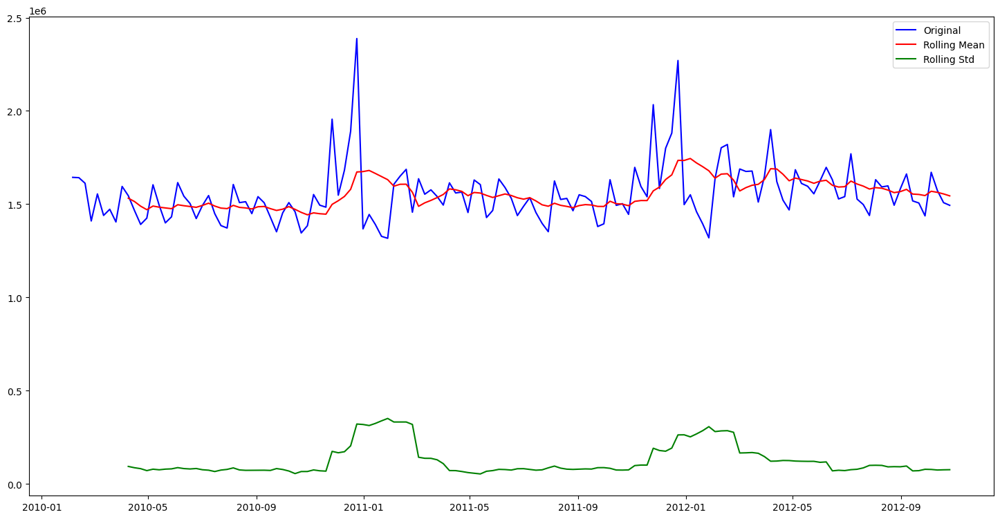

In [108]:
plt.figure(figsize=(18,9))
plt.plot(Store1['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore1sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore1sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

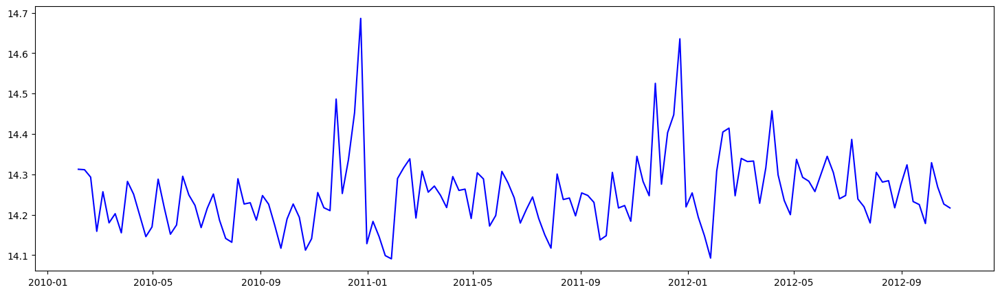

In [109]:
store1_log=np.log(Store1)
plt.figure(figsize=(18,5))
plt.plot(store1_log,label='Original',color='blue')

In [110]:
logmeanstore1sales=store1_log.rolling(window=10).mean()
logstdstore1sales=store1_log.rolling(window=10).std()

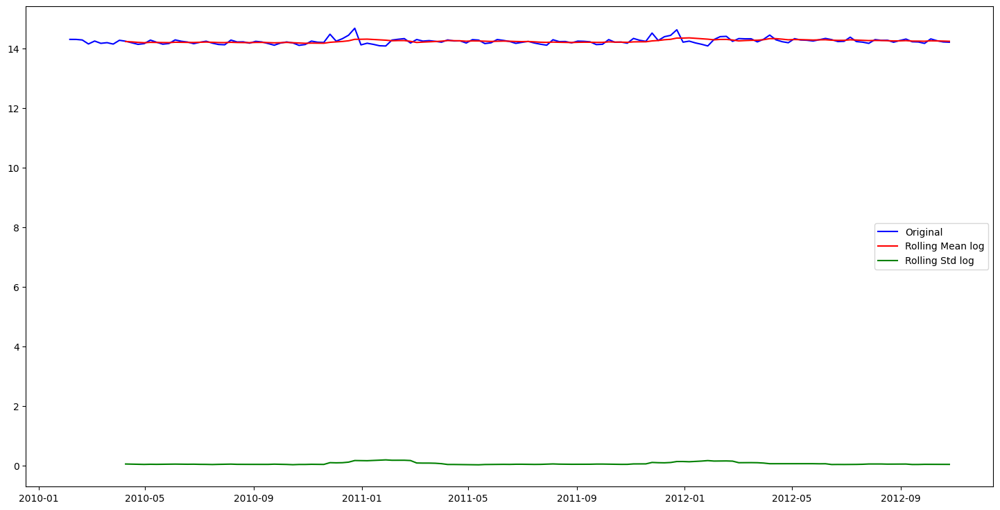

In [111]:
plt.figure(figsize=(18,9))
plt.plot(store1_log,label='Original',color='blue')
plt.plot(logmeanstore1sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore1sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [112]:
Store1_new= store1_log-logmeanstore1sales
Store1_new.dropna(inplace=True)

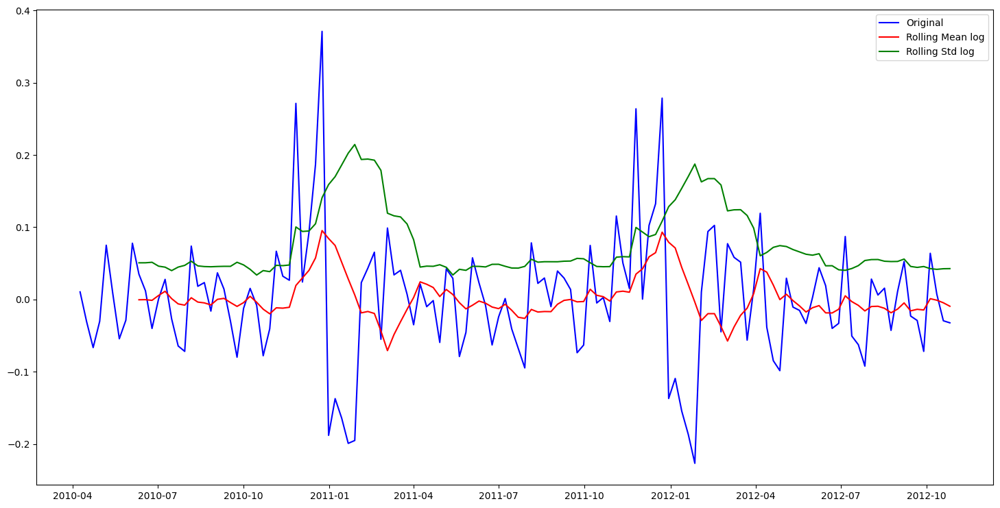

In [113]:
Mean_Store1_new = Store1_new.rolling(window=10).mean()
Std_Store1_new = Store1_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store1_new,label='Original',color='blue')
plt.plot(Mean_Store1_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store1_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [114]:
adf=adfuller(Store1_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


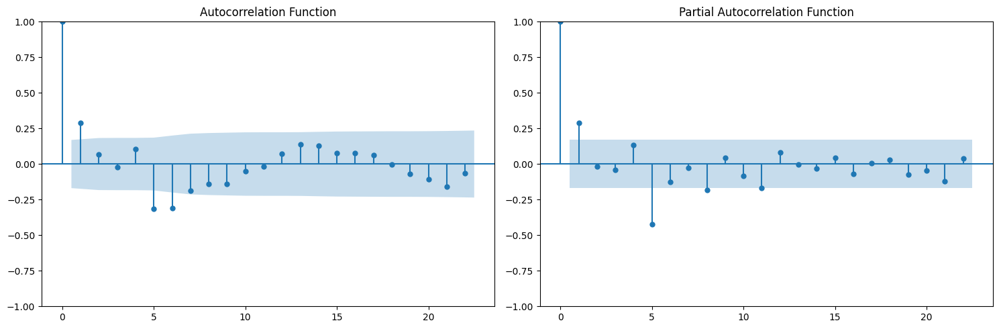

In [115]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store1_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store1_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

In [116]:
model = ARIMA(Store1_new, order=(1, 1, 1))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



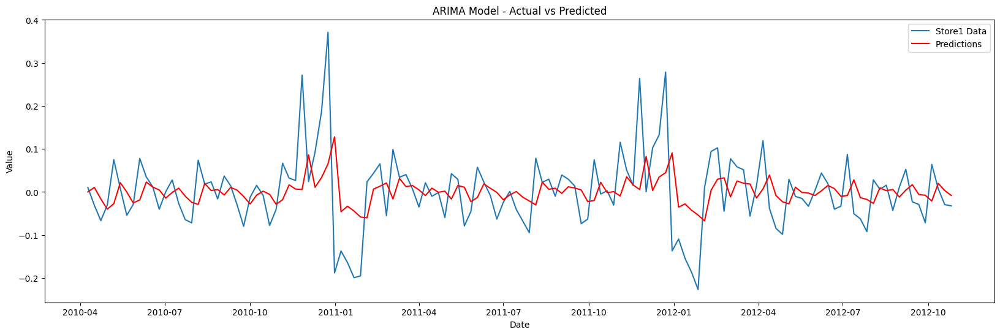

In [117]:
plt.figure(figsize=(20,6))
plt.plot(Store1_new, label='Store1 Data')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [118]:
mse=mean_squared_error(Store1_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.00713338181304951


In [119]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.08445935006291198


In [120]:
forecast_steps = 12
forecast = arima_result.forecast(steps=forecast_steps)


In [121]:
Store1_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.071856
2012-10-05,0.063913
2012-10-12,0.007274
2012-10-19,-0.029485
2012-10-26,-0.032341


In [122]:
end_date_actual_data = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [123]:
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast})


In [124]:
forecast_df.set_index('Date',inplace=True)


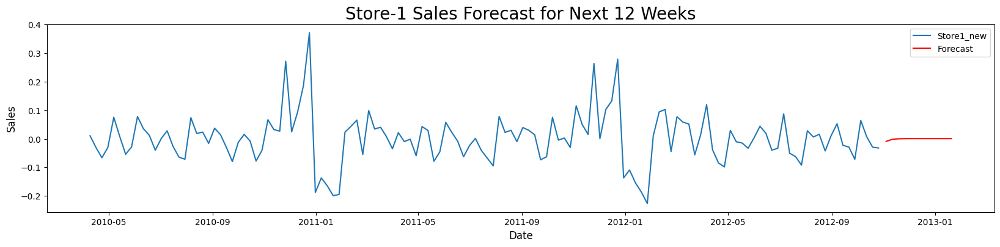

In [125]:
plt.figure(figsize=(20, 4))
plt.plot(Store1_new, label='Store1_new')
plt.plot(forecast_df, label='Forecast', color='red')
plt.title('Store-1 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()



---ARIMA models can't handle seasonality directly. If the time series contains seasonal components that are not accounted for, it will impact the model’s predictions.

---Switching to SARIMA, which handles seasonality, may be necessary.




In [402]:
model_SARIMAX = SARIMAX(Store1_new,
                order=(1, 1, 1),       # non-seasonal order
                seasonal_order=(1, 1, 1, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima = sarima_result.predict()
print(sarima_result.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 52)   Log Likelihood                 153.753
Date:                            Wed, 23 Oct 2024   AIC                           -297.506
Time:                                    20:22:02   BIC                           -285.533
Sample:                                04-09-2010   HQIC                          -292.702
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0507      0.107      0.472      0.637      -0.160       0.261
ma.L1         -0.9954      0.556   

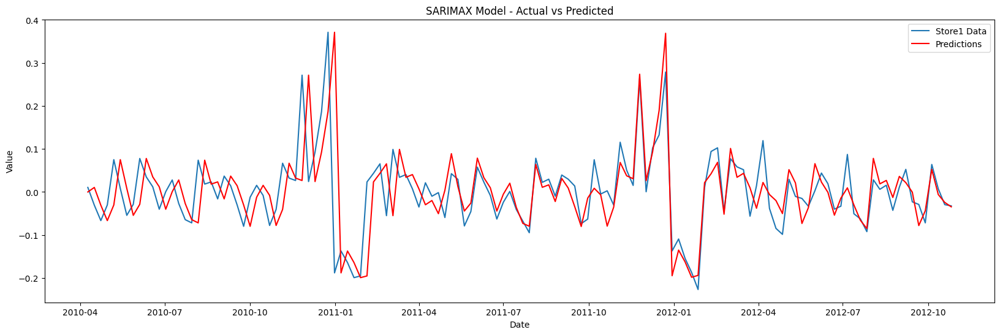

In [129]:
plt.figure(figsize=(20,6))
plt.plot(Store1_new, label='Store1 Data')
plt.plot(predictions_Sarima, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [130]:
mse=mean_squared_error(Store1_new,predictions_Sarima)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.005925701001263919


In [131]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.0769785749495528


In [132]:
forecast_steps = 12
forecast1 = sarima_result.forecast(steps=forecast_steps)


In [133]:
forecast_df1 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast1})


In [134]:
forecast_df1.set_index('Date',inplace=True)


In [135]:
combined_df1 = pd.concat([Store1_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df1.rename(columns={'Forecasted_Sales': 'Sales'})])

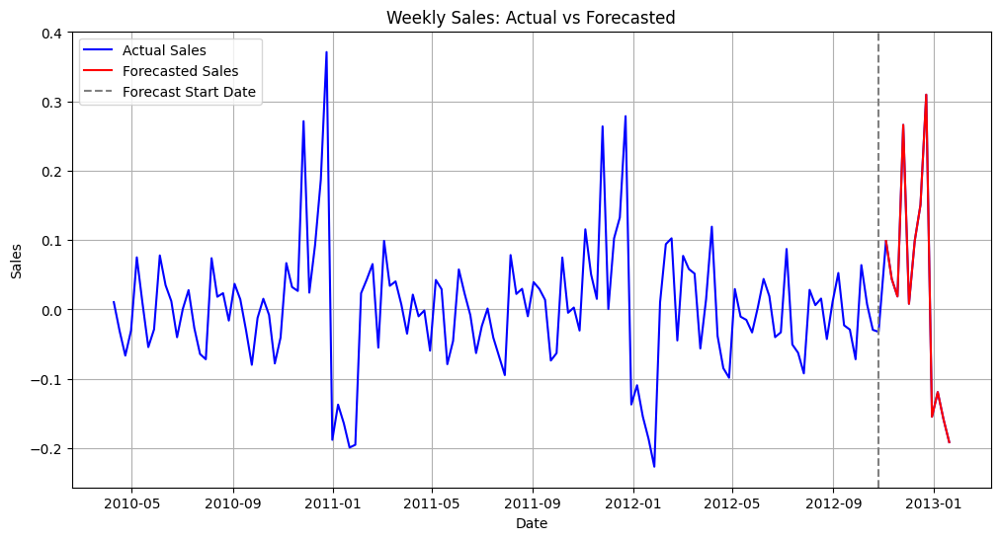

In [136]:
# Sort by date
combined_df1 = combined_df1.sort_values('Date')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(combined_df1.index, combined_df1['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_df1.index, forecast_df1['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()




---SARIMA addressed both the trend (through differencing) and the seasonal stationarity in the data, leading to improved forecasting



## Store 10 Forecasting

In [137]:
Store10=df1[df1['Store']==10].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [138]:
Store10.set_index('Date',inplace=True)

In [139]:
adf=adfuller(Store10['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


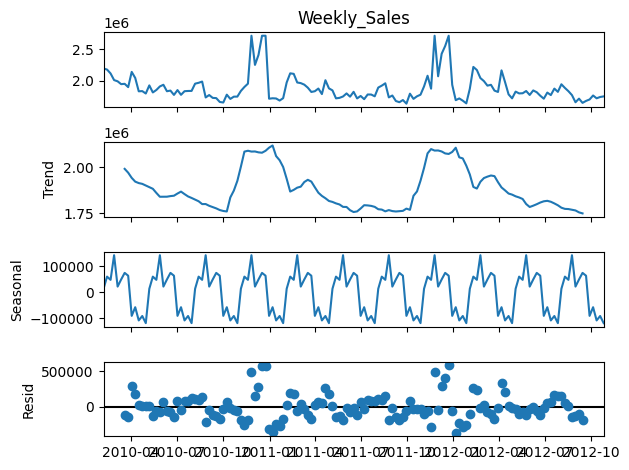

In [140]:
Decomposition=seasonal_decompose(Store10['Weekly_Sales'],period=13)
print(Decomposition.plot())

In [141]:
meanstore10sales=Store10.rolling(window=10).mean()
stdstore10sales=Store10.rolling(window=10).std()

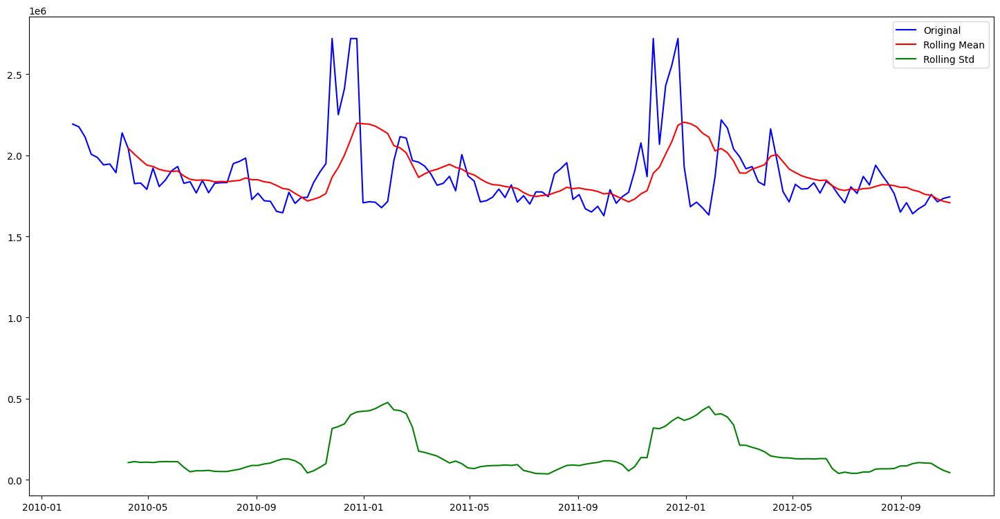

In [142]:
plt.figure(figsize=(18,9))
plt.plot(Store10['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore10sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore10sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

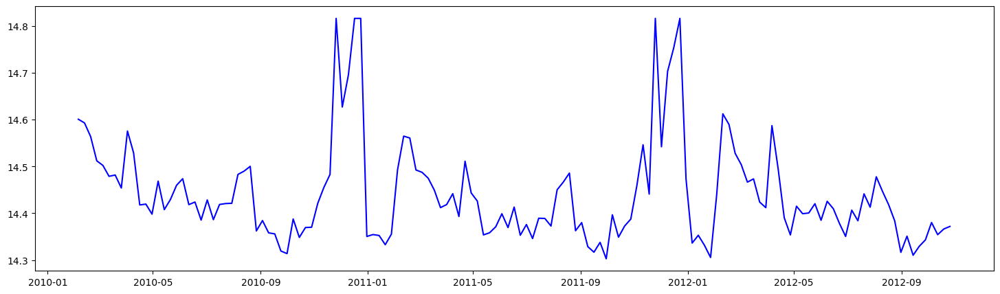

In [143]:
store10_log=np.log(Store10)
plt.figure(figsize=(18,5))
plt.plot(store10_log,label='Original',color='blue')

In [144]:
logmeanstore10sales=store10_log.rolling(window=10).mean()
logstdstore10sales=store10_log.rolling(window=10).std()

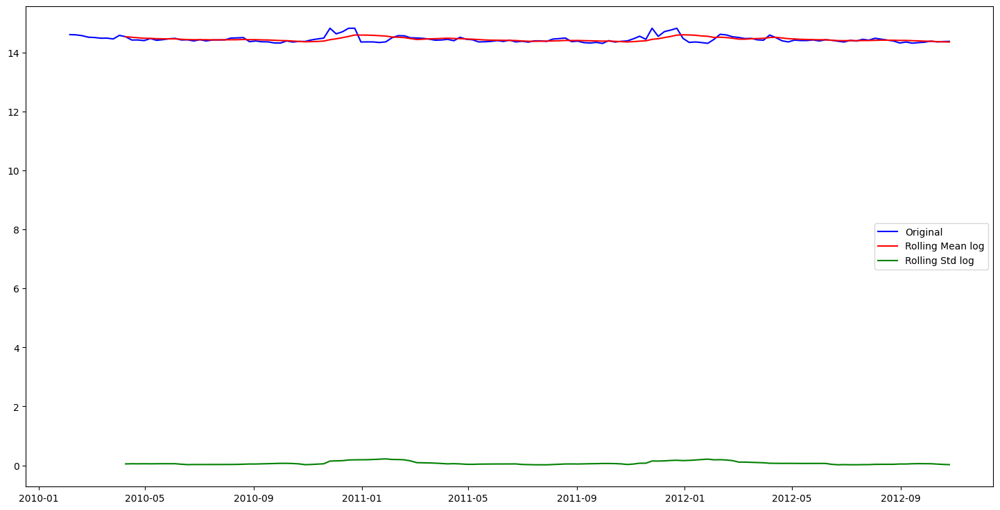

In [145]:
plt.figure(figsize=(18,9))
plt.plot(store10_log,label='Original',color='blue')
plt.plot(logmeanstore10sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore10sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [146]:
Store10_new= store10_log-logmeanstore10sales
Store10_new.dropna(inplace=True)

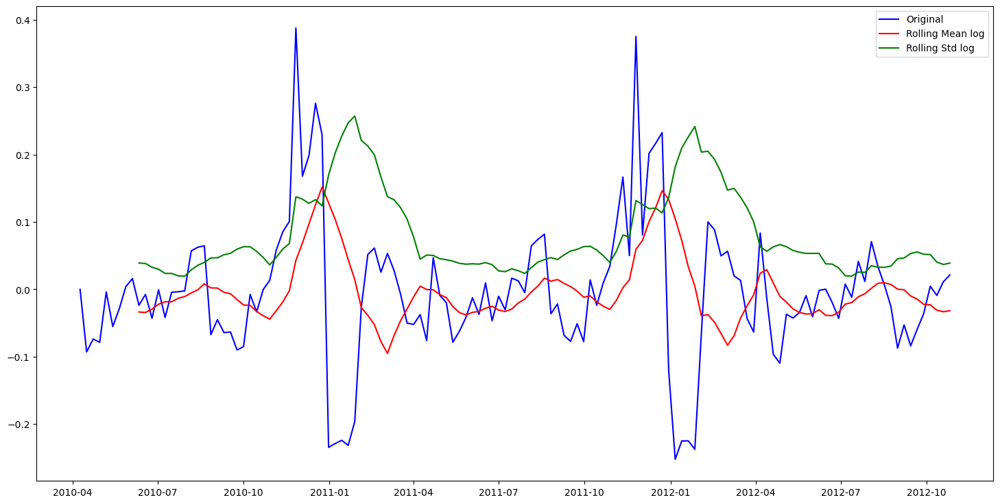

In [147]:
Mean_Store10_new = Store10_new.rolling(window=10).mean()
Std_Store10_new = Store10_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store10_new,label='Original',color='blue')
plt.plot(Mean_Store10_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store10_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [148]:
adf=adfuller(Store10_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


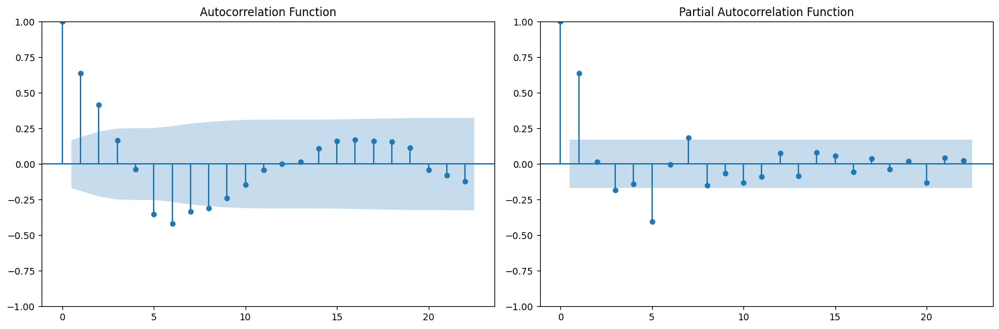

In [149]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store10_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store10_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

In [150]:
model = ARIMA(Store10_new, order=(1, 1, 2))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



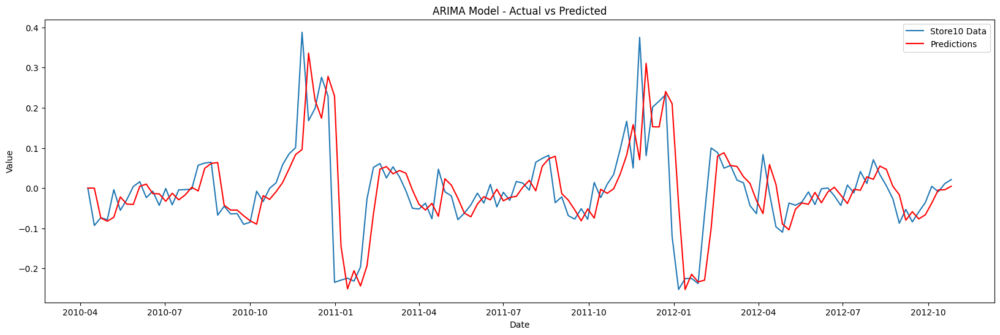

In [151]:
plt.figure(figsize=(20,6))
plt.plot(Store10_new, label='Store10 Data')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [152]:
mse=mean_squared_error(Store10_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.0073637117897525665


In [153]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.08581207251752265


In [154]:
forecast_steps = 12
forecast10 = arima_result.forecast(steps=forecast_steps)


In [155]:
Store10_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.035943
2012-10-05,0.004463
2012-10-12,-0.009137
2012-10-19,0.011069
2012-10-26,0.021211


In [156]:
end_date_actual_data10 = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date10 = end_date_actual_data10 + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date10 = forecast_start_date10 + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates10 = pd.date_range(start=forecast_start_date10, end=forecast_end_date10, freq='W-SUN')

# Display the forecast dates
print(forecast_dates10)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [157]:
forecast_df10 = pd.DataFrame({'Date': forecast_dates10, 'Forecasted_Sales': forecast10})


In [158]:
forecast_df10.set_index('Date',inplace=True)


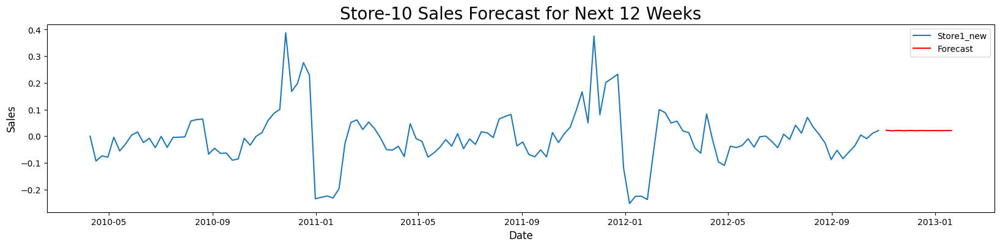

In [159]:
plt.figure(figsize=(20, 4))
plt.plot(Store10_new, label='Store1_new')
plt.plot(forecast_df10, label='Forecast', color='red')
plt.title('Store-10 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()



---This ARIMA models can't handle seasonality directly. If the time series contains seasonal components that are not accounted for, it will impact the model’s predictions. So Switching to SARIMA, which handles seasonality, to check if this work.




In [161]:
model_SARIMAX = SARIMAX(Store10_new,
                order=(1, 1, 2),       # non-seasonal order
                seasonal_order=(1, 1, 2, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima = sarima_result.predict()
print(sarima_result.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(1, 1, 2)x(1, 1, 2, 52)   Log Likelihood                 145.690
Date:                            Wed, 23 Oct 2024   AIC                           -277.380
Time:                                    18:09:08   BIC                           -260.619
Sample:                                04-09-2010   HQIC                          -270.655
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8600      0.270     -3.183      0.001      -1.390      -0.330
ma.L1         -0.0787      1.247   

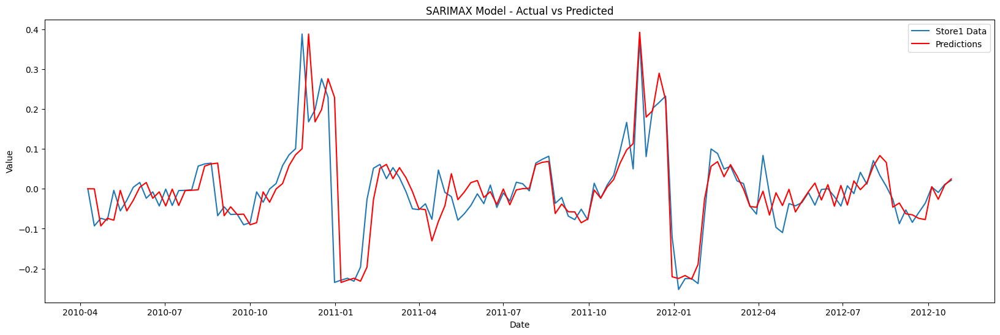

In [162]:
plt.figure(figsize=(20,6))
plt.plot(Store10_new, label='Store1 Data')
plt.plot(predictions_Sarima, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [163]:
mse=mean_squared_error(Store10_new,predictions_Sarima)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.004394904433773713


In [164]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.06629407540477289


In [165]:
forecast_steps = 12
forecast101 = sarima_result.forecast(steps=forecast_steps)


In [166]:
forecast_df101 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast1})


In [167]:
forecast_df101.set_index('Date',inplace=True)


In [168]:
combined_df10 = pd.concat([Store10_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df101.rename(columns={'Forecasted_Sales': 'Sales'})])

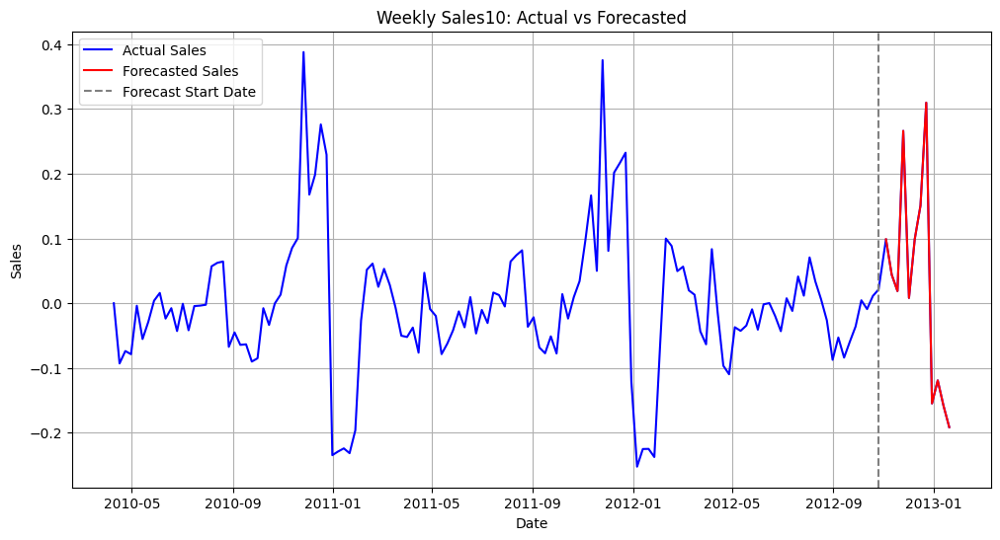

In [169]:
# Sort by date
combined_df10 = combined_df10.sort_values('Date')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(combined_df10.index, combined_df10['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_df101.index, forecast_df101['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data10, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales10: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()




---So in January 2011 sales is down which was same in January 2012 and prediction looks real. At January 2013 we have same downfall as previous years



## Store 19 Forecasting

In [170]:
Store19=df1[df1['Store']==19].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [171]:
Store19.set_index('Date',inplace=True)

In [172]:
adf=adfuller(Store19['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

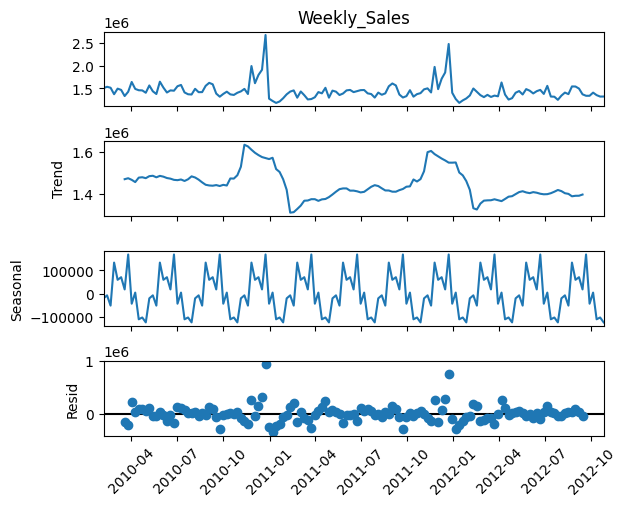

In [173]:
Decomposition=seasonal_decompose(Store19['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [174]:
meanstore19sales=Store19.rolling(window=10).mean()
stdstore19sales=Store19.rolling(window=10).std()

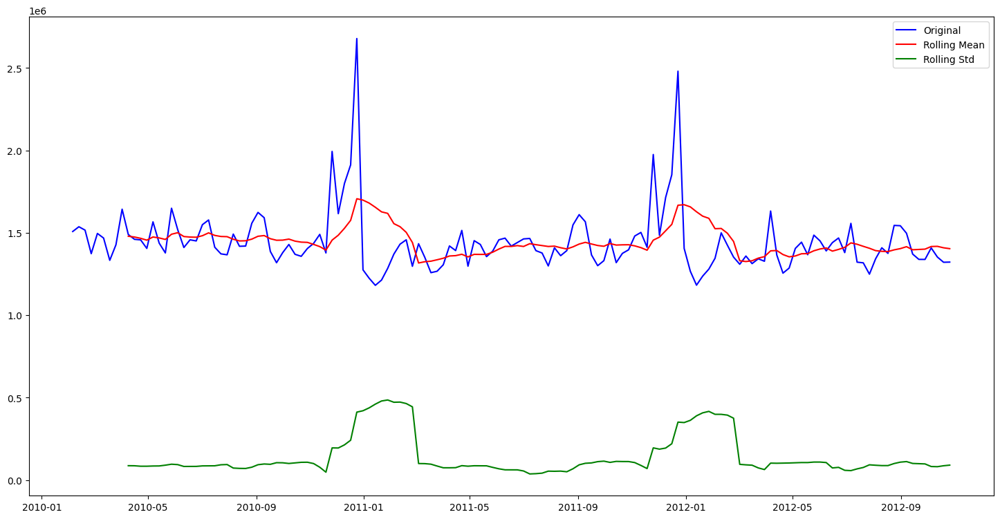

In [175]:
plt.figure(figsize=(18,9))
plt.plot(Store19['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore19sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore19sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

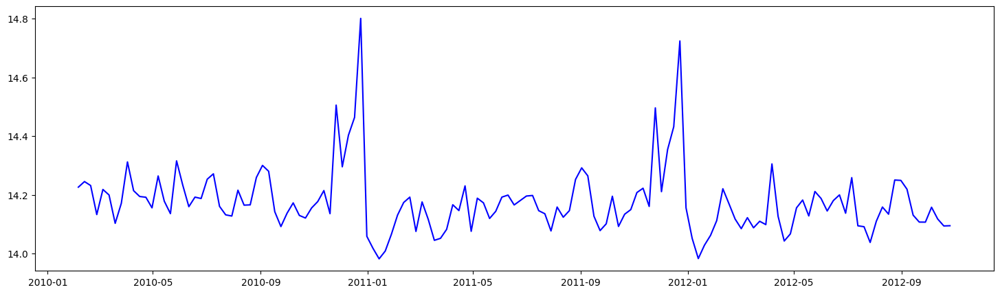

In [176]:
store19_log=np.log(Store19)
plt.figure(figsize=(18,5))
plt.plot(store19_log,label='Original',color='blue')

In [177]:
logmeanstore19sales=store19_log.rolling(window=10).mean()
logstdstore19sales=store19_log.rolling(window=10).std()

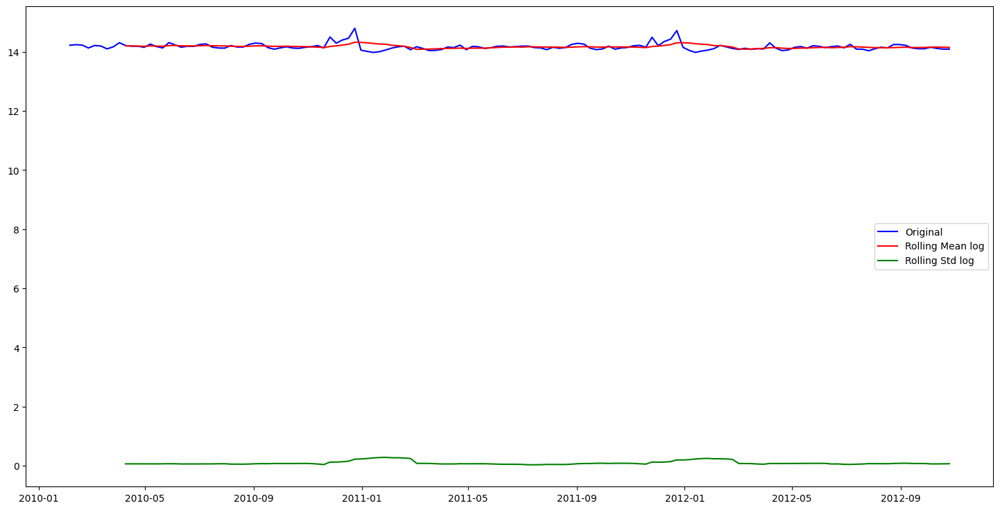

In [178]:
plt.figure(figsize=(18,9))
plt.plot(store19_log,label='Original',color='blue')
plt.plot(logmeanstore19sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore19sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [179]:
Store19_new= store19_log-logmeanstore19sales
Store19_new.dropna(inplace=True)

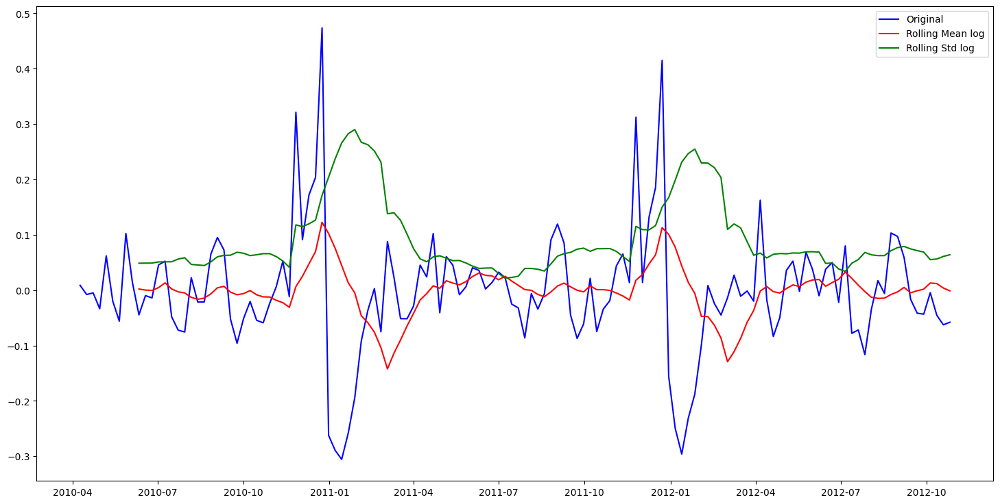

In [180]:
Mean_Store19_new = Store19_new.rolling(window=10).mean()
Std_Store19_new = Store19_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store19_new,label='Original',color='blue')
plt.plot(Mean_Store19_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store19_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [181]:
adf=adfuller(Store19_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


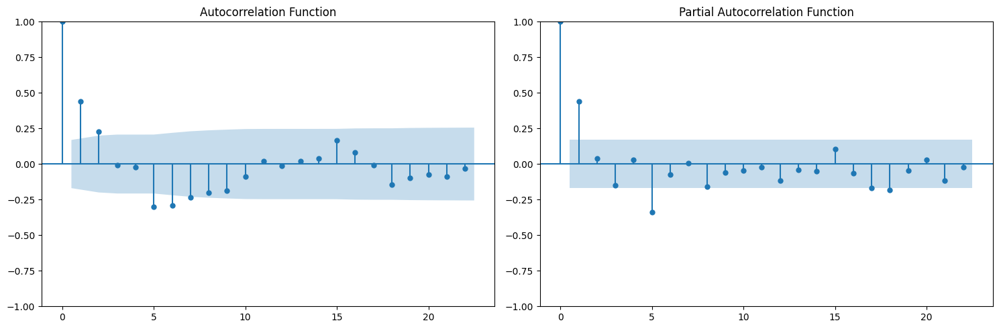

In [182]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store19_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store19_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

In [183]:
model = ARIMA(Store19_new, order=(1, 1, 2))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



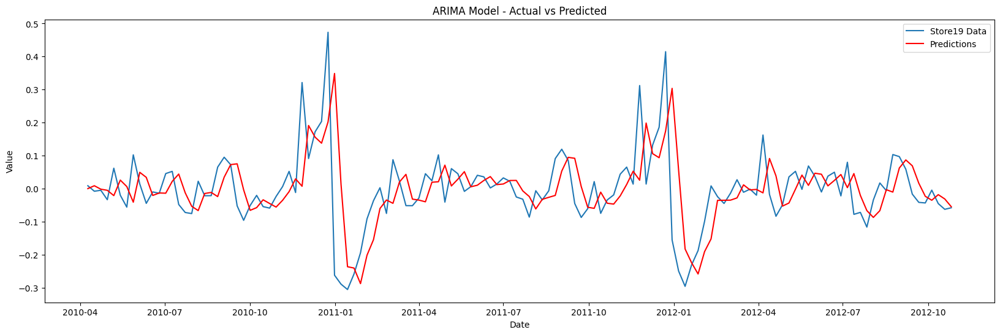

In [184]:
plt.figure(figsize=(20,6))
plt.plot(Store19_new, label='Store19 Data')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [185]:
mse=mean_squared_error(Store19_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.01223222279247971


In [186]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.11059937971109833


In [187]:
forecast_steps = 12
forecast19 = arima_result.forecast(steps=forecast_steps)


In [188]:
Store19_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.043403
2012-10-05,-0.004611
2012-10-12,-0.045402
2012-10-19,-0.062684
2012-10-26,-0.057987


In [189]:
end_date_actual_data19 = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data19 + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [190]:
forecast_df19 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast19})


In [191]:
forecast_df19.set_index('Date',inplace=True)


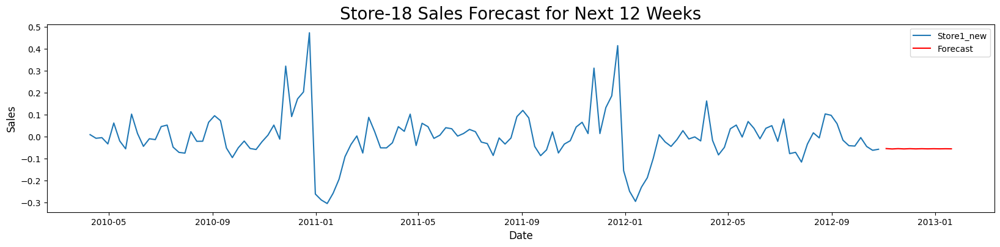

In [192]:
plt.figure(figsize=(20, 4))
plt.plot(Store19_new, label='Store1_new')
plt.plot(forecast_df19, label='Forecast', color='red')
plt.title('Store-18 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()

---This ARIMA models can't handle seasonality directly. If the time series contains seasonal components that are not accounted for, it will impact the model’s predictions. So Switching to SARIMAX, which handles seasonality, to check if this work.

In [194]:
model_SARIMAX = SARIMAX(Store19_new,
                order=(1, 1, 2),       # non-seasonal order
                seasonal_order=(1, 1, 2, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima19 = sarima_result.predict()
print(sarima_result.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(1, 1, 2)x(1, 1, 2, 52)   Log Likelihood                 135.745
Date:                            Wed, 23 Oct 2024   AIC                           -257.490
Time:                                    18:15:02   BIC                           -240.729
Sample:                                04-09-2010   HQIC                          -250.766
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8712      0.524     -1.662      0.096      -1.898       0.156
ma.L1         -0.0837      0.485   

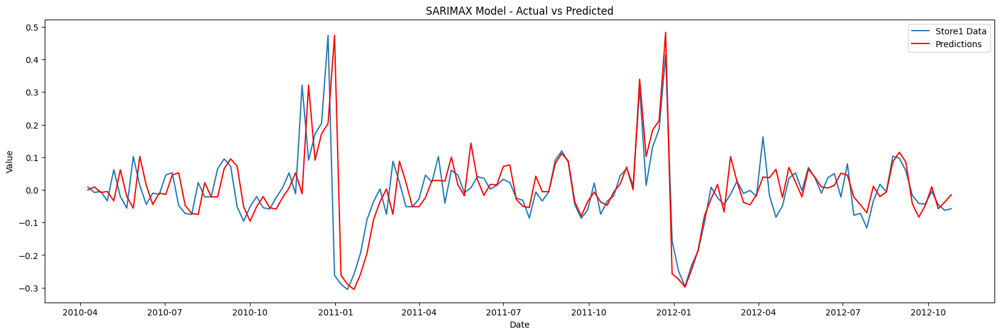

In [195]:
plt.figure(figsize=(20,6))
plt.plot(Store19_new, label='Store1 Data')
plt.plot(predictions_Sarima19, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [196]:
mse=mean_squared_error(Store19_new,predictions_Sarima19)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.00850933981830427


In [197]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.09224608294287769


In [198]:
forecast_steps = 12
forecast191 = sarima_result.forecast(steps=forecast_steps)


In [199]:
forecast_df191 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast19})


In [200]:
forecast_df191.set_index('Date',inplace=True)


In [201]:
combined_df19 = pd.concat([Store19_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df191.rename(columns={'Forecasted_Sales': 'Sales'})])

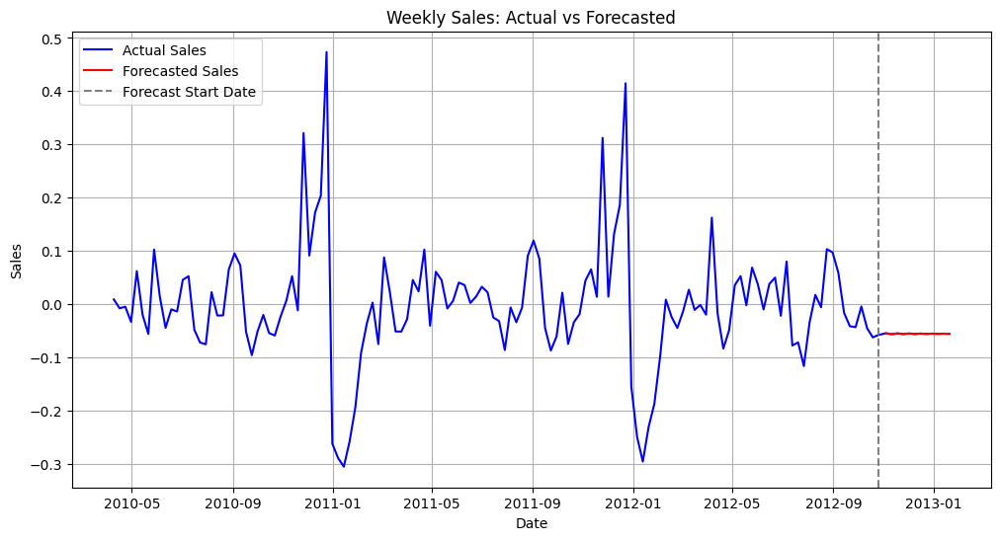

In [202]:
# Sort by date
combined_df19 = combined_df19.sort_values('Date')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(combined_df19.index, combined_df19['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_df191.index, forecast_df191['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data19, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()




---The (p, d, q) and (P, D, Q) parameters for both seasonal and non-seasonal components may not have been properly tuned. This could lead to an inadequate fit for the underlying patterns in the data.
---Instead of trying itertools to find best p,d,q checking with prophet to compare for between itertool technique and prophet between different stores.



In [204]:
Store19prophet= Store19.reset_index()#creating necessary df for prophet model

In [205]:
Store19prophet.head()

,Date,Weekly_Sales
0,2010-02-05,1507637.17
1,2010-02-12,1536549.95
2,2010-02-19,1515976.11
3,2010-02-26,1373270.06
4,2010-03-05,1495844.57


In [206]:
Store19prophet =Store19prophet.rename(columns={'Date':'ds','Weekly_Sales':'y'})

In [207]:
model19 = Prophet()

In [208]:
model19.fit(Store19prophet)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqs0pdzjo/o3d4ex5s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqs0pdzjo/n9yued_z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38176', 'data', 'file=/tmp/tmpqs0pdzjo/o3d4ex5s.json', 'init=/tmp/tmpqs0pdzjo/n9yued_z.json', 'output', 'file=/tmp/tmpqs0pdzjo/prophet_model_my7mth1/prophet_model-20241023181613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:16:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:16:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [209]:
future19 = model19.make_future_dataframe(periods=12, freq='W', include_history=False)

In [210]:
future19

,ds
0,2012-10-28
1,2012-11-04
2,2012-11-11
3,2012-11-18
4,2012-11-25
5,2012-12-02
6,2012-12-09
7,2012-12-16
8,2012-12-23
9,2012-12-30


In [211]:
forecast19 = model19.predict(future19)
forecast19

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2012-10-28,1.415865e+06,1.166279e+06,1.474094e+06,1.415865e+06,1.415865e+06,-91498.152484,-91498.152484,-91498.152484,-91498.152484,-91498.152484,-91498.152484,0.0,0.0,0.0,1.324367e+06
1,2012-11-04,1.415402e+06,1.258126e+06,1.552079e+06,1.415392e+06,1.415412e+06,-8054.731087,-8054.731087,-8054.731087,-8054.731087,-8054.731087,-8054.731087,0.0,0.0,0.0,1.407347e+06
2,2012-11-11,1.414939e+06,1.359235e+06,1.638832e+06,1.414914e+06,1.414966e+06,84572.556055,84572.556055,84572.556055,84572.556055,84572.556055,84572.556055,0.0,0.0,0.0,1.499511e+06
3,2012-11-18,1.414476e+06,1.386106e+06,1.680015e+06,1.414429e+06,1.414527e+06,123810.712388,123810.712388,123810.712388,123810.712388,123810.712388,123810.712388,0.0,0.0,0.0,1.538286e+06
4,2012-11-25,1.414012e+06,1.413696e+06,1.703022e+06,1.413939e+06,1.414097e+06,143593.200062,143593.200062,143593.200062,143593.200062,143593.200062,143593.200062,0.0,0.0,0.0,1.557606e+06
5,2012-12-02,1.413549e+06,1.496595e+06,1.811235e+06,1.413439e+06,1.413670e+06,241413.964484,241413.964484,241413.964484,241413.964484,241413.964484,241413.964484,0.0,0.0,0.0,1.654963e+06
6,2012-12-09,1.413086e+06,1.695357e+06,2.000030e+06,1.412937e+06,1.413245e+06,438271.733208,438271.733208,438271.733208,438271.733208,438271.733208,438271.733208,0.0,0.0,0.0,1.851358e+06
7,2012-12-16,1.412623e+06,1.854319e+06,2.166098e+06,1.412425e+06,1.412819e+06,602258.174774,602258.174774,602258.174774,602258.174774,602258.174774,602258.174774,0.0,0.0,0.0,2.014881e+06
8,2012-12-23,1.412160e+06,1.805863e+06,2.117635e+06,1.411917e+06,1.412404e+06,552528.380360,552528.380360,552528.380360,552528.380360,552528.380360,552528.380360,0.0,0.0,0.0,1.964688e+06
9,2012-12-30,1.411697e+06,1.504085e+06,1.817775e+06,1.411406e+06,1.411984e+06,250812.676746,250812.676746,250812.676746,250812.676746,250812.676746,250812.676746,0.0,0.0,0.0,1.662510e+06


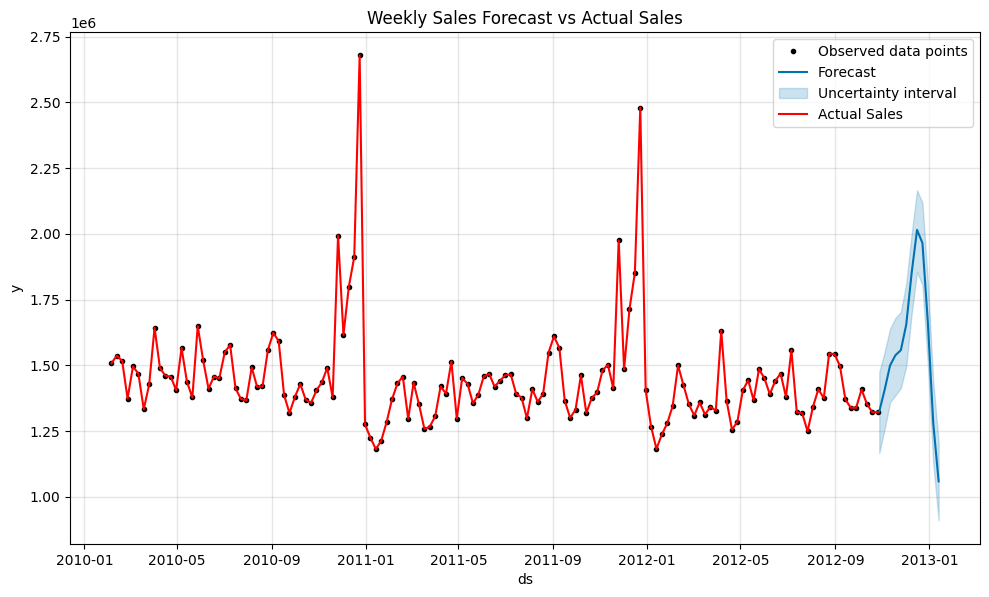

In [212]:
fig = model19.plot(forecast19)
ax = fig.gca()
ax.plot(Store19prophet['ds'], Store19prophet['y'], color='red', label='Actual Sales')
ax.legend()
plt.title('Weekly Sales Forecast vs Actual Sales')
plt.show()



---Prophet Model seems good but not perfect as seen for above store models.



## Store 22 Forecasting

In [213]:
Store22=df1[df1['Store']==22].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [214]:
Store22.set_index('Date',inplace=True)

In [215]:
adf=adfuller(Store22['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

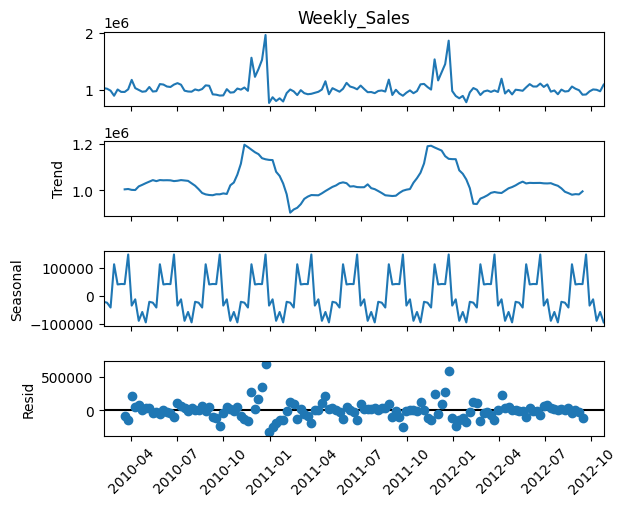

In [216]:
Decomposition=seasonal_decompose(Store22['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [217]:
meanstore22sales=Store22.rolling(window=10).mean()
stdstore22sales=Store22.rolling(window=10).std()

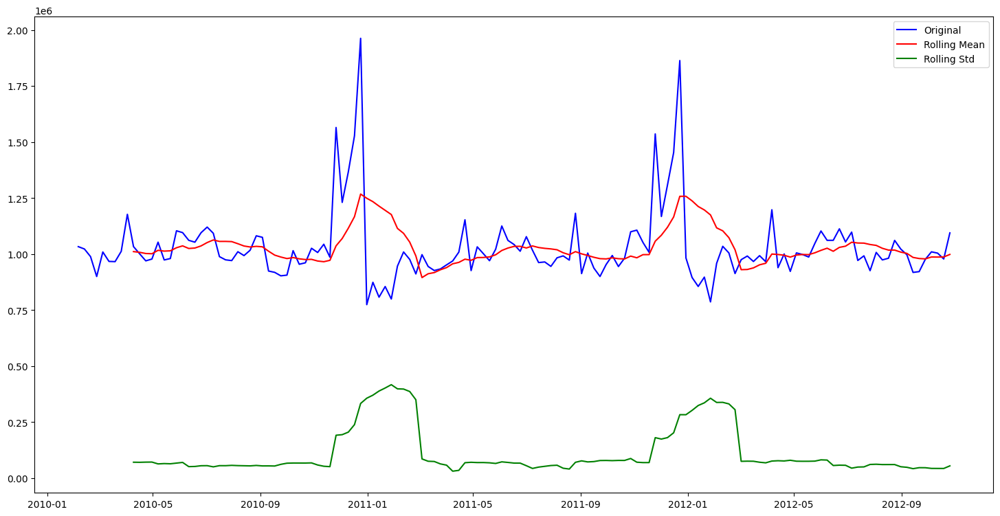

In [218]:
plt.figure(figsize=(18,9))
plt.plot(Store22['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore22sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore22sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

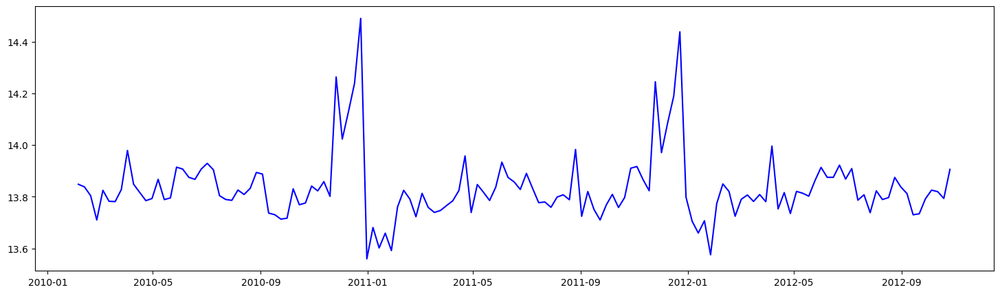

In [219]:
store22_log=np.log(Store22)
plt.figure(figsize=(18,5))
plt.plot(store22_log,label='Original',color='blue')

In [220]:
logmeanstore22sales=store22_log.rolling(window=10).mean()
logstdstore22sales=store22_log.rolling(window=10).std()

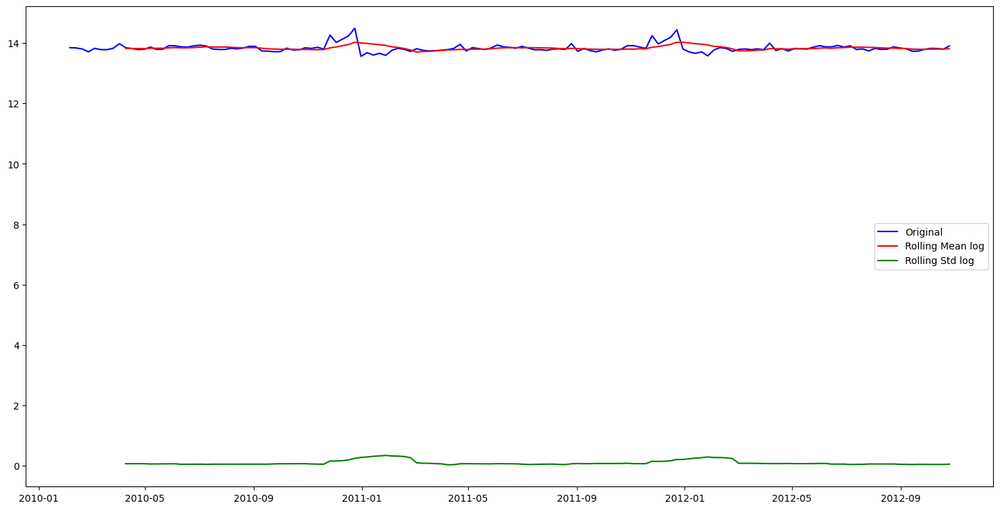

In [221]:
plt.figure(figsize=(18,9))
plt.plot(store22_log,label='Original',color='blue')
plt.plot(logmeanstore22sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore22sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [222]:
Store22_new= store22_log-logmeanstore22sales
Store22_new.dropna(inplace=True)

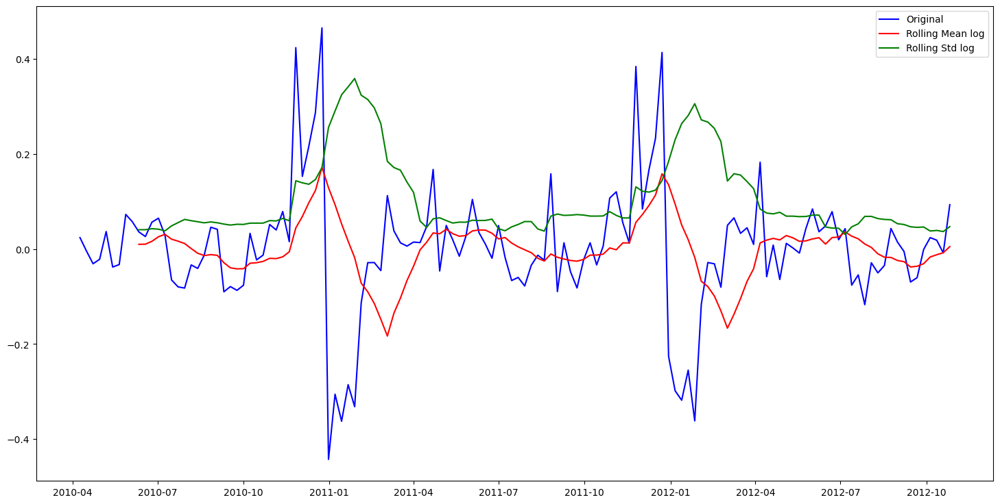

In [223]:
Mean_Store22_new = Store22_new.rolling(window=10).mean()
Std_Store22_new = Store22_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store22_new,label='Original',color='blue')
plt.plot(Mean_Store22_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store22_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [224]:
adf=adfuller(Store22_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


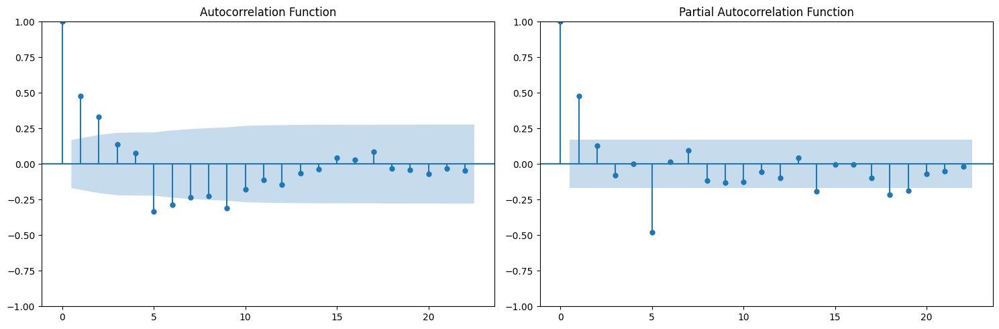

In [225]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store22_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store22_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

In [226]:
model = ARIMA(Store22_new, order=(1, 1, 2))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



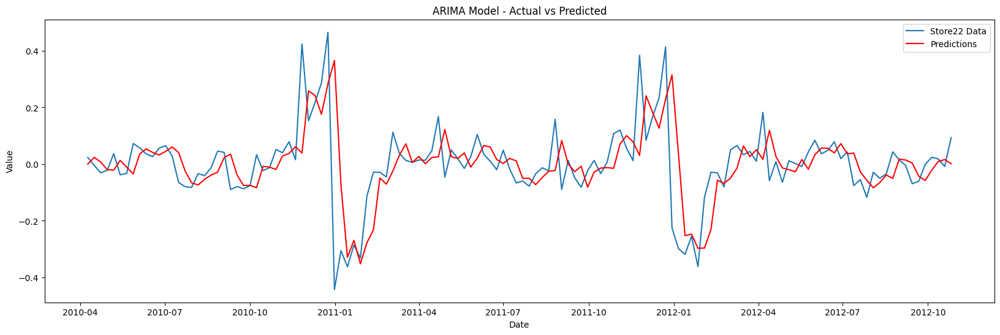

In [227]:
plt.figure(figsize=(20,6))
plt.plot(Store22_new, label='Store22 Data')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [228]:
mse=mean_squared_error(Store22_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.015658640120977788


In [229]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.1251344881356766


In [230]:
forecast_steps = 12
forecast22 = arima_result.forecast(steps=forecast_steps)


In [231]:
Store22_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.000947
2012-10-05,0.023992
2012-10-12,0.018505
2012-10-19,-0.008176
2012-10-26,0.093355


In [232]:
end_date_actual_data22 = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data22 + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [233]:
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast22})


In [234]:
forecast_df.set_index('Date',inplace=True)


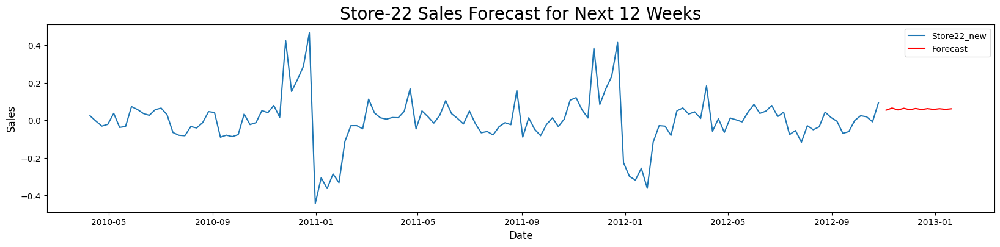

In [235]:
plt.figure(figsize=(20, 4))
plt.plot(Store22_new, label='Store22_new')
plt.plot(forecast_df, label='Forecast', color='red')
plt.title('Store-22 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()



---We can see that for every choosen store ARIMA not working well it may not have captured the seasonality well so trying SARIMAX not using the any exogeneous val for now



In [238]:
model_SARIMAX = SARIMAX(Store22_new,
                order=(1, 1, 2),       # non-seasonal order
                seasonal_order=(1, 1, 2, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima22 = sarima_result.predict()
print(sarima_result.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(1, 1, 2)x(1, 1, 2, 52)   Log Likelihood                 121.691
Date:                            Wed, 23 Oct 2024   AIC                           -229.383
Time:                                    18:22:12   BIC                           -212.622
Sample:                                04-09-2010   HQIC                          -222.658
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8624      0.375     -2.298      0.022      -1.598      -0.127
ma.L1         -0.2073      0.425   

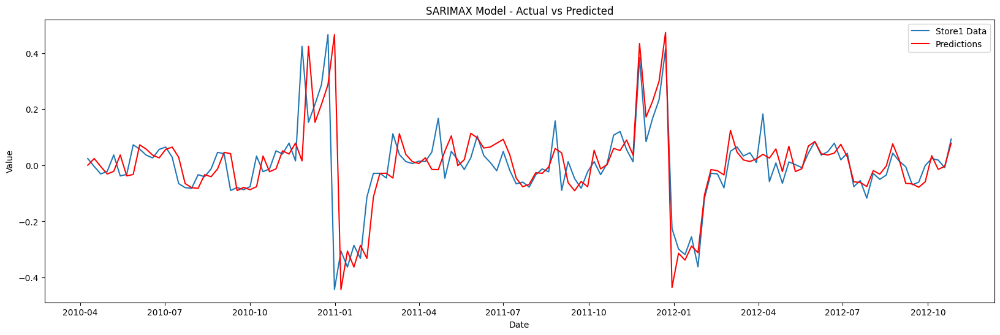

In [239]:
plt.figure(figsize=(20,6))
plt.plot(Store22_new, label='Store1 Data')
plt.plot(predictions_Sarima22, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [240]:
mse=mean_squared_error(Store22_new,predictions_Sarima22)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.011708260527274058


In [241]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.10820471582733378


In [242]:
forecast_steps = 12
forecast221 = sarima_result.forecast(steps=forecast_steps)


In [243]:
forecast_df221 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast22})


In [244]:
forecast_df221.set_index('Date',inplace=True)


In [245]:
combined_df22 = pd.concat([Store22_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df221.rename(columns={'Forecasted_Sales': 'Sales'})])

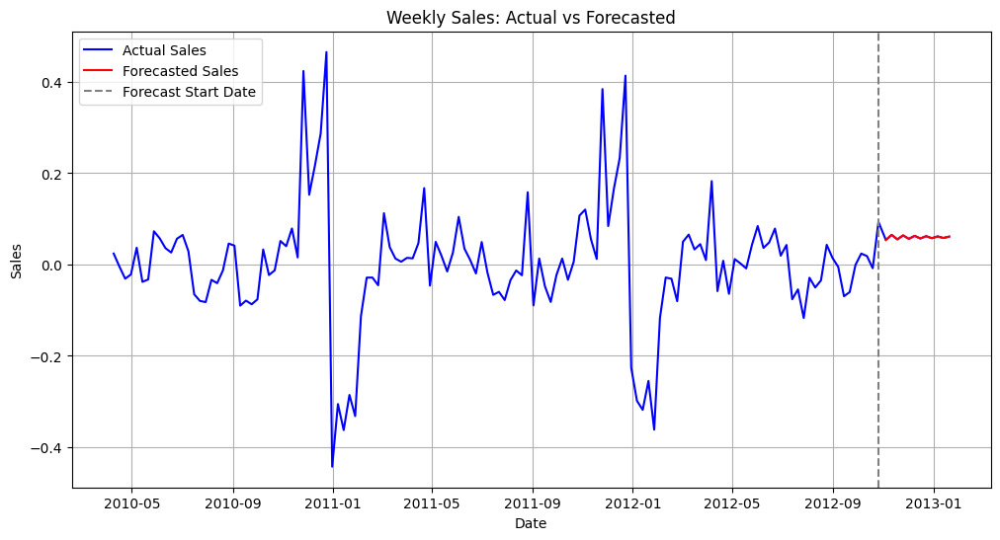

In [246]:
# Sort by date
combined_df22 = combined_df22.sort_values('Date')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(combined_df22.index, combined_df22['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_df221.index, forecast_df221['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()


---The (p, d, q) and (P, D, Q) parameters for both seasonal and non-seasonal components may not have been properly tuned. This could lead to an inadequate fit for the underlying patterns in the data.
---Trying prophet modeling

In [247]:
Store22prophet= Store22.reset_index()

In [248]:
Store22prophet.head()

,Date,Weekly_Sales
0,2010-02-05,1033017.37
1,2010-02-12,1022571.25
2,2010-02-19,988467.61
3,2010-02-26,899761.48
4,2010-03-05,1009201.24


In [249]:
Store22prophet =Store22prophet.rename(columns={'Date':'ds','Weekly_Sales':'y'})

In [250]:
model22 = Prophet()

In [251]:
model22.fit(Store22prophet)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqs0pdzjo/qnviy8t5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqs0pdzjo/qnu8vwhj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9791', 'data', 'file=/tmp/tmpqs0pdzjo/qnviy8t5.json', 'init=/tmp/tmpqs0pdzjo/qnu8vwhj.json', 'output', 'file=/tmp/tmpqs0pdzjo/prophet_modelew_8b9tq/prophet_model-20241023182702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:27:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:27:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [252]:
future22 = model22.make_future_dataframe(periods=12, freq='W', include_history=False)

In [253]:
future22

,ds
0,2012-10-28
1,2012-11-04
2,2012-11-11
3,2012-11-18
4,2012-11-25
5,2012-12-02
6,2012-12-09
7,2012-12-16
8,2012-12-23
9,2012-12-30


In [254]:
forecast22 = model22.predict(future22)
forecast22

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2012-10-28,1.038060e+06,9.020277e+05,1.141428e+06,1.038060e+06,1.038060e+06,-23305.644599,-23305.644599,-23305.644599,-23305.644599,-23305.644599,-23305.644599,0.0,0.0,0.0,1.014754e+06
1,2012-11-04,1.038061e+06,9.449552e+05,1.179099e+06,1.038061e+06,1.038061e+06,22576.575286,22576.575286,22576.575286,22576.575286,22576.575286,22576.575286,0.0,0.0,0.0,1.060638e+06
2,2012-11-11,1.038063e+06,9.901144e+05,1.237170e+06,1.038063e+06,1.038063e+06,68361.267166,68361.267166,68361.267166,68361.267166,68361.267166,68361.267166,0.0,0.0,0.0,1.106424e+06
3,2012-11-18,1.038064e+06,1.020606e+06,1.261192e+06,1.038064e+06,1.038064e+06,105083.022581,105083.022581,105083.022581,105083.022581,105083.022581,105083.022581,0.0,0.0,0.0,1.143147e+06
4,2012-11-25,1.038066e+06,1.084013e+06,1.328077e+06,1.038066e+06,1.038066e+06,167109.904795,167109.904795,167109.904795,167109.904795,167109.904795,167109.904795,0.0,0.0,0.0,1.205176e+06
5,2012-12-02,1.038067e+06,1.208080e+06,1.454632e+06,1.038067e+06,1.038068e+06,291564.369933,291564.369933,291564.369933,291564.369933,291564.369933,291564.369933,0.0,0.0,0.0,1.329632e+06
6,2012-12-09,1.038069e+06,1.368162e+06,1.603660e+06,1.038069e+06,1.038069e+06,447793.114845,447793.114845,447793.114845,447793.114845,447793.114845,447793.114845,0.0,0.0,0.0,1.485862e+06
7,2012-12-16,1.038071e+06,1.442690e+06,1.691576e+06,1.038070e+06,1.038071e+06,527408.250141,527408.250141,527408.250141,527408.250141,527408.250141,527408.250141,0.0,0.0,0.0,1.565479e+06
8,2012-12-23,1.038072e+06,1.349759e+06,1.600813e+06,1.038072e+06,1.038072e+06,429819.487177,429819.487177,429819.487177,429819.487177,429819.487177,429819.487177,0.0,0.0,0.0,1.467892e+06
9,2012-12-30,1.038074e+06,1.087211e+06,1.322193e+06,1.038073e+06,1.038074e+06,167443.078071,167443.078071,167443.078071,167443.078071,167443.078071,167443.078071,0.0,0.0,0.0,1.205517e+06


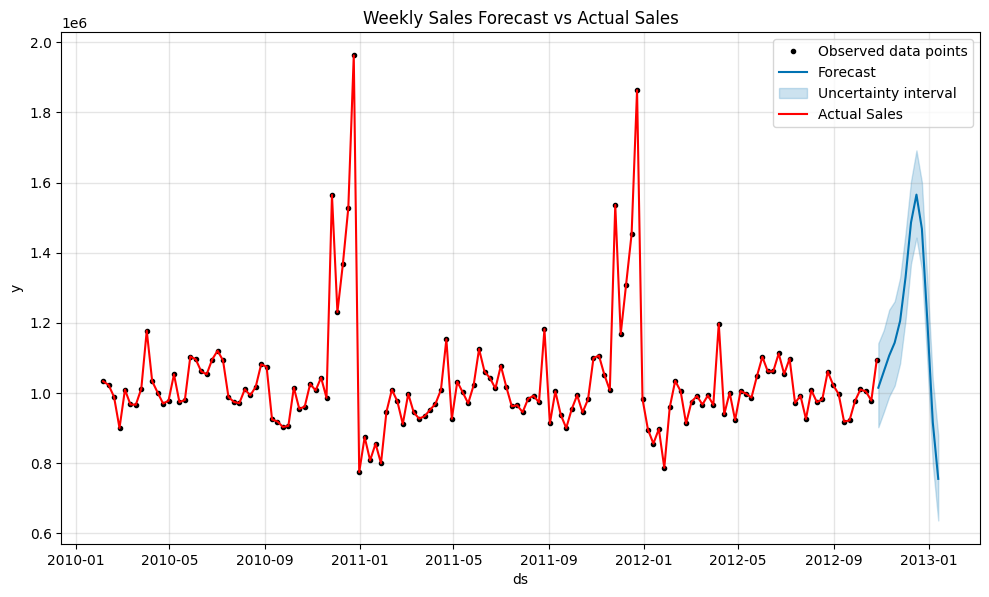

In [255]:
fig = model22.plot(forecast22)
ax = fig.gca()
ax.plot(Store22prophet['ds'], Store22prophet['y'], color='red', label='Actual Sales')
ax.legend()
plt.title('Weekly Sales Forecast vs Actual Sales')
plt.show()

---Seems good but not perfect

## Store 5 Forecasting

In [256]:
Store5=df1[df1['Store']==5].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [257]:
Store5.set_index('Date',inplace=True)

In [258]:
adf=adfuller(Store5['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

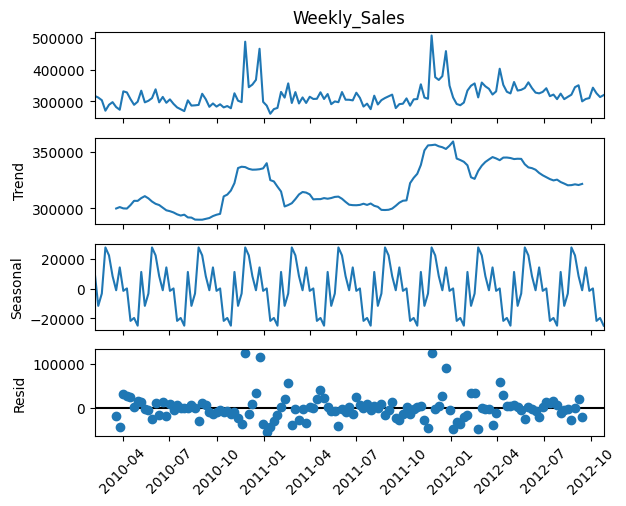

In [259]:
Decomposition=seasonal_decompose(Store5['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [260]:
meanstore5sales=Store5.rolling(window=10).mean()
stdstore5sales=Store5.rolling(window=10).std()

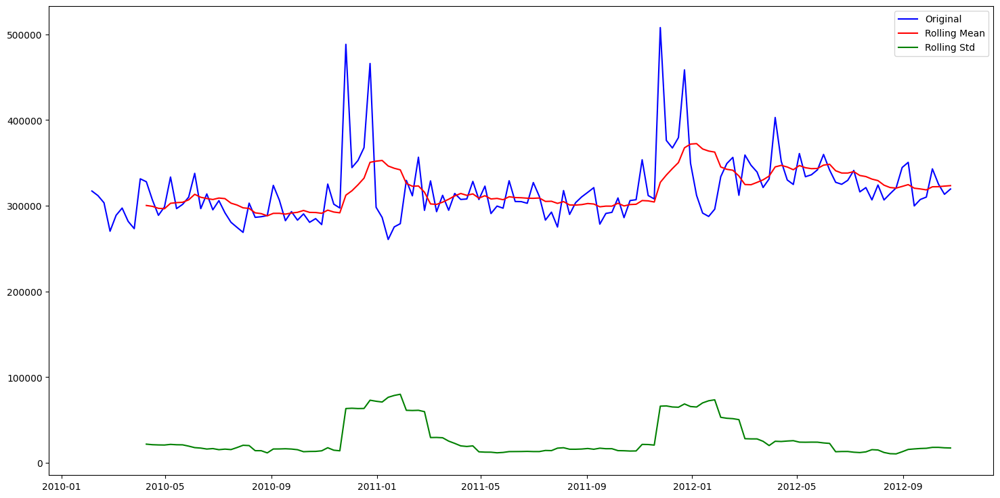

In [261]:
plt.figure(figsize=(18,9))
plt.plot(Store5['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore5sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore5sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

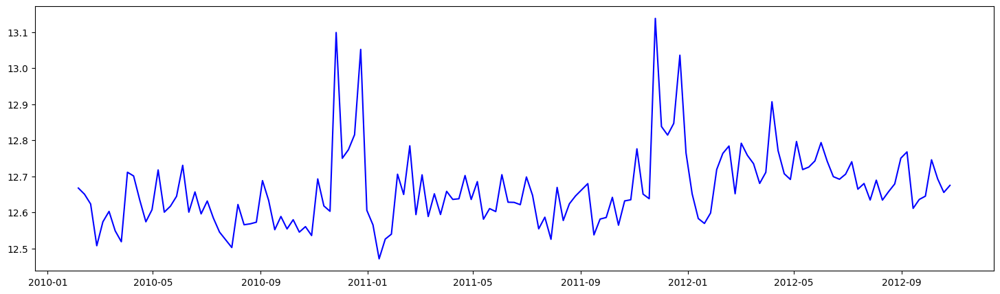

In [262]:
store5_log=np.log(Store5)
plt.figure(figsize=(18,5))
plt.plot(store5_log,label='Original',color='blue')

In [263]:
logmeanstore5sales=store5_log.rolling(window=10).mean()
logstdstore5sales=store5_log.rolling(window=10).std()

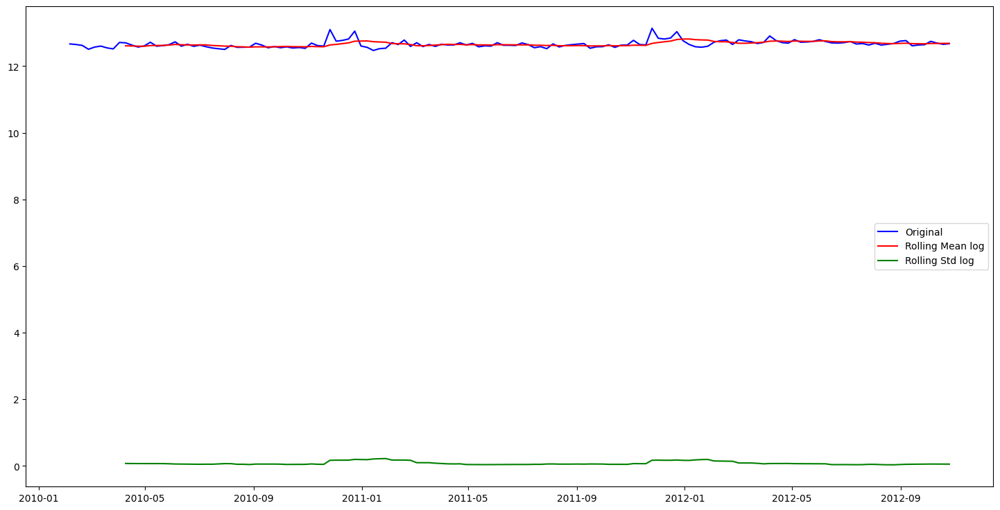

In [264]:
plt.figure(figsize=(18,9))
plt.plot(store5_log,label='Original',color='blue')
plt.plot(logmeanstore5sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore5sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [265]:
Store5_new= store5_log-logmeanstore5sales
Store5_new.dropna(inplace=True)

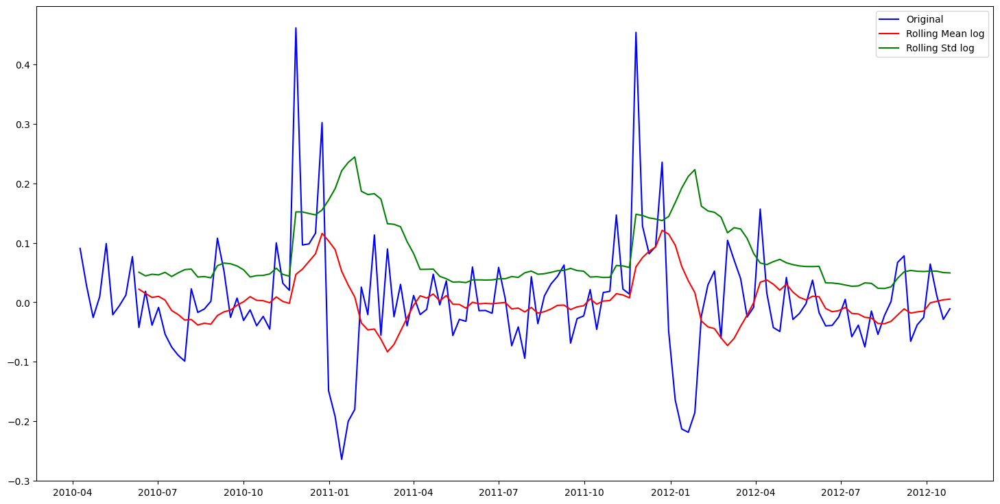

In [266]:
Mean_Store5_new = Store5_new.rolling(window=10).mean()
Std_Store5_new = Store5_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store5_new,label='Original',color='blue')
plt.plot(Mean_Store5_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store5_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [267]:
adf=adfuller(Store5_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


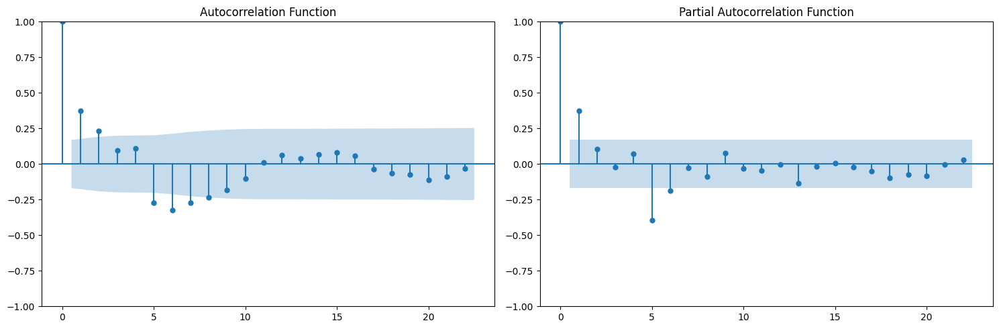

In [268]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store5_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store5_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

In [269]:
model = ARIMA(Store5_new, order=(1, 1, 2))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



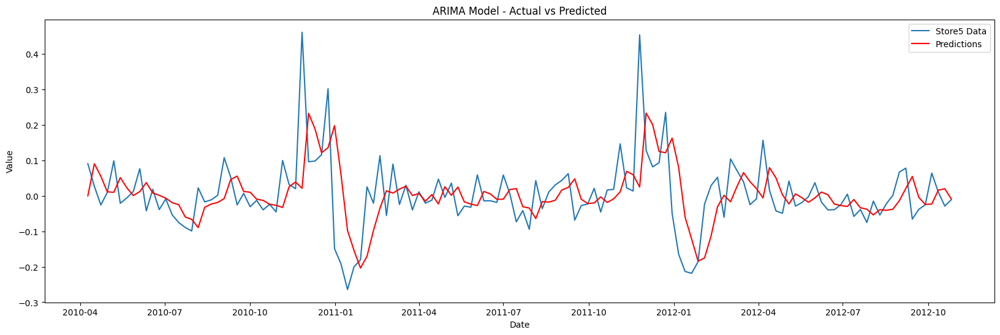

In [270]:
plt.figure(figsize=(20,6))
plt.plot(Store5_new, label='Store5 Data')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [271]:
mse=mean_squared_error(Store5_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.009564700936021837


In [272]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.09779928903638224


In [273]:
forecast_steps = 12
forecast5 = arima_result.forecast(steps=forecast_steps)


In [274]:
Store5_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.025404
2012-10-05,0.064279
2012-10-12,0.010941
2012-10-19,-0.028728
2012-10-26,-0.010906


In [275]:
end_date_actual_data5 = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data5 + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [276]:
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast5})


In [277]:
forecast_df.set_index('Date',inplace=True)


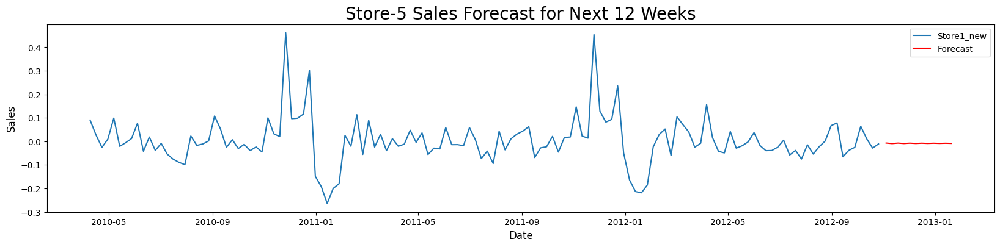

In [278]:
plt.figure(figsize=(20, 4))
plt.plot(Store5_new, label='Store1_new')
plt.plot(forecast_df, label='Forecast', color='red')
plt.title('Store-5 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()

---ARIMA not captured the seasonality here which might be necessary

In [280]:
model_SARIMAX = SARIMAX(Store5_new,
                order=(1, 1, 2),       # non-seasonal order
                seasonal_order=(1, 1, 2, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima5 = sarima_result.predict()
print(sarima_result.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(1, 1, 2)x(1, 1, 2, 52)   Log Likelihood                 142.117
Date:                            Wed, 23 Oct 2024   AIC                           -270.234
Time:                                    18:34:43   BIC                           -253.473
Sample:                                04-09-2010   HQIC                          -263.509
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9357      0.283     -3.303      0.001      -1.491      -0.380
ma.L1         -0.0978      0.976   

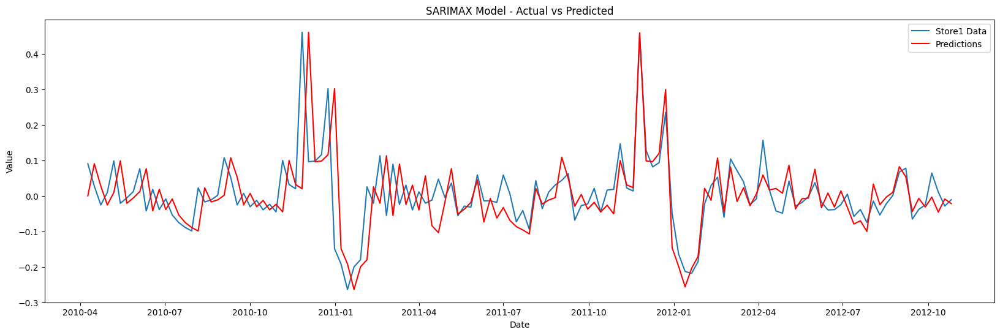

In [281]:
plt.figure(figsize=(20,6))
plt.plot(Store5_new, label='Store1 Data')
plt.plot(predictions_Sarima5, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [282]:
mse=mean_squared_error(Store5_new,predictions_Sarima5)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.0074964119935184885


In [283]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.08658182253520937


In [284]:
forecast_steps = 12
forecast51 = sarima_result.forecast(steps=forecast_steps)


In [285]:
forecast_df51 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast1})


In [286]:
forecast_df51.set_index('Date',inplace=True)


In [287]:
combined_df51 = pd.concat([Store5_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df51.rename(columns={'Forecasted_Sales': 'Sales'})])

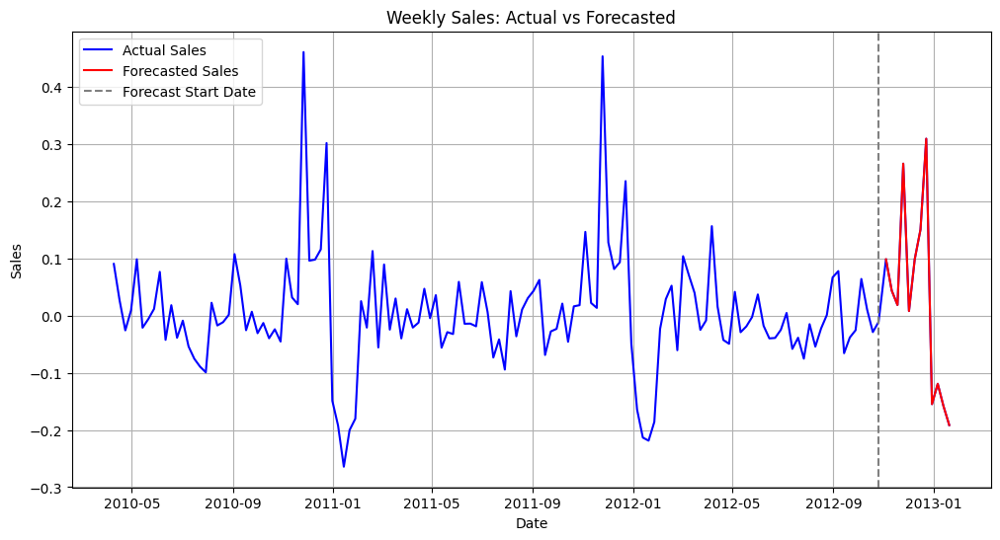

In [288]:
# Sort by date
combined_df51 = combined_df51.sort_values('Date')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(combined_df51.index, combined_df51['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_df51.index, forecast_df51['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data5, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()




------So in January 2011 sales is down which was same in January 2012 and prediction looks real. At January 2013 we have same downfall as previous years


## Store 42 Forecasting

In [289]:
Store42=df1[df1['Store']==42].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [290]:
Store42.set_index('Date',inplace=True)

In [291]:
adf=adfuller(Store42['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is not stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

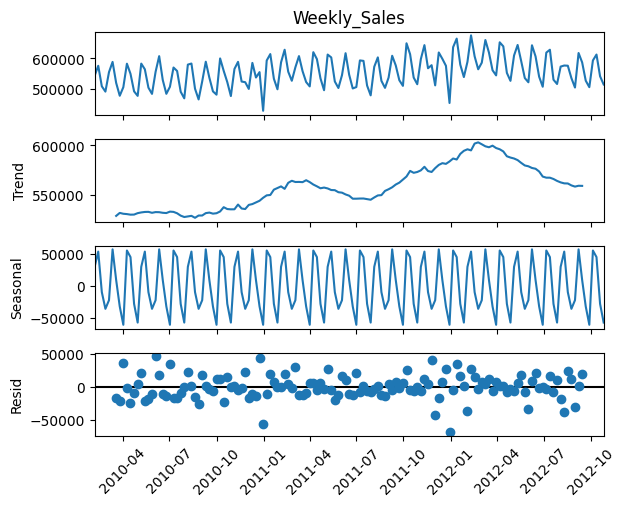

In [292]:
Decomposition=seasonal_decompose(Store42['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [293]:
meanstore42sales=Store42.rolling(window=10).mean()
stdstore42sales=Store42.rolling(window=10).std()

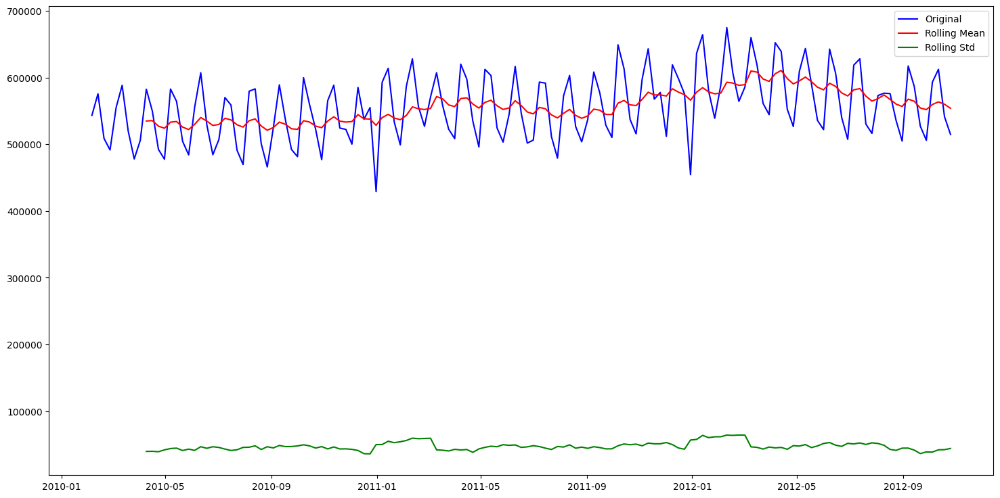

In [294]:
plt.figure(figsize=(18,9))
plt.plot(Store42['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore42sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore42sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

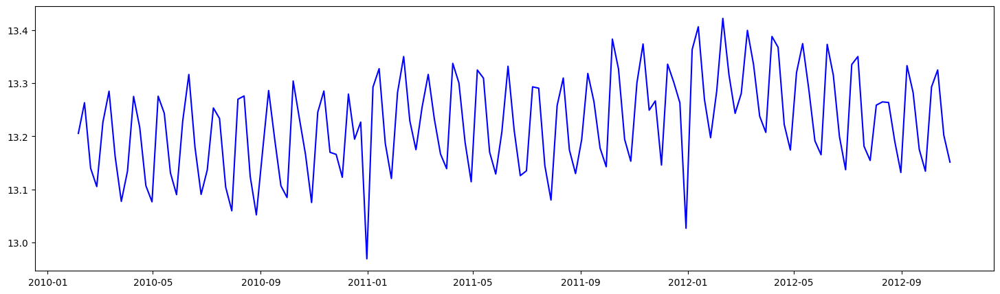

In [295]:
store42_log=np.log(Store42)
plt.figure(figsize=(18,5))
plt.plot(store42_log,label='Original',color='blue')

In [296]:
logmeanstore42sales=store42_log.rolling(window=10).mean()
logstdstore42sales=store42_log.rolling(window=10).std()

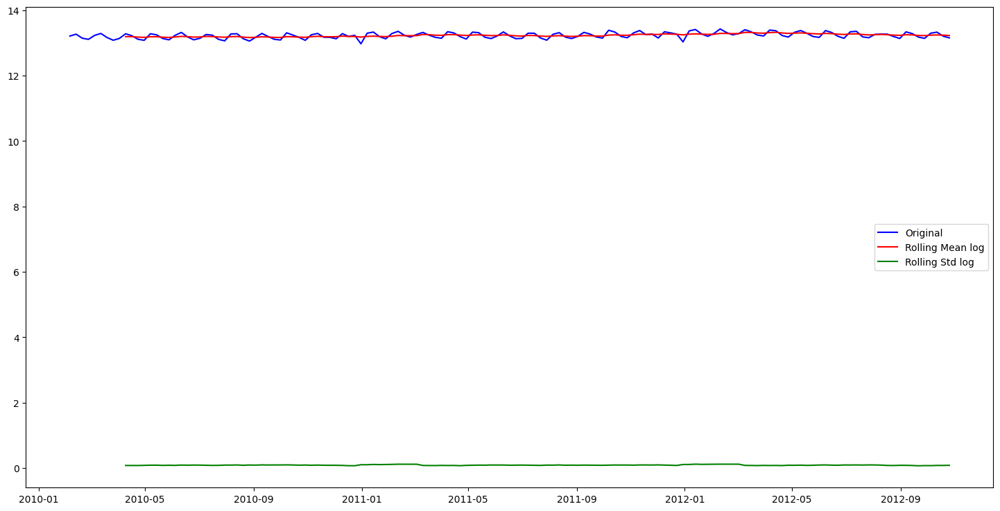

In [297]:
plt.figure(figsize=(18,9))
plt.plot(store42_log,label='Original',color='blue')
plt.plot(logmeanstore42sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore42sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [298]:
Store42_new= store42_log-logmeanstore42sales
Store42_new.dropna(inplace=True)

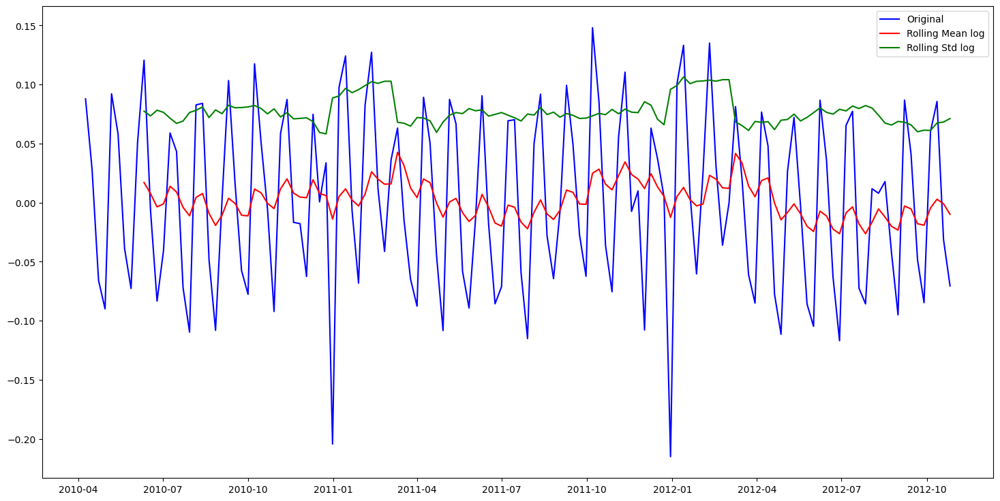

In [299]:
Mean_Store42_new = Store42_new.rolling(window=10).mean()
Std_Store42_new = Store42_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store42_new,label='Original',color='blue')
plt.plot(Mean_Store42_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store42_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [300]:
adf=adfuller(Store42_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


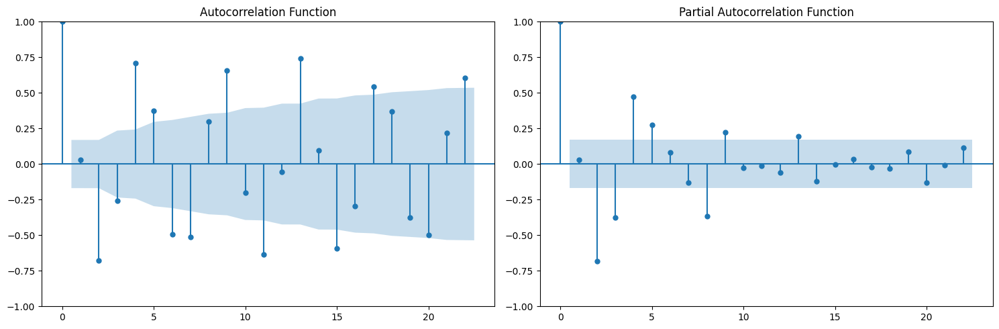

In [301]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store42_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store42_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

---Judging p,d,q value here is quite unsatisfactory because at 1st lag there is no relation but after that there is a relation and at which point to stop is not quite logical.
---So now trying itertool technique to get a stable p,d,q number.

In [303]:
Store42_new.index = pd.to_datetime(Store42_new.index)
Store42_new = Store42_new.asfreq('W-FRI')  # Assuming weekly data on Fridays

In [304]:
# Define the range of p, d, q values
p_values = range(0, 4)
d_values = range(0, 2)
q_values = range(0, 4)

# Store AIC values for each model
aic_values = []

# Iterate over p, d, q values and fit ARIMA models
for p in p_values:
    for d in d_values:
        for q in q_values:
            try:
                # Fit ARIMA model
                model = ARIMA(Store42_new, order=(p, d, q))
                result = model.fit()

                # Append the (p,d,q) values and corresponding AIC to the list
                aic_values.append(((p, d, q), result.aic))
                print(f"ARIMA({p},{d},{q}) fitted successfully with AIC: {result.aic}")

            except Exception as e:
                # Print error message if model fitting fails
                print(f"Error fitting ARIMA({p},{d},{q}): {e}")

# Check if any models were fitted successfully
if not aic_values:
    print("No models were successfully fitted.")
else:
    print(f"Models fitted: {len(aic_values)}")

    # Find the model with the lowest AIC
    best_model = min(aic_values, key=lambda x: x[1])
    print(f'Best model: ARIMA{best_model[0]} with AIC: {best_model[1]}')


ARIMA(0,0,0) fitted successfully with AIC: -309.33695882244405
ARIMA(0,0,1) fitted successfully with AIC: -313.31995305875785
ARIMA(0,0,2) fitted successfully with AIC: -345.6610389610414
ARIMA(0,0,3) fitted successfully with AIC: -360.5635495382985
ARIMA(0,1,0) fitted successfully with AIC: -221.17727402175305
ARIMA(0,1,1) fitted successfully with AIC: -301.10448125253424
ARIMA(0,1,2) fitted successfully with AIC: -304.03321016514946
ARIMA(0,1,3) fitted successfully with AIC: -335.9583301649052
ARIMA(1,0,0) fitted successfully with AIC: -307.4685892304352
ARIMA(1,0,1) fitted successfully with AIC: -321.29341463863557
ARIMA(1,0,2) fitted successfully with AIC: -343.76811429132783
ARIMA(1,0,3) fitted successfully with AIC: -363.06160188882075
ARIMA(1,1,0) fitted successfully with AIC: -221.39325014900783
ARIMA(1,1,1) fitted successfully with AIC: -299.3066094723325
ARIMA(1,1,2) fitted successfully with AIC: -303.9511257333636
ARIMA(1,1,3) fitted successfully with AIC: -334.0695421418242

In [305]:
model = ARIMA(Store42_new, order=(3,0,3))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

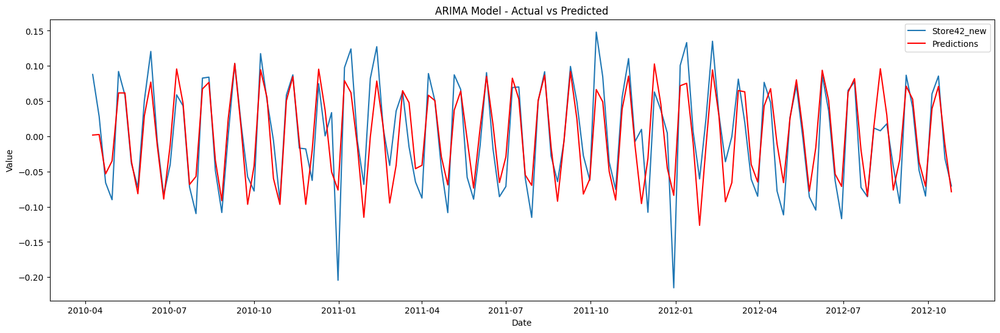

In [306]:
plt.figure(figsize=(20,6))
plt.plot(Store42_new, label='Store42_new')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [307]:
mse=mean_squared_error(Store42_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.0016233778841016702


In [308]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.040291163846452364


In [309]:
forecast_steps = 12
forecast42 = arima_result.forecast(steps=forecast_steps)


In [310]:
Store42_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.084764
2012-10-05,0.060343
2012-10-12,0.085595
2012-10-19,-0.031285
2012-10-26,-0.070522


In [311]:
end_date_actual_data = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [312]:
forecast_df42 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast42})


In [313]:
forecast_df42.set_index('Date',inplace=True)


In [314]:
combined_df42 = pd.concat([Store42_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df42.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_df42 = combined_df42.sort_values('Date')

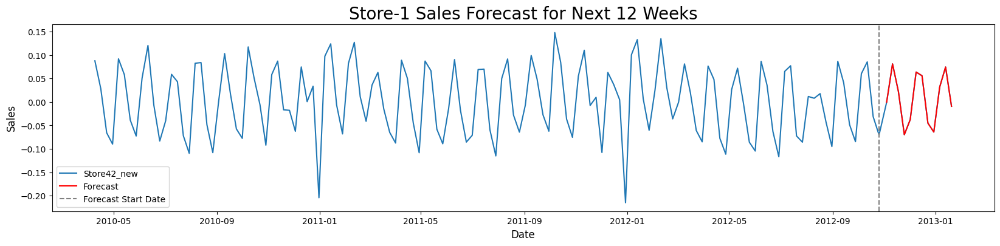

In [315]:
plt.figure(figsize=(20, 4))
plt.plot(combined_df42.index,combined_df42['Sales'], label='Store42_new')
plt.plot(forecast_df42.index,forecast_df42['Forecasted_Sales'], label='Forecast', color='red')
plt.axvline(x=end_date_actual_data, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Store-1 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()

---We do have fluctuation in the prediction but there is no downfall at january 2013, not capturing seasonality might be one of the reason. Trying SARIMAX without exogeneous val, if required will change the model accordingly.

In [316]:
model_SARIMAX = SARIMAX(Store42_new,
                order=(3, 0, 3),       # non-seasonal order
                seasonal_order=(3, 0, 3, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima42 = sarima_result.predict()
print(sarima_result.summary())


                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(3, 0, 3)x(3, 0, 3, 52)   Log Likelihood                 269.769
Date:                            Wed, 23 Oct 2024   AIC                           -513.539
Time:                                    18:45:55   BIC                           -475.867
Sample:                                04-09-2010   HQIC                          -498.230
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4285      0.786     -0.545      0.586      -1.969       1.112
ar.L2         -0.8094      0.206   

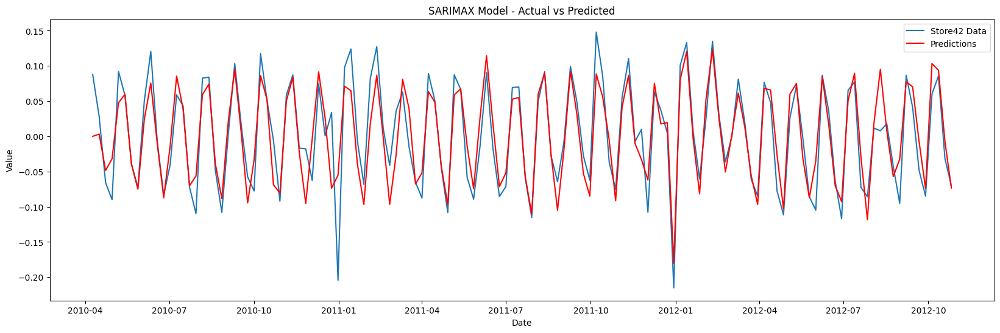

In [317]:
plt.figure(figsize=(20,6))
plt.plot(Store42_new, label='Store42 Data')
plt.plot(predictions_Sarima42, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [318]:
mse=mean_squared_error(Store42_new,predictions_Sarima42)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.0011706297642823272


In [319]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.03421446717811527


In [320]:
forecast_steps = 12
forecastsarima42 = sarima_result.forecast(steps=forecast_steps)


In [321]:
forecast_dfsarima42 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecastsarima42})


In [322]:
forecast_dfsarima42.set_index('Date',inplace=True)


In [323]:
combined_dfsarimax42 = pd.concat([Store42_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_dfsarima42.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_dfsarimax42 = combined_dfsarimax42.sort_values('Date')

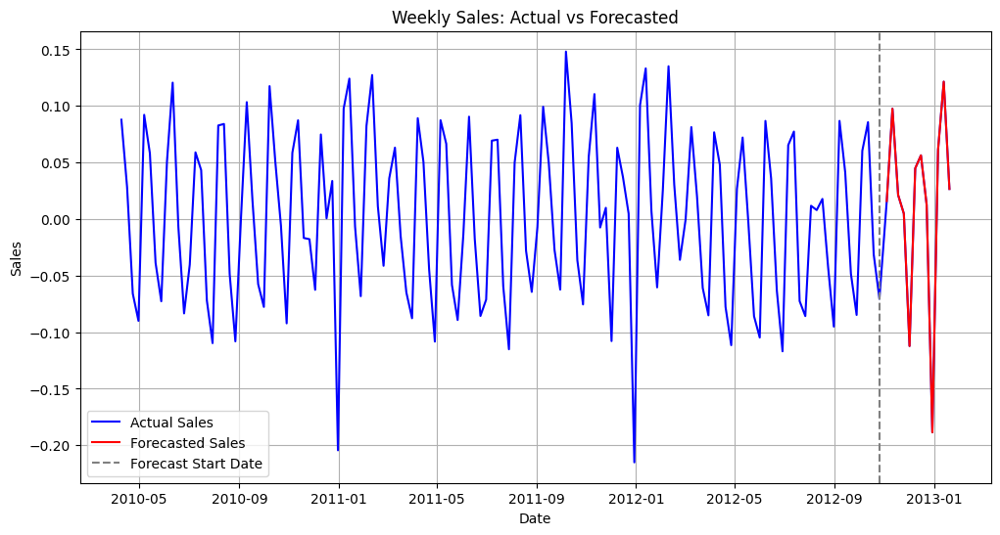

In [324]:
plt.figure(figsize=(12, 6))
plt.plot(combined_dfsarimax42.index, combined_dfsarimax42['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_dfsarima42.index, forecast_dfsarima42['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data5, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()




---Model looks perfect, to summarize if we use itertool instead of prophet gives better result. Also instead of plotting ACF, PACF to get p,d,q value we can prefer this itertool.



## Store 45 Forecasting

In [325]:
Store45=df1[df1['Store']==45].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [326]:
Store45.set_index('Date',inplace=True)

In [327]:
adf=adfuller(Store45['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

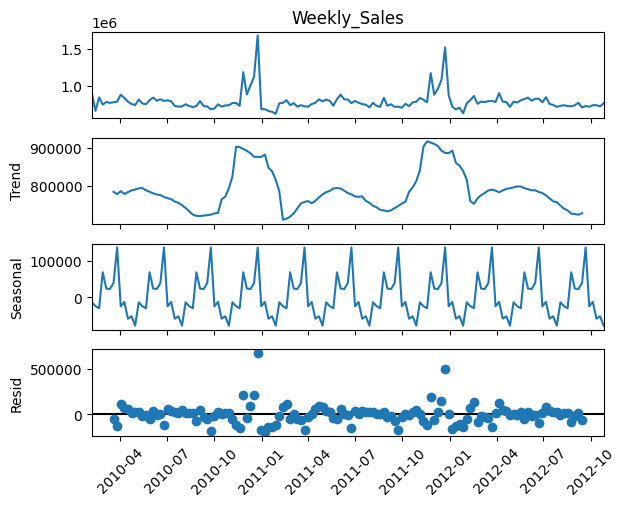

In [328]:
Decomposition=seasonal_decompose(Store45['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [329]:
meanstore45sales=Store45.rolling(window=10).mean()
stdstore45sales=Store45.rolling(window=10).std()

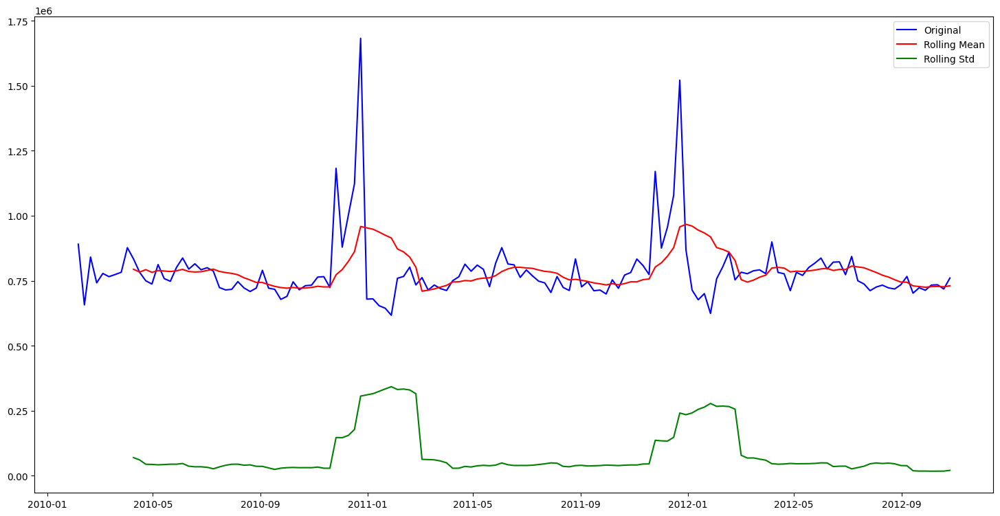

In [330]:
plt.figure(figsize=(18,9))
plt.plot(Store45['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore45sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore45sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

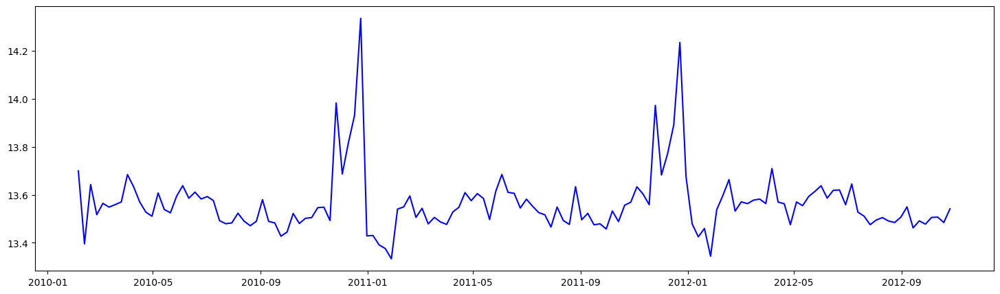

In [331]:
store45_log=np.log(Store45)
plt.figure(figsize=(18,5))
plt.plot(store45_log,label='Original',color='blue')

In [332]:
logmeanstore45sales=store45_log.rolling(window=10).mean()
logstdstore45sales=store45_log.rolling(window=10).std()

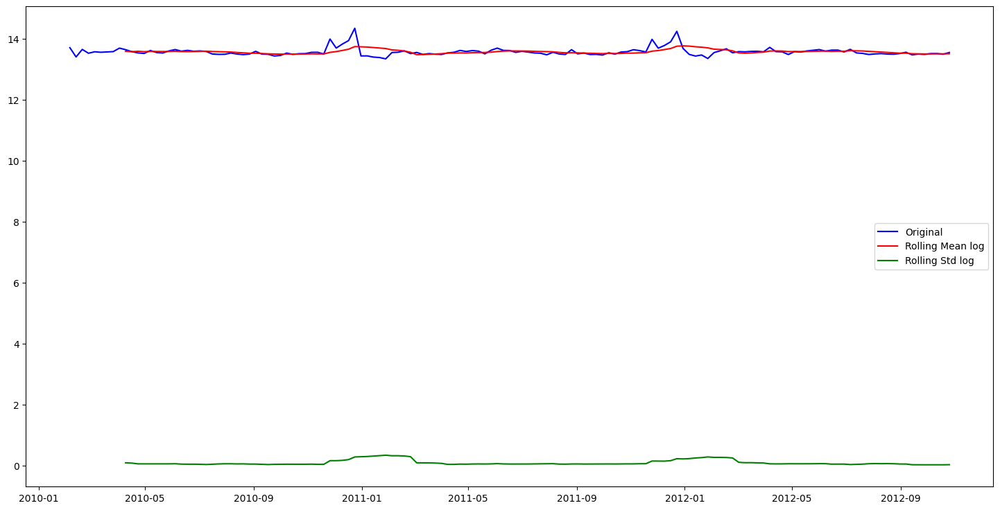

In [333]:
plt.figure(figsize=(18,9))
plt.plot(store45_log,label='Original',color='blue')
plt.plot(logmeanstore45sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore45sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [334]:
Store45_new= store45_log-logmeanstore45sales
Store45_new.dropna(inplace=True)

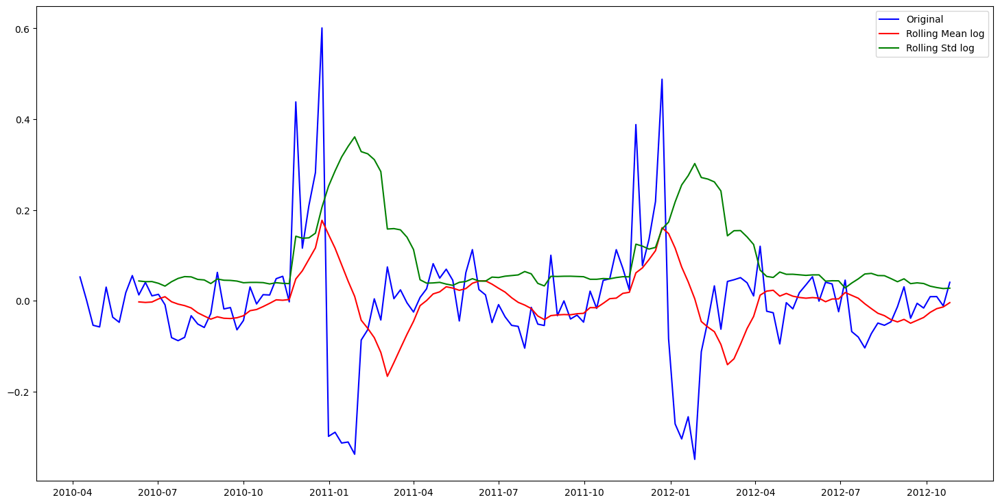

In [335]:
Mean_Store45_new = Store45_new.rolling(window=10).mean()
Std_Store45_new = Store45_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store45_new,label='Original',color='blue')
plt.plot(Mean_Store45_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store45_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [336]:
adf=adfuller(Store45_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


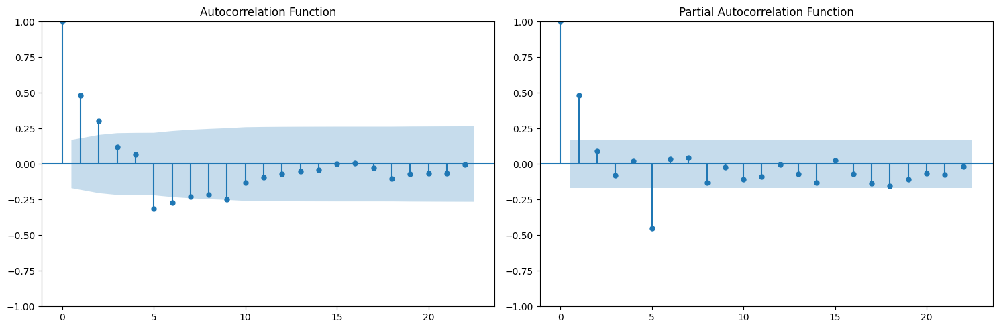

In [337]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store45_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store45_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

In [338]:
model = ARIMA(Store45_new, order=(1,1,2))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



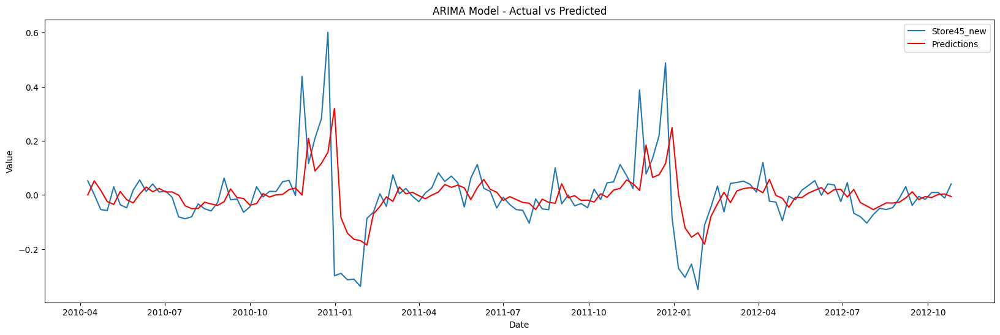

In [339]:
plt.figure(figsize=(20,6))
plt.plot(Store45_new, label='Store45_new')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [340]:
mse=mean_squared_error(Store45_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.013295640062811804


In [341]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.1153067216722937


In [342]:
forecast_steps = 12
forecast45 = arima_result.forecast(steps=forecast_steps)


In [343]:
Store45_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.016254
2012-10-05,0.008772
2012-10-12,0.008951
2012-10-19,-0.011491
2012-10-26,0.040456


In [344]:
end_date_actual_data = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [345]:
forecast_df45 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast45})


In [346]:
forecast_df45.set_index('Date',inplace=True)


In [347]:
combined_df45 = pd.concat([Store45_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df45.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_df45 = combined_df45.sort_values('Date')

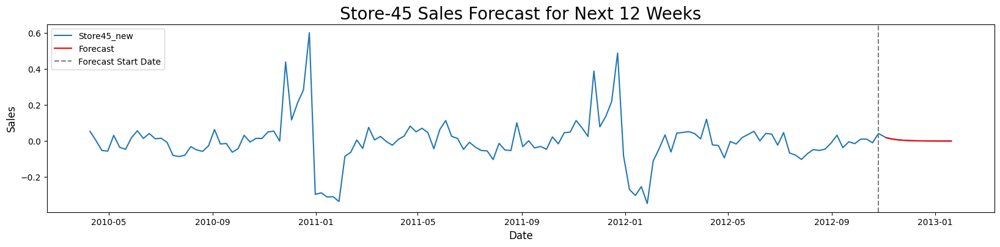

In [348]:
plt.figure(figsize=(20, 4))
plt.plot(combined_df45.index,combined_df45['Sales'], label='Store45_new')
plt.plot(forecast_df45.index,forecast_df45['Forecasted_Sales'], label='Forecast', color='red')
plt.axvline(x=end_date_actual_data, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Store-45 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()

---Switching to SARIMAX model to get better results

In [349]:
model_SARIMAX = SARIMAX(Store42_new,
                order=(1, 1, 2),       # non-seasonal order
                seasonal_order=(1, 1, 2, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima45 = sarima_result.predict()
print(sarima_result.summary())


                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(1, 1, 2)x(1, 1, 2, 52)   Log Likelihood                 165.742
Date:                            Wed, 23 Oct 2024   AIC                           -317.484
Time:                                    19:15:42   BIC                           -300.722
Sample:                                04-09-2010   HQIC                          -310.759
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6467      0.281     -2.303      0.021      -1.197      -0.096
ma.L1         -0.1424      0.227   

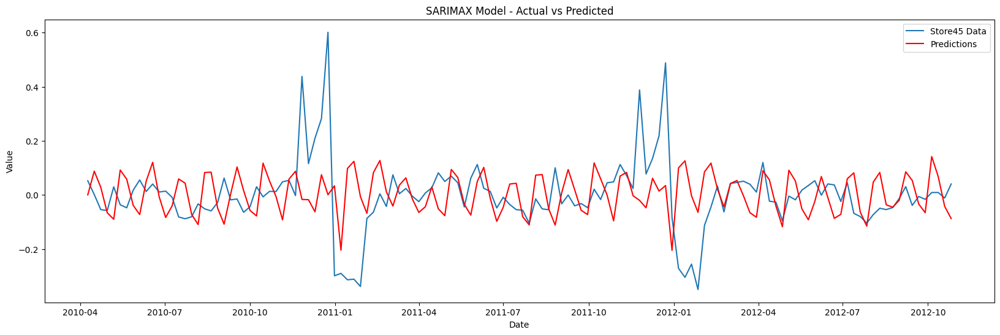

In [350]:
plt.figure(figsize=(20,6))
plt.plot(Store45_new, label='Store45 Data')
plt.plot(predictions_Sarima45, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [351]:
mse=mean_squared_error(Store45_new,predictions_Sarima45)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.02263342095063753


In [352]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.15044407914782665


In [353]:
forecast_steps = 12
forecastsarima45 = sarima_result.forecast(steps=forecast_steps)


In [354]:
forecast_dfsarima45 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecastsarima45})


In [355]:
forecast_dfsarima45.set_index('Date',inplace=True)


In [356]:
combined_dfsarimax45 = pd.concat([Store45_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_dfsarima45.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_dfsarimax45 = combined_dfsarimax45.sort_values('Date')

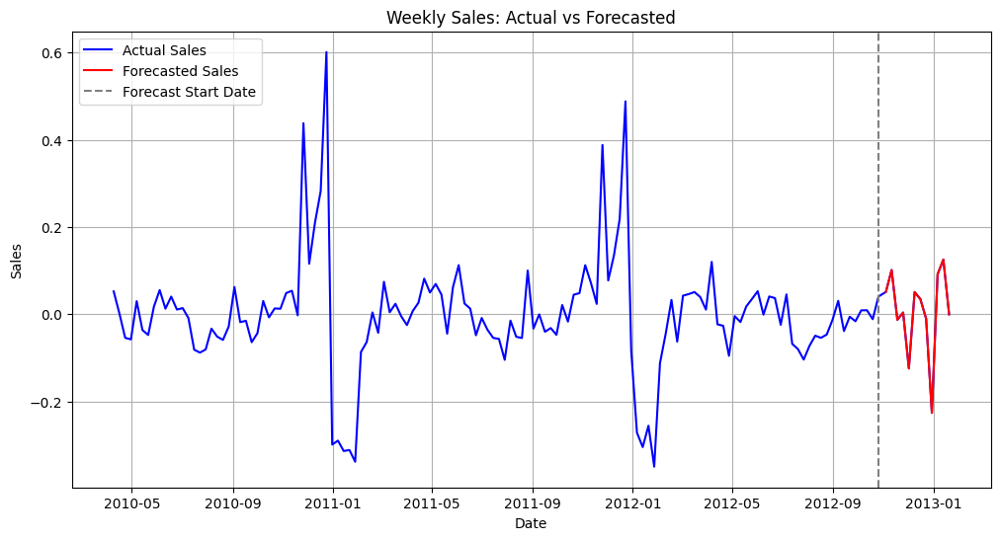

In [357]:
plt.figure(figsize=(12, 6))
plt.plot(combined_dfsarimax45.index, combined_dfsarimax45['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_dfsarima45.index, forecast_dfsarima45['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()


---Model did tried to predict but not better.Can be tried little more to get good results.
---Trying both prophet and itertool to compare.

In [358]:
Store45prophet= Store45.reset_index()

In [359]:
Store45prophet.head()

,Date,Weekly_Sales
0,2010-02-05,890689.51
1,2010-02-12,656988.64
2,2010-02-19,841264.04
3,2010-02-26,741891.65
4,2010-03-05,777951.22


In [360]:
Store45prophet =Store22prophet.rename(columns={'Date':'ds','Weekly_Sales':'y'})

In [361]:
model45 = Prophet()

In [362]:
model45.fit(Store45prophet)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqs0pdzjo/uy483z74.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqs0pdzjo/95mizqzx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74658', 'data', 'file=/tmp/tmpqs0pdzjo/uy483z74.json', 'init=/tmp/tmpqs0pdzjo/95mizqzx.json', 'output', 'file=/tmp/tmpqs0pdzjo/prophet_modelr111c32t/prophet_model-20241023191719.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [363]:
future45 = model45.make_future_dataframe(periods=12, freq='W', include_history=False)

In [364]:
future45

,ds
0,2012-10-28
1,2012-11-04
2,2012-11-11
3,2012-11-18
4,2012-11-25
5,2012-12-02
6,2012-12-09
7,2012-12-16
8,2012-12-23
9,2012-12-30


In [365]:
forecast45 = model45.predict(future45)
forecast45

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2012-10-28,1.038060e+06,8.987786e+05,1.136641e+06,1.038060e+06,1.038060e+06,-23305.644599,-23305.644599,-23305.644599,-23305.644599,-23305.644599,-23305.644599,0.0,0.0,0.0,1.014754e+06
1,2012-11-04,1.038061e+06,9.435424e+05,1.181164e+06,1.038061e+06,1.038061e+06,22576.575286,22576.575286,22576.575286,22576.575286,22576.575286,22576.575286,0.0,0.0,0.0,1.060638e+06
2,2012-11-11,1.038063e+06,9.803516e+05,1.219160e+06,1.038063e+06,1.038063e+06,68361.267166,68361.267166,68361.267166,68361.267166,68361.267166,68361.267166,0.0,0.0,0.0,1.106424e+06
3,2012-11-18,1.038064e+06,1.014640e+06,1.265249e+06,1.038064e+06,1.038064e+06,105083.022581,105083.022581,105083.022581,105083.022581,105083.022581,105083.022581,0.0,0.0,0.0,1.143147e+06
4,2012-11-25,1.038066e+06,1.084969e+06,1.323708e+06,1.038066e+06,1.038066e+06,167109.904795,167109.904795,167109.904795,167109.904795,167109.904795,167109.904795,0.0,0.0,0.0,1.205176e+06
5,2012-12-02,1.038067e+06,1.212846e+06,1.446351e+06,1.038067e+06,1.038068e+06,291564.369933,291564.369933,291564.369933,291564.369933,291564.369933,291564.369933,0.0,0.0,0.0,1.329632e+06
6,2012-12-09,1.038069e+06,1.357613e+06,1.606678e+06,1.038069e+06,1.038069e+06,447793.114845,447793.114845,447793.114845,447793.114845,447793.114845,447793.114845,0.0,0.0,0.0,1.485862e+06
7,2012-12-16,1.038071e+06,1.441816e+06,1.688365e+06,1.038070e+06,1.038071e+06,527408.250141,527408.250141,527408.250141,527408.250141,527408.250141,527408.250141,0.0,0.0,0.0,1.565479e+06
8,2012-12-23,1.038072e+06,1.347110e+06,1.587157e+06,1.038072e+06,1.038072e+06,429819.487177,429819.487177,429819.487177,429819.487177,429819.487177,429819.487177,0.0,0.0,0.0,1.467892e+06
9,2012-12-30,1.038074e+06,1.086748e+06,1.331321e+06,1.038073e+06,1.038074e+06,167443.078071,167443.078071,167443.078071,167443.078071,167443.078071,167443.078071,0.0,0.0,0.0,1.205517e+06


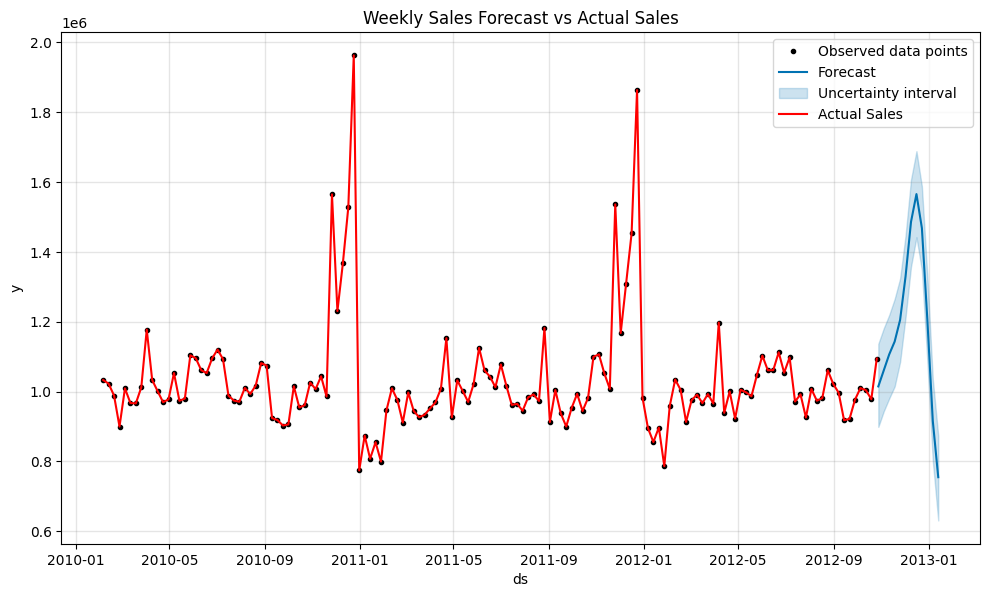

In [366]:
fig = model45.plot(forecast45)
ax = fig.gca()
ax.plot(Store45prophet['ds'], Store45prophet['y'], color='red', label='Actual Sales')
ax.legend()
plt.title('Weekly Sales Forecast vs Actual Sales')
plt.show()

---Seems good but not perfect switching to itertool technique.

In [405]:
# Define the range of p, d, q values
p_values = range(0, 4)
d_values = range(0, 2)
q_values = range(0, 4)

# Store AIC values for each model
aic_values = []

# Iterate over p, d, q values and fit ARIMA models
for p in p_values:
    for d in d_values:
        for q in q_values:
            try:
                # Fit ARIMA model
                model = ARIMA(Store45_new, order=(p, d, q),freq='W-FRI')
                result = model.fit()

                # Append the (p,d,q) values and corresponding AIC to the list
                aic_values.append(((p, d, q), result.aic))
                print(f"ARIMA({p},{d},{q}) fitted successfully with AIC: {result.aic}")

            except Exception as e:
                # Print error message if model fitting fails
                print(f"Error fitting ARIMA({p},{d},{q}): {e}")

# Check if any models were fitted successfully
if not aic_values:
    print("No models were successfully fitted.")
else:
    print(f"Models fitted: {len(aic_values)}")

    # Find the model with the lowest AIC
    best_model = min(aic_values, key=lambda x: x[1])
    print(f'Best model: ARIMA{best_model[0]} with AIC: {best_model[1]}')

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(0,0,0) fitted successfully with AIC: -161.34618041810256
ARIMA(0,0,1) fitted successfully with AIC: -183.6499604001117


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(0,0,2) fitted successfully with AIC: -192.63201978098112


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(0,0,3) fitted successfully with AIC: -193.03231340497211
ARIMA(0,1,0) fitted successfully with AIC: -156.6377595612218
ARIMA(0,1,1) fitted successfully with AIC: -172.73467884373042


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(0,1,2) fitted successfully with AIC: -171.400528471723


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(0,1,3) fitted successfully with AIC: -186.3195973050507
ARIMA(1,0,0) fitted successfully with AIC: -194.56715127882222


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(1,0,1) fitted successfully with AIC: -193.39057730764375


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(1,0,2) fitted successfully with AIC: -191.9633379274902


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(1,0,3) fitted successfully with AIC: -190.3457073333281
ARIMA(1,1,0) fitted successfully with AIC: -169.5323116925583


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(1,1,1) fitted successfully with AIC: -188.48659939801544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(1,1,2) fitted successfully with AIC: -187.46833885272378


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(1,1,3) fitted successfully with AIC: -194.42933061701962


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,0,0) fitted successfully with AIC: -193.69377549853925


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,0,1) fitted successfully with AIC: -197.03981501297292


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,0,2) fitted successfully with AIC: -198.92980815780712


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,0,3) fitted successfully with AIC: -204.06468396971997
ARIMA(2,1,0) fitted successfully with AIC: -169.16531532826414


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,1,1) fitted successfully with AIC: -187.79966510129327


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,1,2) fitted successfully with AIC: -184.30375670189107


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(2,1,3) fitted successfully with AIC: -192.5543248397018
ARIMA(3,0,0) fitted successfully with AIC: -192.5195317514696


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(3,0,1) fitted successfully with AIC: -195.76883337865524


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(3,0,2) fitted successfully with AIC: -202.20226528833354


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(3,0,3) fitted successfully with AIC: -202.57314335703146
ARIMA(3,1,0) fitted successfully with AIC: -171.8894502186048


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(3,1,1) fitted successfully with AIC: -178.02126588932083


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(3,1,2) fitted successfully with AIC: -184.651680065574


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



ARIMA(3,1,3) fitted successfully with AIC: -192.82295915030863
Models fitted: 32
Best model: ARIMA(2, 0, 3) with AIC: -204.06468396971997


In [408]:
model_SARIMAX = SARIMAX(Store45_new,
                order=(2, 0, 3),       # non-seasonal order
                seasonal_order=(2, 0, 3, 52),  # seasonal order
                exog=None)
sarima_result = model_SARIMAX.fit()
predictions_Sarima45 = sarima_result.predict()
print(sarima_result.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-FRI will be used.



                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(2, 0, 3)x(2, 0, 3, 52)   Log Likelihood                 163.057
Date:                            Wed, 23 Oct 2024   AIC                           -304.114
Time:                                    22:04:33   BIC                           -272.238
Sample:                                04-09-2010   HQIC                          -291.161
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0301      0.458     -0.066      0.948      -0.928       0.867
ar.L2          0.2241      0.420   

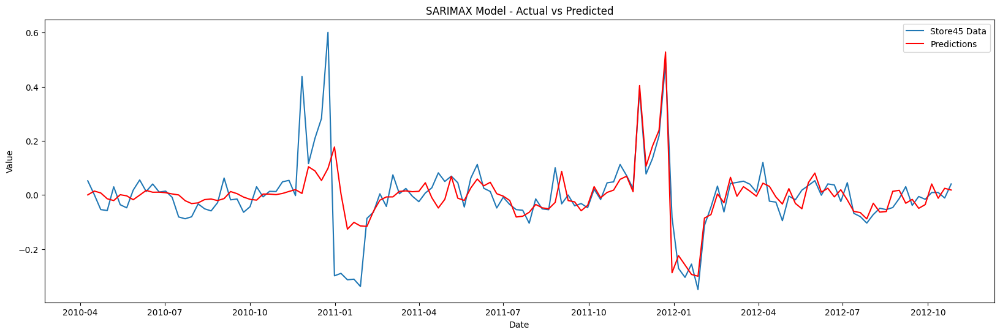

In [409]:
plt.figure(figsize=(20,6))
plt.plot(Store45_new, label='Store45 Data')
plt.plot(predictions_Sarima45, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [410]:
mse=mean_squared_error(Store45_new,predictions_Sarima45)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.008958782323999517


In [411]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.09465084428571949


In [412]:
forecast_steps = 12
forecastsarima45 = sarima_result.forecast(steps=forecast_steps)


In [413]:
forecast_dfsarima45 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecastsarima45})


In [414]:
forecast_dfsarima45.set_index('Date',inplace=True)


In [415]:
combined_dfsarimax45 = pd.concat([Store45_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_dfsarima45.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_dfsarimax45 = combined_dfsarimax45.sort_values('Date')

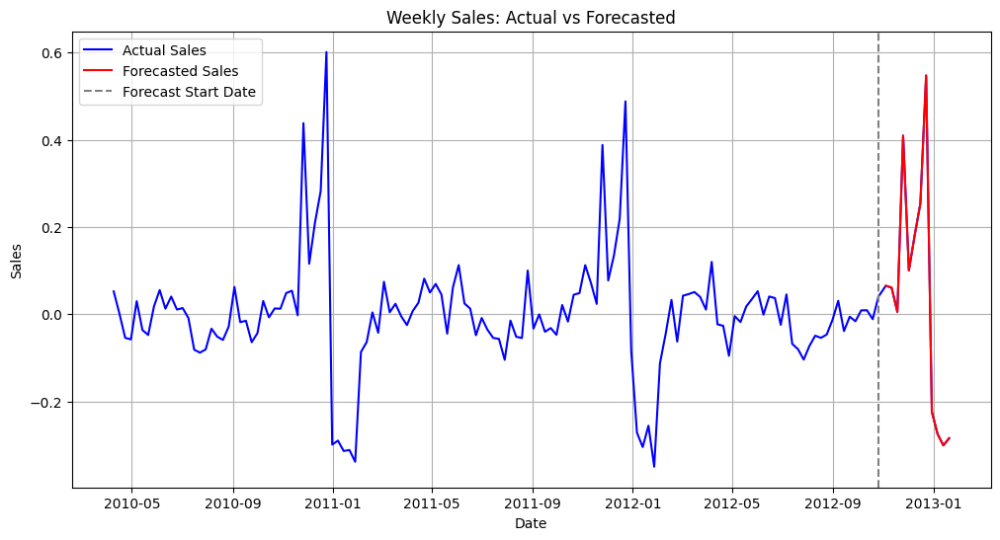

In [416]:
plt.figure(figsize=(12, 6))
plt.plot(combined_dfsarimax45.index, combined_dfsarimax45['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_dfsarima45.index, forecast_dfsarima45['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data5, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()


---So in January 2011 sales is down which was same in January 2012 and prediction looks real. At January 2013 we have same downfall as previous years, we can go with this model.

## Store 18 Forecasting

In [367]:
Store18=df1[df1['Store']==18].groupby('Date')['Weekly_Sales'].sum().reset_index()

In [368]:
Store18.set_index('Date',inplace=True)

In [369]:
adf=adfuller(Store18['Weekly_Sales'])
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


Figure(640x480)


(array([14700., 14791., 14883., 14975., 15065., 15156., 15248., 15340.,
        15431., 15522., 15614.]),
 [Text(14700.0, 0, '2010-04'),
  Text(14791.0, 0, '2010-07'),
  Text(14883.0, 0, '2010-10'),
  Text(14975.0, 0, '2011-01'),
  Text(15065.0, 0, '2011-04'),
  Text(15156.0, 0, '2011-07'),
  Text(15248.0, 0, '2011-10'),
  Text(15340.0, 0, '2012-01'),
  Text(15431.0, 0, '2012-04'),
  Text(15522.0, 0, '2012-07'),
  Text(15614.0, 0, '2012-10')])

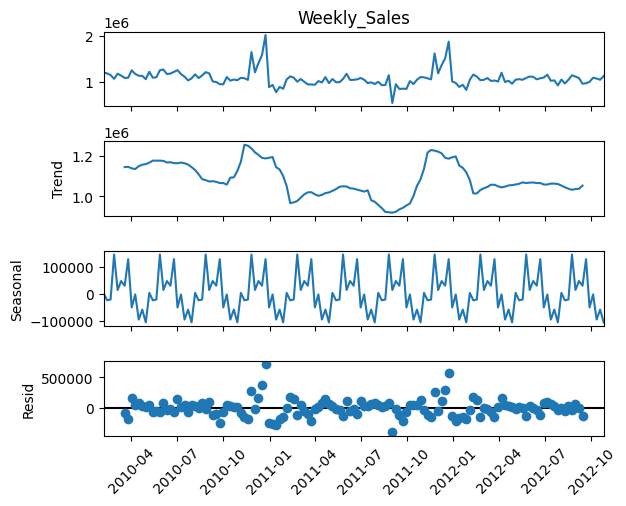

In [370]:
Decomposition=seasonal_decompose(Store18['Weekly_Sales'],period=13)
print(Decomposition.plot())
plt.xticks(rotation=45)

In [371]:
meanstore18sales=Store18.rolling(window=10).mean()
stdstore18sales=Store18.rolling(window=10).std()

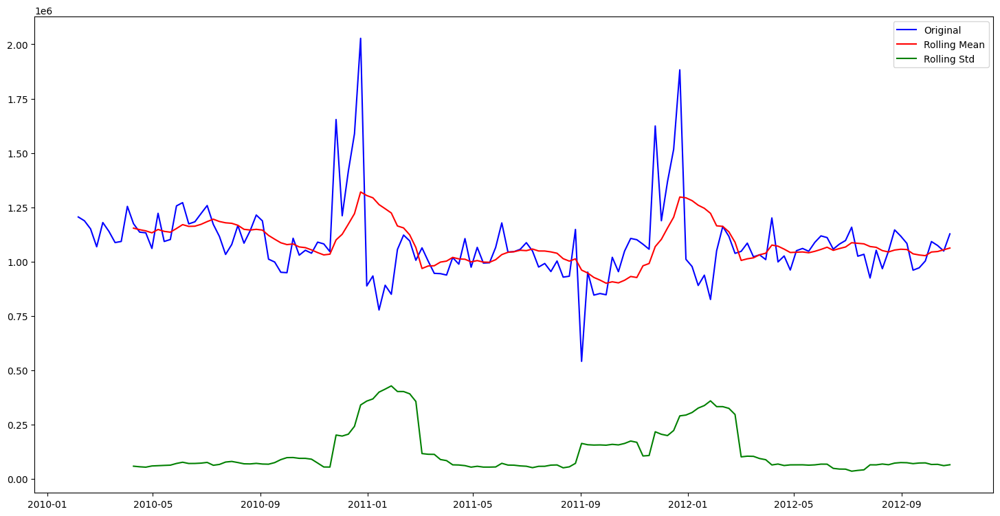

In [372]:
plt.figure(figsize=(18,9))
plt.plot(Store18['Weekly_Sales'],label='Original',color='blue')
plt.plot(meanstore18sales['Weekly_Sales'],label='Rolling Mean',color='red')
plt.plot(stdstore18sales,label='Rolling Std',color='green')
plt.legend()
plt.show()

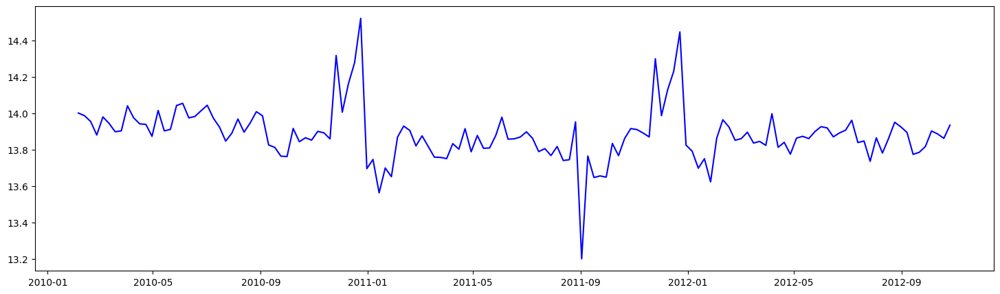

In [373]:
store18_log=np.log(Store18)
plt.figure(figsize=(18,5))
plt.plot(store18_log,label='Original',color='blue')

In [374]:
logmeanstore18sales=store18_log.rolling(window=10).mean()
logstdstore18sales=store18_log.rolling(window=10).std()

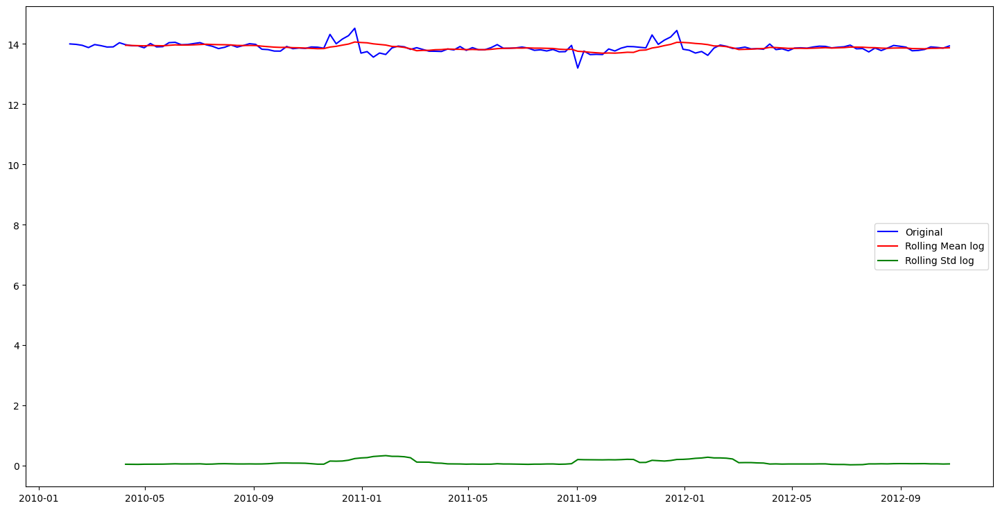

In [375]:
plt.figure(figsize=(18,9))
plt.plot(store18_log,label='Original',color='blue')
plt.plot(logmeanstore18sales,label='Rolling Mean log',color='red')
plt.plot(logstdstore18sales,label='Rolling Std log',color='green')
plt.legend(loc='best')
plt.show()

In [376]:
Store18_new= store18_log-logmeanstore18sales
Store18_new.dropna(inplace=True)

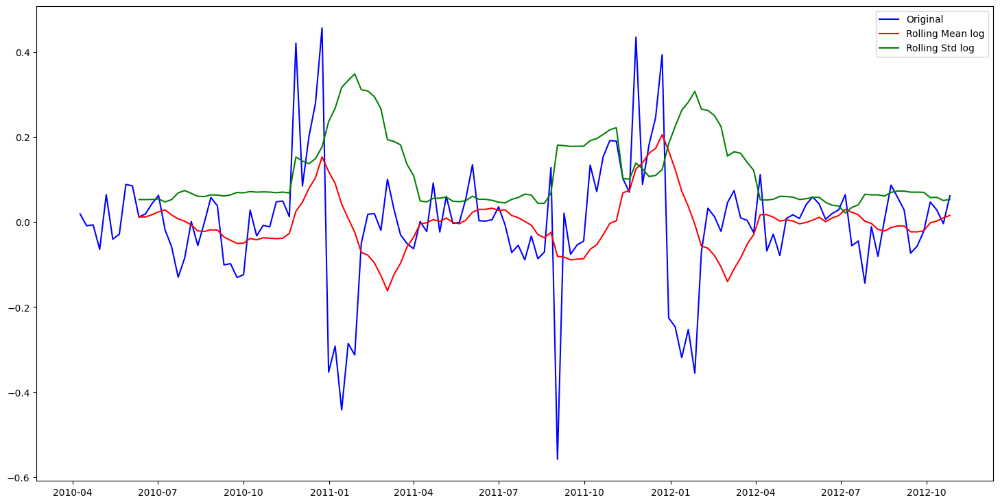

In [377]:
Mean_Store18_new = Store18_new.rolling(window=10).mean()
Std_Store18_new = Store18_new.rolling(window=10).std()
plt.figure(figsize=(18,9))
plt.plot(Store18_new,label='Original',color='blue')
plt.plot(Mean_Store18_new,label='Rolling Mean log',color='red')
plt.plot(Std_Store18_new,label='Rolling Std log',color='green')
plt.legend()
plt.show()

In [378]:
adf=adfuller(Store18_new)
pval= adf[1]
if pval<0.05:
  print('Data is stationary')
else:
  print('Data is not stationary')

Data is stationary


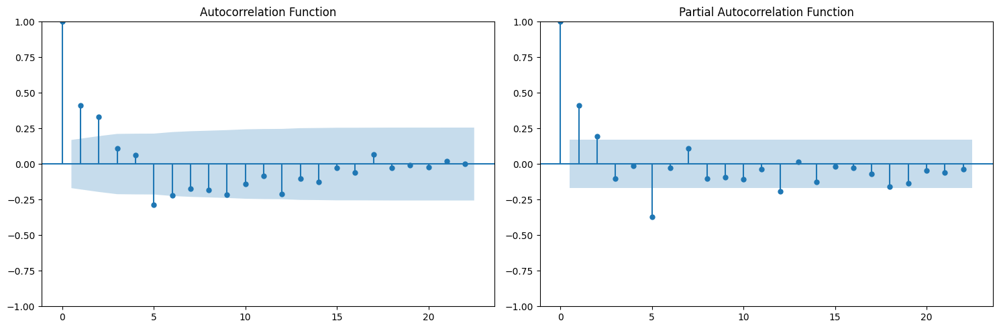

In [379]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,5))
plot_acf(Store18_new, ax=ax1)
ax1.set_title('Autocorrelation Function')

plot_pacf(Store18_new, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()



---Since we get better results with itertool for this data getting values of p,d,q by itertool method.



In [380]:
Store18_new.index = pd.to_datetime(Store18_new.index)
Store18_new = Store18_new.asfreq('W-FRI')  # Assuming weekly data on Fridays

In [381]:
# Define the range of p, d, q values
p_values = range(0, 4)
d_values = range(0, 2)
q_values = range(0, 4)

# Store AIC values for each model
aic_values = []

# Iterate over p, d, q values and fit ARIMA models
for p in p_values:
    for d in d_values:
        for q in q_values:
            try:
                # Fit ARIMA model
                model = ARIMA(Store18_new, order=(p, d, q))
                result = model.fit()

                # Append the (p,d,q) values and corresponding AIC to the list
                aic_values.append(((p, d, q), result.aic))
                print(f"ARIMA({p},{d},{q}) fitted successfully with AIC: {result.aic}")

            except Exception as e:
                # Print error message if model fitting fails
                print(f"Error fitting ARIMA({p},{d},{q}): {e}")

# Check if any models were fitted successfully
if not aic_values:
    print("No models were successfully fitted.")
else:
    print(f"Models fitted: {len(aic_values)}")

    # Find the model with the lowest AIC
    best_model = min(aic_values, key=lambda x: x[1])
    print(f'Best model: ARIMA{best_model[0]} with AIC: {best_model[1]}')


ARIMA(0,0,0) fitted successfully with AIC: -137.0346994189597
ARIMA(0,0,1) fitted successfully with AIC: -151.10759928150873
ARIMA(0,0,2) fitted successfully with AIC: -160.35545446834743
ARIMA(0,0,3) fitted successfully with AIC: -159.77073490613753
ARIMA(0,1,0) fitted successfully with AIC: -116.08361191678031
ARIMA(0,1,1) fitted successfully with AIC: -142.60198882684722
ARIMA(0,1,2) fitted successfully with AIC: -140.6200501611499
ARIMA(0,1,3) fitted successfully with AIC: -154.11729582771545
ARIMA(1,0,0) fitted successfully with AIC: -160.09829914853333
ARIMA(1,0,1) fitted successfully with AIC: -161.09102007091633
ARIMA(1,0,2) fitted successfully with AIC: -162.07021618142488
ARIMA(1,0,3) fitted successfully with AIC: -161.7790403638221
ARIMA(1,1,0) fitted successfully with AIC: -141.1007192036862
ARIMA(1,1,1) fitted successfully with AIC: -140.7306214786508
ARIMA(1,1,2) fitted successfully with AIC: -141.74687182395462
ARIMA(1,1,3) fitted successfully with AIC: -155.631699342644

In [382]:
model = ARIMA(Store18_new, order=(3,0,2))# fitting the model
arima_result = model.fit()

# Get predictions on historical data
predictions = arima_result.predict()

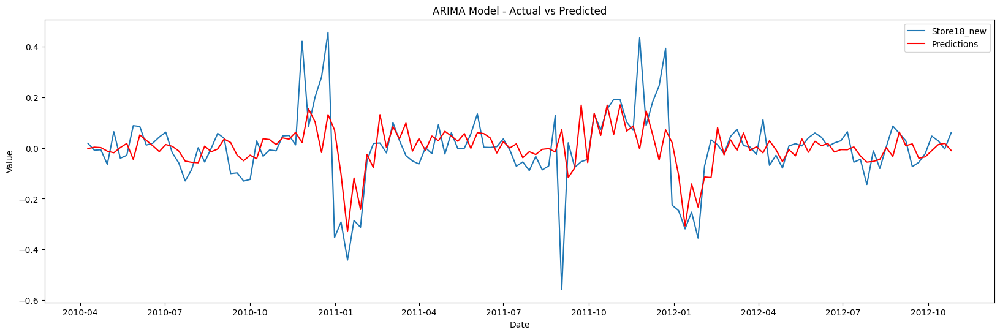

In [383]:
plt.figure(figsize=(20,6))
plt.plot(Store18_new, label='Store18_new')
plt.plot(predictions, color='red', label='Predictions')
plt.title('ARIMA Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [384]:
mse=mean_squared_error(Store18_new,predictions)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.014884774948701104


In [385]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')


Root Mean Squared_Error  0.12200317597792733


In [386]:
forecast_steps = 12
forecast18 = arima_result.forecast(steps=forecast_steps)


In [387]:
Store18_new.tail()

,Weekly_Sales
Date,
2012-09-28,-0.021809
2012-10-05,0.046868
2012-10-12,0.028062
2012-10-19,-0.003924
2012-10-26,0.061235


In [388]:
end_date_actual_data = pd.to_datetime('2012-10-26')  # Using the last date from your data

# Generate dates for the forecasted period
forecast_start_date = end_date_actual_data + pd.DateOffset(weeks=1)  # Start from the next week (2012-11-02)
forecast_end_date = forecast_start_date + pd.DateOffset(weeks=12)  # 12 weeks from the start date

# Create a date range for the forecast (12 weeks)
forecast_dates = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='W-SUN')

# Display the forecast dates
print(forecast_dates)


DatetimeIndex(['2012-11-04', '2012-11-11', '2012-11-18', '2012-11-25',
               '2012-12-02', '2012-12-09', '2012-12-16', '2012-12-23',
               '2012-12-30', '2013-01-06', '2013-01-13', '2013-01-20'],
              dtype='datetime64[ns]', freq='W-SUN')


In [389]:
forecast_df18 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast18})


In [390]:
forecast_df18.set_index('Date',inplace=True)


In [391]:
combined_df18 = pd.concat([Store18_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_df18.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_df18 = combined_df18.sort_values('Date')

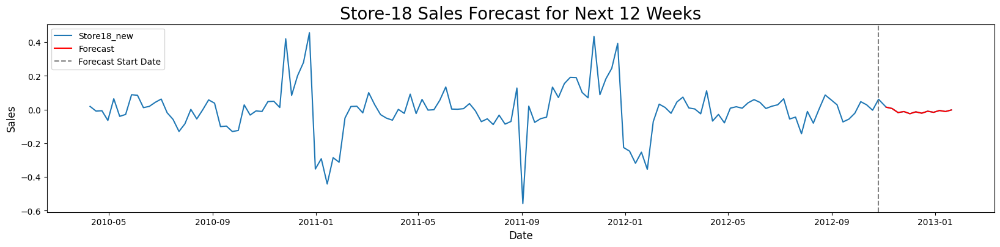

In [392]:
plt.figure(figsize=(20, 4))
plt.plot(combined_df18.index,combined_df18['Sales'], label='Store18_new')
plt.plot(forecast_df18.index,forecast_df18['Forecasted_Sales'], label='Forecast', color='red')
plt.axvline(x=end_date_actual_data, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Store-18 Sales Forecast for Next 12 Weeks',fontsize=20)
plt.xlabel('Date',fontsize=12)
plt.ylabel('Sales',fontsize=12)
plt.legend()
plt.show()



---It is definite that data has seasonality so switching to sarimax putting exegeneous var as none, if needed it can be changed.



In [393]:
model_SARIMAX = SARIMAX(Store42_new,
                order=(3, 0, 3),       # non-seasonal order
                seasonal_order=(3, 0, 3, 52),  # seasonal order
                exog=None)  # Add external regressors here if necessary
sarima_result = model_SARIMAX.fit()
predictions_Sarima42 = sarima_result.predict()
print(sarima_result.summary())


                                     SARIMAX Results                                      
Dep. Variable:                       Weekly_Sales   No. Observations:                  134
Model:             SARIMAX(3, 0, 3)x(3, 0, 3, 52)   Log Likelihood                 269.769
Date:                            Wed, 23 Oct 2024   AIC                           -513.539
Time:                                    19:29:11   BIC                           -475.867
Sample:                                04-09-2010   HQIC                          -498.230
                                     - 10-26-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4285      0.786     -0.545      0.586      -1.969       1.112
ar.L2         -0.8094      0.206   

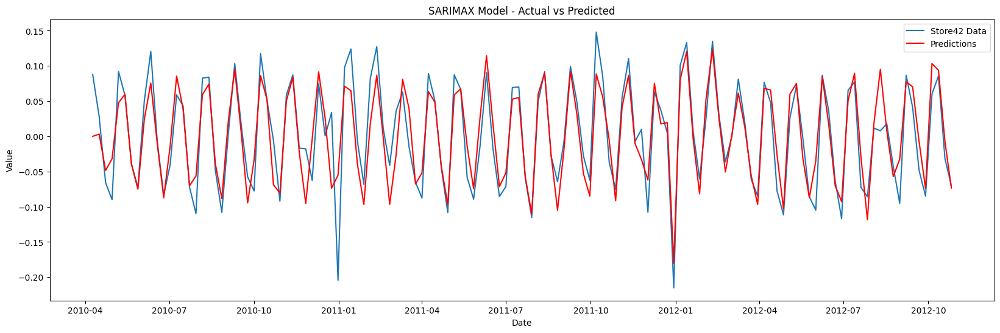

In [394]:
plt.figure(figsize=(20,6))
plt.plot(Store42_new, label='Store42 Data')
plt.plot(predictions_Sarima42, color='red', label='Predictions')
plt.title('SARIMAX Model - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [395]:
mse=mean_squared_error(Store42_new,predictions_Sarima42)
print(f'Mean Squared_Error  {mse}')

Mean Squared_Error  0.0011706297642823272


In [396]:
rmse=np.sqrt(mse)
print(f'Root Mean Squared_Error  {rmse}')

Root Mean Squared_Error  0.03421446717811527


In [397]:
forecast_steps = 12
forecastsarima42 = sarima_result.forecast(steps=forecast_steps)


In [398]:
forecast_dfsarima42 = pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecastsarima42})


In [399]:
forecast_dfsarima42.set_index('Date',inplace=True)


In [400]:
combined_dfsarimax42 = pd.concat([Store42_new.rename(columns={'Weekly_Sales': 'Sales'}),
    forecast_dfsarima42.rename(columns={'Forecasted_Sales': 'Sales'})])
combined_dfsarimax42 = combined_dfsarimax42.sort_values('Date')

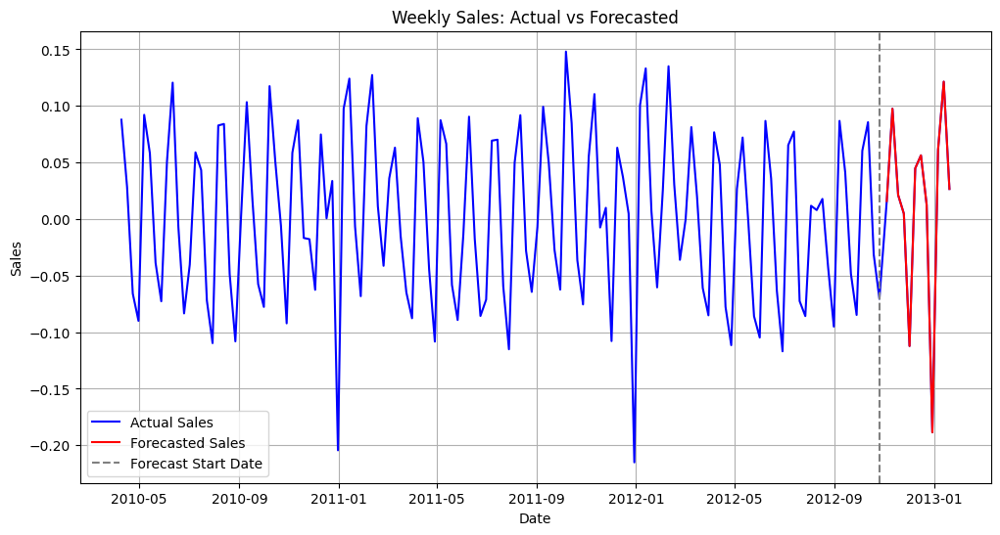

In [401]:
plt.figure(figsize=(12, 6))
plt.plot(combined_dfsarimax42.index, combined_dfsarimax42['Sales'], label='Actual Sales', color='blue')
plt.plot(forecast_dfsarima42.index, forecast_dfsarima42['Forecasted_Sales'], label='Forecasted Sales', color='red')
plt.axvline(x=end_date_actual_data5, color='gray', linestyle='--', label='Forecast Start Date')
plt.title('Weekly Sales: Actual vs Forecasted')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()


---Model looks promising there is a downfall at jan 2013, also previous months downfalls as well as acheivement is seen at same period of time.



*   For getting good model pro preprocessing is required wherever it is required, deciding right step at each point is must.
*   Itertool technique works better for this data to predict, so for predicting for other stores we can go with itertool technique.

